<a href="https://colab.research.google.com/github/AnonymousAlzheimersGaze/Eye-Gaze-Alzheimers-Paper/blob/main/Scans%20data/Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Author: Carlos Antunes (2022)

- Transform data from MATLAB to pandas dataframe. 3 panda dataframes, one for each class (nc_allData, mci_allData, ad_allData). Each row represents a scan.
- Presents some statistics of the data.
- Remove outlier fixation points.
- Visualization: plot some scans, fixation maps, density maps, etc.
- Store the 3 dataframes. Store every single scan separatly in a numpy format. Store the labels and subject IDs in numpy arrays.

# Imports and Google Drive mount

In [ ]:
# Install a pip package in the current Jupyter kernel
import sys
!{sys.executable} -m pip install mat73

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive, files # to use Google Drive
import mat73
import numpy as np
import matplotlib.pyplot as plt # to plot
from scipy.io import loadmat # to load matlab files
from scipy.stats import gaussian_kde
import h5py # to load matlab files v7.3
import pandas as pd
from functools import reduce
import copy
from scipy import ndimage # for image resize

In [ ]:
drive.flush_and_unmount()
drive.mount('/content/drive/') # connect to Google Drive
root_path = '/content/drive/My Drive/dataset' # change directory to my Google Drive

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive/


# Load data

Auxilary function to transform from 2D coordinates to 1D and vice versa

In [ ]:
def coordinates_transform(point_vector_form):
  fixation_image = np.zeros(128*128)
  fixation_image[point_vector_form] = 1
  fixation_image = fixation_image.reshape(128, 128)
  coord_point = np.nonzero(fixation_image)
  return coord_point

def coordinates_untransform(point_x, point_y):
  if 0 <= point_x <= 127 and 0 <= point_y <= 127: 
    pt = 128*point_x+point_y
    return pt
  else:
    return False

## Load Subjects Data including PET Scans

Load all data that is in MatLab format and put it in a pandas dataframe.

In [ ]:
def create_DataFrame(temp_data, state, month, source_table_name):
  # id
  allData = pd.DataFrame(temp_data['feat']['id'])
  allData.rename(columns={'str': 'Subject ID'}, inplace=True)

  # name of source table
  allData['Source table name'] = source_table_name

  # source table index
  allData['Source table index'] = list(np.array(range(len(list(temp_data['feat']['sex']))))+1)
  
  # class
  allData['Class'] = state

  # Month of the scan in the study
  allData['Month'] = month

  # age
  allData['Age'] = temp_data['feat']['age']
  allData.loc[allData['Age'] == -1, 'Age'] = np.nan

  # sex
  allData['Sex'] = list(temp_data['feat']['sex'])

  # scans
  aux = []
  #all_scans = temp_data['feat']['X']
  #aux = [np.reshape(all_scans.transpose()[i], (128,128,60), order="F") for i in range(0, all_scans.shape[1])]
  #allData['Scan'] = aux

  for index in list(np.array(range(len(list(temp_data['feat']['sex']))))+1):
    load_npy = np.load(root_path + '/PETs_numpy_prof/' + source_table_name + '_' + str(index)  + '.npy') / 32700
    aux.append(load_npy)
  allData['Scan'] = aux

  # MMSE
  allData['MMSE'] = temp_data['feat']['MMSE']
  allData.loc[allData['MMSE'] == -1, 'MMSE'] = np.nan

  # CDR
  allData['CDR'] = temp_data['feat']['CDR']
  allData.loc[allData['CDR'] == -1, 'CDR'] = np.nan

  return allData

Get the ID of the brain scans with fixations

In [ ]:
temp_data = loadmat(root_path+'/eye_fixation/PET_AD59.mat')
ad59_allData = pd.DataFrame(temp_data['PET_AD59']['id'][0,0])
ad59_allData.rename(columns={0: 'Subject ID'}, inplace=True)

temp_data = loadmat(root_path+'/eye_fixation/PET_MCInc59.mat')
mcinc59_allData = pd.DataFrame(temp_data['PET_MCInc59']['id'][0,0])
mcinc59_allData.rename(columns={0: 'Subject ID'}, inplace=True)

temp_data = loadmat(root_path+'/eye_fixation/PET_NC59.mat')
nc59_allData = pd.DataFrame(temp_data['PET_CN59']['id'][0,0])
nc59_allData.rename(columns={0: 'Subject ID'}, inplace=True)

Get the data from all the ADNI patients

AD - Month 0 (file was in a different format)

In [ ]:
temp_data = loadmat(root_path+'/ADNI/FDG_PET_AD_Baseline_VI.mat') 
pet_ad_Month0_allScans = temp_data['feat']['X'][0,0] # array with all the scans of all the patients

list_of_ids = []
list_of_mmse = []
list_of_cdr = []
list_of_scans = []
for i in range(0, temp_data['feat']['id'][0,0].shape[1]):
  list_of_ids.append(temp_data['feat']['id'][0,0][0,i][0][0])
  list_of_mmse.append(temp_data['feat']['MMSE'][0][0][0][i])
  list_of_cdr.append(temp_data['feat']['CDR'][0][0][0][i])

#list_of_scans = [np.reshape(pet_ad_Month0_allScans.transpose()[i], (128,128,60), order="F") for i in range(0, pet_ad_Month0_allScans.shape[1])]
#list_of_scans = [pet_ad_Month0_allScans.transpose()[i] for i in range(0, pet_ad_Month0_allScans.shape[1])]
list_of_scans = []
for index in range(1, temp_data['feat']['id'][0,0].shape[1]+1):
  load_npy = np.load(root_path + '/PETs_numpy_prof/' + 'FDG_PET_AD_Baseline_VI' + '_' + str(index)  + '.npy') / 32700
  list_of_scans.append(load_npy)

ad_Month0_allData = pd.DataFrame(list_of_ids)
ad_Month0_allData.rename(columns={0: 'Subject ID'}, inplace=True)
ad_Month0_allData['MMSE'] = list_of_mmse
ad_Month0_allData.loc[ad_Month0_allData['MMSE'] == -1, 'MMSE'] = np.nan
ad_Month0_allData['CDR'] = list_of_cdr
ad_Month0_allData.loc[ad_Month0_allData['CDR'] == -1, 'CDR'] = np.nan
ad_Month0_allData['Age'] = temp_data['feat']['age'][0][0][0]
ad_Month0_allData.loc[ad_Month0_allData['Age'] == -1, 'Age'] = np.nan
ad_Month0_allData['Scan'] = list_of_scans
ad_Month0_allData['Sex'] = list(temp_data['feat']['sex'][0][0][0])
ad_Month0_allData['Class'] = 2
ad_Month0_allData['Month'] = 0
ad_Month0_allData['Source table name'] = 'FDG_PET_AD_Baseline_VI'
ad_Month0_allData['Source table index'] = list(np.array(range(len(list(temp_data['feat']['sex'][0][0][0]))))+1)

AD - Month 6, 12 and 24

In [ ]:
temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_AD_Month6_VI.mat')
ad_Month6_allData = create_DataFrame(temp_data, 2, 6, source_table_name='FDG_PET_AD_Month6_VI')

temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_AD_Month12_VI.mat')
ad_Month12_allData = create_DataFrame(temp_data, 2, 12, source_table_name='FDG_PET_AD_Month12_VI')

temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_AD_Month24_VI.mat')
ad_Month24_allData = create_DataFrame(temp_data, 2, 24, source_table_name='FDG_PET_AD_Month24_VI')

MCI - Month 0, 6, 12 and 24

In [ ]:
temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_MCI_Baseline_VI.mat')
mci_Month0_allData = create_DataFrame(temp_data, 1, 0, source_table_name='FDG_PET_MCI_Baseline_VI')

temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_MCI_Month6_VI.mat')
mci_Month6_allData = create_DataFrame(temp_data, 1, 6, source_table_name='FDG_PET_MCI_Month6_VI')

temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_MCI_Month12_VI.mat')
mci_Month12_allData = create_DataFrame(temp_data, 1, 12, source_table_name='FDG_PET_MCI_Month12_VI')

temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_MCI_Month24_VI.mat')
mci_Month24_allData = create_DataFrame(temp_data, 1, 24, source_table_name='FDG_PET_MCI_Month24_VI')

NC - Month 0, 6, 12 and 24

In [ ]:
temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_CN_Baseline_VI.mat')
nc_Month0_allData = create_DataFrame(temp_data, 0, 0, source_table_name='FDG_PET_CN_Baseline_VI')

temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_CN_Month6_VI.mat')
nc_Month6_allData = create_DataFrame(temp_data, 0, 6, source_table_name='FDG_PET_CN_Month6_VI')

temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_CN_Month12_VI.mat')
nc_Month12_allData = create_DataFrame(temp_data, 0, 12, source_table_name='FDG_PET_CN_Month12_VI')

temp_data = mat73.loadmat(root_path+'/ADNI/FDG_PET_CN_Month24_VI.mat')
nc_Month24_allData = create_DataFrame(temp_data, 0, 24, source_table_name='FDG_PET_CN_Month24_VI')

## Load Fixations and Durations


Create a dataframe with the information regarding the doctors fixations. The dataframe has 3 columns: subject id, list of locations of fixation points per slice and durations per location per slice.

In [ ]:
def create_fixations_dataframe(class_nr, all_data, temp_data):
  # brain fixations locations
  # temp_data['brainfixationsequence'][class_nr, patient_nr, slice_nr]
  all_fixations = temp_data['brainfixationsequence'][class_nr,:,:]

  fix = []
  aux = []
  for patient in range(0, all_fixations.shape[0]):
    for slice in range(0, all_fixations.shape[1]):
      temp = list(np.squeeze(all_fixations[patient][slice]))
      if len(temp) != 0:
        temp = [item-1 for item in temp]
        matrix = np.zeros(128*128)
        matrix[temp] = 1
        matrix = np.reshape(matrix, (128,128))
        matrix_rot = np.rot90(matrix)
        coordinat = np.nonzero(matrix_rot)
        temp = []
        for cox, coy in zip(coordinat[0], coordinat[1]):
          temp.append(coordinates_untransform(cox, coy))
      aux.append(temp)
      if slice == all_fixations.shape[1]-1:
          fix.append([aux])
          aux = []
  all_data['Fixations'] = pd.DataFrame(fix)


# a = np.zeros(128*128)
# a[5944-1] = 1
# a[8124-1] = 1
# a[6589-1] = 1
# a = np.reshape(a, (128,128))
# b = np.rot90(a)
# print(np.nonzero(b))



  # brain fixations durations
  #temp_data['brain'][0, class_nr][patient_nr][128, 128, slice_nr]
  all_durations = temp_data['brain'][0,class_nr]
  dur = []
  for patient_nr in range(0, all_durations.shape[0]):
    for slice_nr in range(0, all_durations.shape[3]):
      temp = np.transpose(all_durations[patient_nr,:,:,slice_nr])
      coords = np.nonzero(temp)
      times = []
      for i, j in list(zip(coords[0], coords[1])):
        times.append(temp[i,j])
      aux.append(list(zip(*coords, times)))
      if slice_nr == all_durations.shape[3]-1:
        dur.append([aux])
        aux = []

  all_data['Durations'] = pd.DataFrame(dur)

In [ ]:
# matrix_rot = np.zeros((128,128,64))
# matrix_rot[1,34,2] = 1
# matrix_rot[1,34,3] = 1
# coordinat = np.nonzero(matrix_rot)
# print(coordinat)

In [ ]:
temp_data = loadmat(root_path+'/eye_fixation/BrainEyeTrack.mat')
create_fixations_dataframe(0, nc59_allData, temp_data)
create_fixations_dataframe(1, mcinc59_allData, temp_data)
create_fixations_dataframe(2, ad59_allData, temp_data)

Add slices with no fixations to make up 60 slices

In [ ]:
def add_extra_empy_slices(allData):
  [ allData.at[scan_index, 'Fixations'].append([]) for scan_index in range(allData.shape[0]) for i in range(10)]

In [ ]:
add_extra_empy_slices(nc59_allData)
add_extra_empy_slices(mcinc59_allData)
add_extra_empy_slices(ad59_allData)

## Creation of Final DataFrame with all Data

Merge the data with fixations with the data without fixations in the same DataFrame for Month 24

In [ ]:
nc_Month24_allData = pd.merge(nc59_allData, nc_Month24_allData, how ='outer', on =['Subject ID'])
ad_Month24_allData = pd.merge(ad59_allData, ad_Month24_allData, how ='outer', on =['Subject ID'])
mci_Month24_allData = pd.merge(mcinc59_allData, mci_Month24_allData, how ='outer', on =['Subject ID'])

Merge all data of the same category in the same Dataframe

In [ ]:
frames = [nc_Month0_allData, nc_Month6_allData, nc_Month12_allData, nc_Month24_allData]
nc_allData = pd.concat(frames, ignore_index=True)
nc_allData['Scan ID'] = list(range(0, len(nc_allData))) # attribute a number id to each scan

frames = [ad_Month0_allData, ad_Month6_allData, ad_Month12_allData, ad_Month24_allData]
ad_allData = pd.concat(frames, ignore_index=True)
ad_allData['Scan ID'] = list(range(len(nc_allData), len(nc_allData)+len(ad_allData)))

frames = [mci_Month0_allData, mci_Month6_allData, mci_Month12_allData, mci_Month24_allData]
mci_allData = pd.concat(frames, ignore_index=True)
mci_allData['Scan ID'] = list(range(len(nc_allData)+len(ad_allData), len(nc_allData)+len(ad_allData)+len(mci_allData)))

Add a marker 1 to the scans with fixations and 0 to the scans without fixations

In [ ]:
def add_fixation_marker(allData):
  aux = []
  for index in range(0, allData.shape[0]):
    if type(allData.at[index, 'Fixations']) != list: 
      aux.append(0)
    else:
      aux.append(1)
  allData['Has Fix'] = pd.DataFrame(aux)   

add_fixation_marker(nc_allData)
add_fixation_marker(mci_allData)
add_fixation_marker(ad_allData)

Check fixations in the 'Fixations' column corresponds to the locations of the fixations in the 'Durations' column

In [ ]:
def verify_duration_fixation_slices(allData):
  # iterate over every scan
  for scan_index in range(allData.shape[0]):

    # skip if scan does not have fixations
    if allData.at[scan_index, "Has Fix"] == 0:
      continue

    # iterate over every slice of the scan
    for slice_nr in range(60):

      locations = allData.at[scan_index, "Fixations"][slice_nr]
      if len(locations) == 0:
        continue
      coord = coordinates_transform(locations)

      # iterate over the fixation point of a slice
      for point in allData.at[scan_index, "Durations"][slice_nr]:
        check = 0
        for coordenates in zip(coord[0], coord[1]):
          if point[0] == coordenates[0] and point[1] == coordenates[1]:
            check = 1
            break
          else:
            continue

        if check == 0:
          print("Incompatible fixations points in scan index ", scan_index, "slice nr ", slice_nr)
          return False

  print("Everything is alright")

verify_duration_fixation_slices(nc_allData)
verify_duration_fixation_slices(mci_allData)
verify_duration_fixation_slices(ad_allData)

Everything is alright
Everything is alright
Everything is alright


Each dataframe now has 10 columns: subject ID, class, age, sex of the subject, the entire 3D PET scan, the MMSE test score, the CDR test score, the doctors fixations points, the durations of fixations and the ID of the scan.

# Create mask to zero every zone that is not part of the brain

Create an elipse

In [ ]:
def create_circular_mask(h, w, a=1, b=1, center=None, radius=None):

    if center is None: # use the middle of the image
        center = (int(w/2), int(h/2))
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = ((X - center[0])**2) / (a**2) + ((Y-center[1])**2) / (b**2)
    #dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius

    mask_2 = np.empty((h,w))
    for i in range(h):
      for j in range(w):
        if mask[i][j] == True:
          mask_2[i][j] = 1.0
        elif mask[i][j] == False:
          mask_2[i][j] = 0.0
    return mask_2

Characteristic of the elipsis for each slice

In [ ]:
elipse_values = {}
elipse_values[0] = [6.9, 5.5, 50]
elipse_values[1] = [7, 6, 50]
elipse_values[2] = [7, 6, 50]
elipse_values[3] = [7, 6, 50]
elipse_values[4] = [7, 6, 50]
elipse_values[5] = [7, 6, 50]
elipse_values[6] = [7, 6, 50]
elipse_values[7] = [7, 6, 50]
elipse_values[8] = [7, 6, 50]
elipse_values[9] = [6.9, 5.8, 50]
elipse_values[10] = [6.9, 5.8, 50]
elipse_values[11] = [6.9, 5.8, 50]
elipse_values[12] = [6.7, 5.8, 50]
elipse_values[13] = [6.7, 5.8, 50]
elipse_values[14] = [6.7, 5.8, 50]
elipse_values[15] = [6.7, 5.8, 50]
elipse_values[16] = [6.7, 5.8, 50]
elipse_values[17] = [6.7, 5.8, 50]
elipse_values[18] = [6.7, 5.8, 50]
elipse_values[19] = [6.7, 5.8, 50]
elipse_values[19] = [6.7, 5.8, 52]
elipse_values[20] = [6.7, 5.8, 52]
elipse_values[21] = [6.7, 5.8, 52]
elipse_values[22] = [6.7, 5.7, 52]
elipse_values[23] = [6.7, 5.7, 54]
elipse_values[24] = [6.7, 5.7, 54]
elipse_values[25] = [6.7, 5.7, 54]
elipse_values[26] = [6.7, 5.7, 54]
elipse_values[27] = [6.7, 5.7, 54]
elipse_values[28] = [6.7, 5.7, 54]
elipse_values[29] = [6.7, 5.7, 54]
elipse_values[30] = [6.7, 5.7, 54]
elipse_values[31] = [6.7, 5.7, 52]
elipse_values[32] = [6.7, 5.7, 50]
elipse_values[33] = [6.7, 5.7, 50]
elipse_values[34] = [6.7, 5.7, 50]
elipse_values[35] = [6.7, 5.7, 50]
elipse_values[36] = [6.7, 5.7, 50]
elipse_values[37] = [6.7, 5.7, 50]
elipse_values[38] = [6.7, 5.7, 50]
elipse_values[39] = [6.7, 5.7, 48]
elipse_values[40] = [6.7, 5.7, 48]
elipse_values[41] = [6.7, 5.7, 46]
elipse_values[42] = [6.7, 6, 44]
elipse_values[43] = [6.7, 6.2, 40]
elipse_values[44] = [6.7, 6.2, 40]
elipse_values[45] = [6.7, 6.2, 40]
elipse_values[46] = [6.7, 6.2, 40]
elipse_values[47] = [6.7, 6.2, 40]
elipse_values[48] = [6.7, 6.2, 39]
elipse_values[49] = [6.7, 6.2, 39]
elipse_values[50] = [6.7, 6.2, 37]
elipse_values[51] = [6.7, 6.2, 37]
elipse_values[52] = [6.7, 6.2, 37]
elipse_values[53] = [6.7, 6.2, 36]
elipse_values[54] = [6.7, 6.2, 35]
elipse_values[55] = [6.7, 6.2, 33]
elipse_values[56] = [6.7, 6.2, 32]
elipse_values[57] = [6.7, 6.2, 29]
elipse_values[58] = [6.7, 6.2, 29]
elipse_values[59] = [6.7, 6.2, 29]

Mask all the scans

In [ ]:
def mask_all_scans(allData):
  for index, row in allData.iterrows():
    print(index)
    #np.save(root_path+"/PETs_numpy/original/"+str(row['Scan ID'])+ '.npy', row['Scan'])

    for slice_nr in range(60):
      # original slice with white in the null areas
      #slice = row['Scan'][:,:,slice_nr]
      # plt.imshow(slice, cmap='jet')
      # plt.colorbar()
      # plt.show()

      # original slice with white in the null areas
      #masked_array = np.ma.masked_where(slice == 0, slice)
      # cmap = plt.cm.get_cmap('jet') # Can be any colormap that you want after the cm
      # cmap.set_bad(color='white')
      # plt.imshow(masked_array, cmap='jet')
      # plt.colorbar()
      # plt.show()

      # mask the slice
      slice = row['Scan'][:,:,slice_nr]
      mask = create_circular_mask(128, 128, a=elipse_values[slice_nr][0], 
                                  b=elipse_values[slice_nr][1], radius=elipse_values[slice_nr][2])
      row['Scan'][:,:,slice_nr] = mask*slice


      # new slice with white in the mull areas
      # new_scan = row['Scan'][:,:,slice_nr].copy()
      # masked_array = np.ma.masked_where(new_scan == 0, new_scan)
      # cmap = plt.cm.get_cmap('jet') # Can be any colormap that you want after the cm
      # cmap.set_bad(color='white')
      # plt.imshow(masked_array, cmap=cmap)
      # plt.colorbar()
      # plt.show()

mask_all_scans(nc_allData)
mask_all_scans(ad_allData)
mask_all_scans(mci_allData)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

# Countings and Statistics of the Data

In [ ]:
def print_countings(Month0_allData, Month6_allData, Month12_allData, Month24_allData, all_data, pet_with_fixations):
  ## number of patients
  print("nr patients month0: ", len(Month0_allData['Subject ID'].index))
  print("nr patients month6: ", len(Month6_allData['Subject ID'].index))
  print("nr patients month12: ", len(Month12_allData['Subject ID'].index))
  print("nr patients month24: ", len(Month24_allData['Subject ID'].index))

  dfs_nc = [Month0_allData, Month6_allData, Month12_allData, Month24_allData]
  df_final = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='outer'), dfs_nc)
  print("Total nr of patients: ", len(df_final['Subject ID'].index))

  ## number of patients with scans without fixations
  scans_without_fixations = all_data[pd.isnull(all_data['Fixations'])]
  nr_subjects = scans_without_fixations['Subject ID'].value_counts()
  print("Total nr of patients with scans without fixations: ", len(nr_subjects))

  ## number of scans
  total_scans = len(Month0_allData['Subject ID'].index)+len(Month6_allData['Subject ID'].index)+len(Month12_allData['Subject ID'].index)+len(Month24_allData['Subject ID'].index)
  print("Total nr of scans: ", total_scans)
  print("Total nr of scans without fixations: ", total_scans-59)

  ## age
  print("---------------------")
  frames = [Month0_allData['Age'], Month6_allData['Age'], Month12_allData['Age'], Month24_allData['Age']]
  total_ages = pd.concat(frames)
  print("Average age of all scans: ", round(total_ages.mean(),1))
  print("Std deviation age of all scans: ", round(total_ages.std(),1))

  Month24_allData_without_fixation = Month24_allData[['Subject ID', 'Age', 'MMSE', 'CDR', 'Sex']].loc[~Month24_allData['Subject ID'].isin(pet_with_fixations['Subject ID'])].copy()
  Month24_allData_with_fixation = Month24_allData[['Subject ID', 'Age', 'MMSE', 'CDR', 'Sex']].loc[Month24_allData['Subject ID'].isin(pet_with_fixations['Subject ID'])].copy()

  frames = [Month0_allData['Age'], Month6_allData['Age'], Month12_allData['Age'], Month24_allData_without_fixation['Age']]
  total_ages_without_fixations = pd.concat(frames)
  print("Average age of scans without fixation: ", round(total_ages_without_fixations.mean(),1))
  print("Std deviation age of scans without fixation: ", round(total_ages_without_fixations.std(),1))

  print("Average age of scans with fixation: ", round(Month24_allData_with_fixation['Age'].mean(),1))
  print("Std deviation age of scans with fixation: ", round(Month24_allData_with_fixation['Age'].std(),1))

  ## MMSE
  print("---------------------")
  frames = [Month0_allData['MMSE'], Month6_allData['MMSE'], Month12_allData['MMSE'], Month24_allData_without_fixation['MMSE']]
  total_MMSE = pd.concat(frames)
  print("Average MMSE of all scans: ", round(total_MMSE.mean(),1))
  print("Std deviation MMSE of all scans: ", round(total_MMSE.std(),1))

  frames = [Month0_allData['MMSE'], Month6_allData['MMSE'], Month12_allData['MMSE'], Month24_allData_without_fixation['MMSE']]
  total_MMSE_without = pd.concat(frames)
  print("Average MMSE of scans without fixation: ", round(total_MMSE_without.mean(),1))
  print("Std deviation MMSE of scans without fixation: ", round(total_MMSE_without.std(),1))

  print("Average MMSE of scans with fixation: ", round(Month24_allData_with_fixation['MMSE'].mean(),1))
  print("Std deviation MMSE of scans with fixation: ", round(Month24_allData_with_fixation['MMSE'].std(),1))

  ## CDR
  print("---------------------")
  frames = [Month0_allData['CDR'], Month6_allData['CDR'], Month12_allData['CDR'], Month24_allData['CDR']]
  total_CDR = pd.concat(frames)
  print("Average CDR of all scans: ", round(total_CDR.mean(),1))
  print("Std deviation CDR of all scans: ", round(total_CDR.std(),1))

  frames = [Month0_allData['CDR'], Month6_allData['CDR'], Month12_allData['CDR'], Month24_allData_without_fixation['CDR']]
  total_CDR_without = pd.concat(frames)
  print("Average CDR of scans without fixation: ", round(total_CDR_without.mean(),1))
  print("Std deviation CDR of scans without fixation: ", round(total_CDR_without.std(),1))

  print("Average CDR of scans with fixation: ", round(Month24_allData_with_fixation['CDR'].mean(),1))
  print("Std deviation CDR of scans with fixation: ", round(Month24_allData_with_fixation['CDR'].std(),1))

  ## Sex
  print("---------------------")
  frames = [Month0_allData['Sex'], Month6_allData['Sex'], Month12_allData['Sex'], Month24_allData['Sex']]
  total_Sex = pd.concat(frames)
 
  print("Percentage of males in all scans: ", round((total_Sex[total_Sex == 'M'].count()/total_Sex.count())*100,1))

  frames = [Month0_allData['Sex'], Month6_allData['Sex'], Month12_allData['Sex'], Month24_allData_without_fixation['Sex']]
  total_Sex_without = pd.concat(frames)
  print("Percentage of males in scans without fixation: ", round((total_Sex_without[total_Sex_without == 'M'].count()/total_Sex_without.count())*100,1))

  print("Percentage of males in scans with fixation: ", round((Month24_allData_with_fixation['Sex'][Month24_allData_with_fixation['Sex'] == 'M'].count()/Month24_allData_with_fixation['Sex'].count())*100,1))
  
  ##
  print("---------------------")
  subject_id_month0 = list(Month0_allData['Subject ID'])
  subject_id_month6 = list(Month6_allData['Subject ID'])
  subject_id_month12 = list(Month12_allData['Subject ID'])
  subject_id_month24 = list(Month24_allData['Subject ID'])

  print("New subjects 0->6: ", len(np.setdiff1d(subject_id_month6,subject_id_month0)))
  print("Left subjects 0->6: ", len(np.setdiff1d(subject_id_month0,subject_id_month6)))

  print("New subjects 6->12: ", len(np.setdiff1d(subject_id_month12,subject_id_month6+subject_id_month0)))
  print("Left subjects 6->12: ", len(np.setdiff1d(subject_id_month6,subject_id_month12)))
  print("Rejoined 6->12: ", len([i for i in np.setdiff1d(subject_id_month12,subject_id_month6) if i in subject_id_month0]))

  print("New subjects 12->24: ", len(np.setdiff1d(subject_id_month24,subject_id_month12+subject_id_month6+subject_id_month0)))
  print("Left subjects 12->24: ", len(np.setdiff1d(subject_id_month12,subject_id_month24)))
  print("Rejoined 12->24: ", len([i for i in np.setdiff1d(subject_id_month24,subject_id_month12) if i in (subject_id_month0+subject_id_month0)]))


  #frames = [Month0_allData['Subject ID'], Month6_allData['Subject ID']]
  #common0 = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='inner'), frames)
  #print("New subjects 0->6: ", len(Month6_allData)-len(common0))

  #result = Month0_allData[~Month0_allData['Subject ID'].isin(common0['Subject ID'])]
  #print("Left subjects 0->6: ", len(result))

  #print("---------------------")
  #frames = [Month6_allData['Subject ID'], Month12_allData['Subject ID']]
  #common1 = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='inner'), frames)
  #print("New subjects 6->12: ", len(Month12_allData)-len(common1))

  # result = Month6_allData[~Month6_allData['Subject ID'].isin(common1['Subject ID'])]
  # print("Left subjects 6->12: ", len(result))

  # result = Month12_allData[~Month12_allData['Subject ID'].isin(common1['Subject ID'])]
  # frames = [result['Subject ID'], Month0_allData['Subject ID']]
  # final = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='inner'), frames)
  # print("Rejoined 6->12: ", len(final))


  # print("---------------------")
  # frames = [Month12_allData['Subject ID'], Month24_allData['Subject ID']]
  # common2 = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='inner'), frames)
  # print("New subjects 12->24: ", len(Month24_allData)-len(common2))

  # result = Month12_allData[~Month12_allData['Subject ID'].isin(common2['Subject ID'])]
  # print("Left subjects 12->24: ", len(result))

  # result = Month24_allData[~Month24_allData['Subject ID'].isin(common2['Subject ID'])]
  # frames = [result['Subject ID'], Month0_allData['Subject ID']]
  # final = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='inner'), frames)
  # print("Rejoined 12->24: ", len(final))

In [ ]:
print("--------------- NC --------------- ")
print_countings(nc_Month0_allData, nc_Month6_allData, nc_Month12_allData, nc_Month24_allData, nc_allData, nc59_allData)

--------------- NC --------------- 
nr patients month0:  102
nr patients month6:  94
nr patients month12:  85
nr patients month24:  84
Total nr of patients:  104
Total nr of patients with scans without fixations:  104
Total nr of scans:  365
Total nr of scans without fixations:  306
---------------------
Average age of all scans:  76.9
Std deviation age of all scans:  4.8
Average age of scans without fixation:  76.8
Std deviation age of scans without fixation:  4.8
Average age of scans with fixation:  77.4
Std deviation age of scans with fixation:  4.9
---------------------
Average MMSE of all scans:  29.1
Std deviation MMSE of all scans:  1.1
Average MMSE of scans without fixation:  29.1
Std deviation MMSE of scans without fixation:  1.1
Average MMSE of scans with fixation:  29.2
Std deviation MMSE of scans with fixation:  0.9
---------------------
Average CDR of all scans:  0.0
Std deviation CDR of all scans:  0.1
Average CDR of scans without fixation:  0.1
Std deviation CDR of scans

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Class_x', 'Month_x', 'MMSE_x', 'Age_x', 'Scan_x', 'CDR_x', 'Sex_x', 'Source table index_x', 'Source table name_x'} in the result is deprecated and will raise a MergeError in a future version.
  if __name__ == '__main__':


In [ ]:
print("--------------- AD --------------- ")
print_countings(ad_Month0_allData, ad_Month6_allData, ad_Month12_allData, ad_Month24_allData, ad_allData, ad59_allData)

--------------- AD --------------- 
nr patients month0:  95
nr patients month6:  86
nr patients month12:  74
nr patients month24:  59
Total nr of patients:  95
Total nr of patients with scans without fixations:  95
Total nr of scans:  314
Total nr of scans without fixations:  255
---------------------
Average age of all scans:  76.5
Std deviation age of all scans:  7.1
Average age of scans without fixation:  76.1
Std deviation age of scans without fixation:  7.1
Average age of scans with fixation:  78.3
Std deviation age of scans with fixation:  6.6
---------------------
Average MMSE of all scans:  21.5
Std deviation MMSE of all scans:  4.0
Average MMSE of scans without fixation:  21.5
Std deviation MMSE of scans without fixation:  4.0
Average MMSE of scans with fixation:  19.6
Std deviation MMSE of scans with fixation:  5.1
---------------------
Average CDR of all scans:  1.0
Std deviation CDR of all scans:  0.5
Average CDR of scans without fixation:  1.0
Std deviation CDR of scans wi

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Class_x', 'Month_x', 'MMSE_x', 'Age_x', 'Scan_x', 'CDR_x', 'Sex_x', 'Source table index_x', 'Source table name_x'} in the result is deprecated and will raise a MergeError in a future version.
  if __name__ == '__main__':


In [ ]:
print("--------------- MCI --------------- ")
print_countings(mci_Month0_allData, mci_Month6_allData, mci_Month12_allData, mci_Month24_allData, mci_allData, mcinc59_allData)

--------------- MCI --------------- 
nr patients month0:  207
nr patients month6:  188
nr patients month12:  177
nr patients month24:  142
Total nr of patients:  207
Total nr of patients with scans without fixations:  207
Total nr of scans:  714
Total nr of scans without fixations:  655
---------------------
Average age of all scans:  75.9
Std deviation age of all scans:  7.3
Average age of scans without fixation:  75.8
Std deviation age of scans without fixation:  7.3
Average age of scans with fixation:  77.7
Std deviation age of scans with fixation:  6.9
---------------------
Average MMSE of all scans:  26.8
Std deviation MMSE of all scans:  2.7
Average MMSE of scans without fixation:  26.8
Std deviation MMSE of scans without fixation:  2.7
Average MMSE of scans with fixation:  25.7
Std deviation MMSE of scans with fixation:  3.0
---------------------
Average CDR of all scans:  0.5
Std deviation CDR of all scans:  0.2
Average CDR of scans without fixation:  0.5
Std deviation CDR of s

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Class_x', 'Month_x', 'MMSE_x', 'Age_x', 'Scan_x', 'CDR_x', 'Sex_x', 'Source table index_x', 'Source table name_x'} in the result is deprecated and will raise a MergeError in a future version.
  if __name__ == '__main__':


In [ ]:
dfs_total = [ad_Month0_allData, ad_Month6_allData, ad_Month12_allData, ad_Month24_allData, 
             nc_Month0_allData, nc_Month6_allData, nc_Month12_allData, nc_Month24_allData,
             mci_Month0_allData, mci_Month6_allData, mci_Month12_allData, mci_Month24_allData]
df_final = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='outer'), dfs_total)
print("Total nr of patients: ",df_final['Subject ID'].count())
print("-----------")

dfs = [ad_Month0_allData, ad_Month6_allData, ad_Month12_allData, ad_Month24_allData, 
       nc_Month0_allData, nc_Month6_allData, nc_Month12_allData, nc_Month24_allData]
df_final = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='inner'), dfs)
print("Intersection AD - NC: ",df_final['Subject ID'].count())
print("-----------")

dfs = [ad_Month0_allData, ad_Month6_allData, ad_Month12_allData, ad_Month24_allData, 
       mci_Month0_allData, mci_Month6_allData, mci_Month12_allData, mci_Month24_allData]
df_final = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='inner'), dfs)
print("Intersection AD - MCI: ",df_final['Subject ID'].count())
print("-----------")

dfs = [nc_Month0_allData, nc_Month6_allData, nc_Month12_allData, nc_Month24_allData, 
       mci_Month0_allData, mci_Month6_allData, mci_Month12_allData, mci_Month24_allData]
df_final = reduce(lambda x,y: pd.merge(x,y, on='Subject ID', how='inner'), dfs)
print("Intersection NC - MCI: ",df_final['Subject ID'].count())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Class_x', 'Month_x', 'MMSE_x', 'Age_x', 'Scan_x', 'CDR_x', 'Sex_x', 'Source table index_x', 'Source table name_x'} in the result is deprecated and will raise a MergeError in a future version.
  after removing the cwd from sys.path.


Total nr of patients:  406
-----------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Class_x', 'Month_x', 'MMSE_x', 'Age_x', 'Scan_x', 'CDR_x', 'Sex_x', 'Source table index_x', 'Source table name_x'} in the result is deprecated and will raise a MergeError in a future version.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Class_x', 'Month_x', 'MMSE_x', 'Age_x', 'Scan_x', 'CDR_x', 'Sex_x', 'Source table index_x', 'Source table name_x'} in the result is deprecated and will raise a MergeError in a future version.
  app.launch_new_instance()


Intersection AD - NC:  0
-----------
Intersection AD - MCI:  0
-----------
Intersection NC - MCI:  0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Class_x', 'Month_x', 'MMSE_x', 'Age_x', 'Scan_x', 'CDR_x', 'Sex_x', 'Source table index_x', 'Source table name_x'} in the result is deprecated and will raise a MergeError in a future version.


Youngest and Oldest age

In [ ]:
print(nc_allData['Age'].min())
print(nc_allData['Age'].max())

print(mci_allData['Age'].min())
print(mci_allData['Age'].max())

print(ad_allData['Age'].min())
print(ad_allData['Age'].max())

62.19
88.01
55.28
90.46
55.31
89.93


# Counting statistics 2

In [ ]:
nc_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/nc_allData.pkl")
mci_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/mci_allData.pkl")
ad_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/ad_allData.pkl")

all_data = pd.concat([nc_allData, mci_allData, ad_allData], ignore_index = True)

In [ ]:
def index_month(month):
  if month == 0:
    return 0
  elif month == 6:
    return 1
  elif month == 12:
    return 2
  elif month == 24:
    return 3

def print_stats():
  count = np.zeros((4,3))
  count_per_class_without_fix = np.zeros(3)
  count_nr_subjects = np.zeros((2,3)) # 0: without fix, 1: with fix
  sex = np.zeros((2,3)) # 0: without fix, 1: with fix
  age = np.zeros((2,3)) # 0: without fix, 1: with fix
  mmse = np.zeros((2,3)) # 0: without fix, 1: with fix
  cdr = np.zeros((2,3)) # 0: without fix, 1: with fix
  count_mmse = np.zeros((2,3)) # 0: without fix, 1: with fix
  count_cdr = np.zeros((2,3)) # 0: without fix, 1: with fix
  count_per_class_with_fix = np.zeros(3)
  count_total_nr_subjects = np.zeros(3)

  subject_without_fix = [[], [], []]
  subject_with_fix = [[], [], []]
  total_subjects = [[], [], []]

  for indx in range(0,len(all_data)):
    month = index_month(all_data.at[indx, 'Month'])

    count[month,all_data.at[indx, 'Class']] += 1
    total_subjects[all_data.at[indx, 'Class']].append(all_data.at[indx, 'Subject ID'])
    age[all_data.at[indx, 'Has Fix'], all_data.at[indx, 'Class']] += all_data.at[indx, 'Age']

    if ~np.isnan(all_data.at[indx, 'MMSE']):
      mmse[all_data.at[indx, 'Has Fix'], all_data.at[indx, 'Class']] += all_data.at[indx, 'MMSE']
      count_mmse[all_data.at[indx, 'Has Fix'], all_data.at[indx, 'Class']] +=1
    if ~np.isnan(all_data.at[indx, 'CDR']):
      cdr[all_data.at[indx, 'Has Fix'], all_data.at[indx, 'Class']] += all_data.at[indx, 'CDR']
      count_cdr[all_data.at[indx, 'Has Fix'], all_data.at[indx, 'Class']] +=1

    if all_data.at[indx, 'Sex'] == 'M':
      sex[all_data.at[indx, 'Has Fix'], all_data.at[indx, 'Class']] +=1

    if all_data.at[indx, 'Has Fix'] == 0:
      count_per_class_without_fix[all_data.at[indx, 'Class']] += 1
      subject_without_fix[all_data.at[indx, 'Class']].append(all_data.at[indx, 'Subject ID'])
    else:
      count_per_class_with_fix[all_data.at[indx, 'Class']] += 1
      subject_with_fix[all_data.at[indx, 'Class']].append(all_data.at[indx, 'Subject ID'])


  for j in range(0,3):
    count_nr_subjects[0,j] = len(set(subject_without_fix[j]))
  for j in range(0,3):
    count_nr_subjects[1,j] = len(set(subject_with_fix[j]))
  for j in range(0,3):
    count_total_nr_subjects[j] = len(set(total_subjects[j]))


############# prints


  for j, classe in enumerate(['NC', 'MCI', 'AD']):
    for i, month in enumerate(['0', '6', '12', '24']):
      print("Class: "+classe+" month: "+month+" ", int(count[i][j]))

  print(" ")
  print("Total scans ", int(count.sum()))

  for j, classe in enumerate(['NC', 'MCI', 'AD']):
    print(" ")
    print("Scans without fixations of Class: "+classe, int(count_per_class_without_fix[j]))
    print("Scans with fixations of Class: "+classe, int(count_per_class_with_fix[j]))
    print("Total scans of Class: "+classe, int(count_per_class_without_fix[j])+int(count_per_class_with_fix[j]))
    print(" ")
    print("Nr of subjects without fixations of Class: "+classe, int(count_nr_subjects[0,j]))
    print("Nr of subjects with fixations of Class: "+classe, int(count_nr_subjects[1,j]))
    print("Total Nr of subjects of Class: "+classe, int(count_total_nr_subjects[j]))
    print(" ")
    print("Percentage of males scans without fixations of Class: "+classe, sex[0,j]/count_per_class_without_fix[j]*100)
    print("Percentage of males scans with fixations of Class: "+classe, sex[1,j]/count_per_class_with_fix[j]*100)
    print(" ")
    print("Average age without fixations of Class: "+classe, age[0,j]/count_per_class_without_fix[j])
    print("Average age with fixations of Class: "+classe, age[1,j]/count_per_class_with_fix[j])
    print(" ")
    print("Average mmse without fixations of Class: "+classe, mmse[0,j]/count_mmse[0,j])
    print("Average mmse with fixations of Class: "+classe, mmse[1,j]/count_mmse[1,j])
    print(" ")
    print("Average cdr without fixations of Class: "+classe, cdr[0,j]/count_cdr[0,j])
    print("Average cdr with fixations of Class: "+classe, cdr[1,j]/count_cdr[1,j])
    
print_stats()

Class: NC month: 0  102
Class: NC month: 6  94
Class: NC month: 12  85
Class: NC month: 24  84
Class: MCI month: 0  207
Class: MCI month: 6  188
Class: MCI month: 12  177
Class: MCI month: 24  142
Class: AD month: 0  95
Class: AD month: 6  86
Class: AD month: 12  74
Class: AD month: 24  59
 
Total scans  1393
 
Scans without fixations of Class: NC 306
Scans with fixations of Class: NC 59
Total scans of Class: NC 365
 
Nr of subjects without fixations of Class: NC 104
Nr of subjects with fixations of Class: NC 59
Total Nr of subjects of Class: NC 104
 
Percentage of males scans without fixations of Class: NC 63.725490196078425
Percentage of males scans with fixations of Class: NC 64.40677966101694
 
Average age without fixations of Class: NC 76.7831699346405
Average age with fixations of Class: NC 77.38288135593221
 
Average mmse without fixations of Class: NC 29.063725490196077
Average mmse with fixations of Class: NC 29.203389830508474
 
Average cdr without fixations of Class: NC 0.06

# Plots with one Scan

#### Plot a whole 3D PET scan (Gif)

In [ ]:
# # create a 128 x 128 vertex mesh
# X, Y = np.meshgrid(np.linspace(0,128,128), np.linspace(0,128,128))

# # create the figure
# fig = plt.figure()

# # show the 3D rotated projection
# ax1 = fig.add_subplot(121, projection='3d')

# cmap = plt.get_cmap('jet')
# cmap.set_under("#FF000000")
# ax1.set_zlim((0,60))
# ax1.set_xlim((0,128))
# ax1.set_ylim((0,128))

# filenames = []
# for slice in range(0,60):
#   one_slice_2d = nc_allData.at[4, 'Scan'][:,:,slice]
#   #one_slice_2d = np.rot90(one_slice_2d)
#   ax1.contourf(X, Y, one_slice_2d, 100, zdir='z', offset=slice, vmin = 0, cmap=cmap)

#   # create file name and append it to a list
#   filename = f'{slice}.png'
#   filenames.append(filename)
  
#   # save frame
#   plt.savefig(filename)

# # build gif
# import imageio
# with imageio.get_writer('/content/drive/My Drive/plots/axial_3DPET.gif', mode='I') as writer:
#     for filename in filenames:
#         image = imageio.imread(filename)
#         writer.append_data(image)
        
# # Remove files
# import os
# for filename in set(filenames):
#     os.remove(filename)
# #os.remove('axial_3DPET.gif')

#### Plot Functions

Plot a single slice of a PET Scan

In [ ]:
# plot the scan
def show_scan_plot(allData, slice_nr, scan_index):
  print("Subject ", allData.at[scan_index, 'Subject ID'])
  one_slice_2d = allData.at[scan_index, 'Scan'][:,:,slice_nr] # array with one slice of a single patient
  #one_slice_2d = np.rot90(one_slice_2d)
  plt.imshow(one_slice_2d, cmap='jet')
  plt.colorbar()
  
  plt.savefig(f"/content/drive/My Drive/plots/scan_only_{allData.at[scan_index, 'Class']}_{slice_nr}_{allData.at[scan_index, 'Subject ID']}.pdf",
              bbox_inches ="tight")
  
  plt.show()

Plot the fixations of the doctor of a single slice

In [ ]:
# plot only the fixations
def show_fixations(allData, slice_nr, scan_index):
  
  if allData.at[scan_index, 'Has Fix'] == 0 or allData.at[scan_index, 'Fixations'][slice_nr] == []: 
    print("There are no fixations for slice number ", slice_nr, " of scan on row ", scan_index)
    return

  print("Subject ", allData.at[scan_index, 'Subject ID'])
  
  locations = allData.at[scan_index, 'Fixations'][slice_nr]

  coord = coordinates_transform(locations)
  plt.scatter(coord[0], coord[1])
  plt.savefig(f"/content/drive/My Drive/plots/fixations_only_{allData.at[scan_index, 'Class']}_{slice_nr}_{allData.at[scan_index, 'Subject ID']}.pdf",
              bbox_inches ="tight")
  plt.show()

Plot a slice of a scan with the corresponding fixations on top

In [ ]:
# plot the fixations on top of the scan
def show_scan_with_fixations(allData, slice_nr, scan_index, save):

  if allData.at[scan_index, 'Has Fix'] == 0 or allData.at[scan_index, 'Fixations'][slice_nr] == []: 
    print("There are no fixations for slice number ", slice_nr, " of scan on row ", scan_index)
    return

  print("Subject ", allData.at[scan_index, 'Subject ID'])
  print("Fixation points ", allData.at[scan_index, 'Durations'][slice_nr])
  print("Fixation points ", allData.at[scan_index, 'Fixations'][slice_nr])

  one_slice_2d = copy.deepcopy(allData.at[scan_index, 'Scan'][:,:,slice_nr]) # array with one slice of a single patient
  
  plt.imshow(one_slice_2d, cmap='jet')
  plt.colorbar()

  locations = allData.at[scan_index, 'Fixations'][slice_nr]
  coord = coordinates_transform(locations)
  plt.scatter(coord[0], coord[1])
  
  if save == "save":
    plt.savefig(f"/content/drive/My Drive/plots/scan_fixations_{allData.at[scan_index, 'Class']}_{slice_nr}_{allData.at[scan_index, 'Subject ID']}.pdf", 
              bbox_inches ="tight")
  
  #plt.show() 

Print all slices of all scans with the fixation points on top

In [ ]:
import sys
def print_all_individual_slices_with_fixation_points(allData):
  # iterate over every scan
  for scan_index in range(len(allData)):
    
    # skip scans without fixations
    if allData.at[scan_index, 'Has Fix'] == 0:
      continue

    # iterate over every slice
    for slice_nr in range(0, 50):
      # skip slices without fixations
      if allData.at[scan_index, 'Fixations'][slice_nr] == []:
        continue

      for i in range(128):
        for j in range(128):
          if type(allData.at[scan_index, 'Scan'][i,j,slice_nr]) != np.uint16:
            print(allData.at[scan_index, 'Scan'][i,j,slice_nr]) 

      print("Scan index ", scan_index, " of ", len(allData))
      print("Slice nr ", slice_nr)
      show_scan_with_fixations(allData, slice_nr, scan_index, "not save")
      plt.show()

Plot an axial slice of a scan with the sequence of fixations on top

In [ ]:
def show_scan_with_fixations_sequence(allData, slice_nr, scan_index):

  if allData.at[scan_index, 'Has Fix'] == 0 or allData.at[scan_index, 'Fixations'][slice_nr] == []: 
    print("There are no fixations for slice number ", slice_nr, " of scan on row ", scan_index)
    return

  print("Subject ", allData.at[scan_index, 'Subject ID'])
  one_slice_2d = copy.deepcopy(allData.at[scan_index, 'Scan'][:,:,slice_nr]) # array with one slice of a single patient
  #one_slice_2d = np.rot90(one_slice_2d)
  plt.imshow(one_slice_2d, cmap='jet')
  #plt.colorbar()

  locations = allData.at[scan_index, 'Fixations'][slice_nr]
  
  for i in range(0, len(locations)):
    fix = np.zeros(128*128)
    fix[locations[i]] = 1
    fix = fix.reshape(128, 128)
    coord = np.nonzero(fix)
    plt.scatter(coord[0], coord[1], s=20, color = '#1f77b4', edgecolors='black', linewidths=0.4)
    plt.annotate(i+1, (coord[0], coord[1]-2))

  plt.savefig(f"/content/drive/My Drive/plots/scan_fixations_sequence_{allData.at[scan_index, 'Class']}_{slice_nr}_{allData.at[scan_index, 'Subject ID']}.pdf", 
              bbox_inches ="tight")

  plt.show()

Plot scan with circles proportional to the duration of fixation

In [ ]:
def show_scan_with_durations(allData, slice_nr, scan_index):
  if allData.at[scan_index, 'Has Fix'] == 0: 
    print("There are no fixations for slice number ", slice_nr, " of scan on row ", scan_index)
    return

  print("Subject ", allData.at[scan_index, 'Subject ID'])
  one_slice_2d = copy.deepcopy(allData.at[scan_index, 'Scan'][:,:,slice_nr]) # array with one slice of a single patient
  #one_slice_2d = np.rot90(one_slice_2d)
  plt.imshow(one_slice_2d, cmap='jet')

  durations = allData.at[scan_index, 'Durations'][slice_nr]
  
  plt.scatter([item[0] for item in durations],  [item[1] for item in durations], 
             s = [item[2] for item in durations], alpha=0.5, edgecolors='black')
  #plt.colorbar(label="Time/ms")
  plt.savefig(f"/content/drive/My Drive/plots/scan_durations_{allData.at[scan_index, 'Class']}_{slice_nr}_{allData.at[scan_index, 'Subject ID']}.pdf", 
              bbox_inches ="tight")
  
  plt.show() 

#### Plot Examples

scans with fixations

Subject  006_S_0731


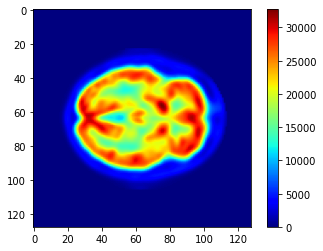

There are no fixations for slice number  25  of scan on row  199


In [ ]:
# NC
show_scan_plot(nc_allData, 25, 199)
show_scan_with_fixations(nc_allData, 25, 199, "save")

Subject  130_S_1290


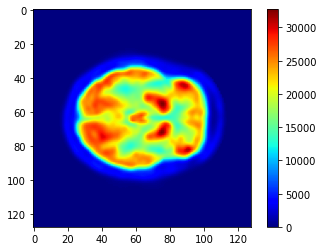

There are no fixations for slice number  25  of scan on row  177


In [ ]:
# AD
show_scan_plot(ad_allData, 25, 177)
show_scan_with_fixations(ad_allData, 25, 177, "save")

Subject  007_S_0101


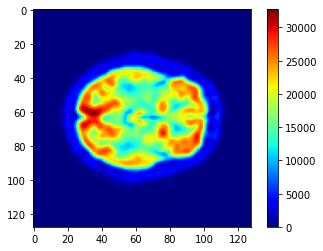

There are no fixations for slice number  25  of scan on row  400


In [ ]:
# MCI
show_scan_plot(mci_allData, 25, 400)
show_scan_with_fixations(mci_allData, 25, 400, "save")

Scans of different levels of the brain

Subject  009_S_0842


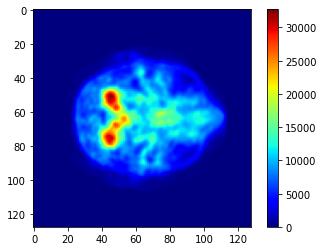

In [ ]:
show_scan_plot(nc_allData, 4, 6)

Subject  009_S_0842


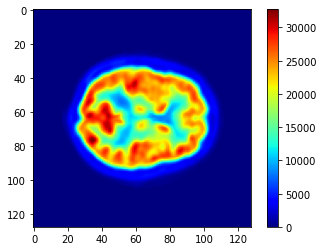

In [ ]:
show_scan_plot(nc_allData, 34, 6)

Subject  009_S_0842


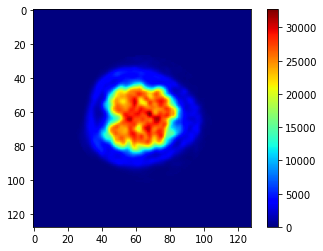

In [ ]:
show_scan_plot(nc_allData, 53, 6)

Sequence of fixation points in the brain

In [ ]:
show_scan_with_fixations_sequence(nc_allData, 25, 199)

There are no fixations for slice number  25  of scan on row  199


In [ ]:
show_scan_with_fixations_sequence(ad_allData, 25, 199)

There are no fixations for slice number  25  of scan on row  199


In [ ]:
show_scan_with_fixations_sequence(mci_allData, 25, 400)

There are no fixations for slice number  25  of scan on row  400


Fixations Durations

In [ ]:
show_scan_with_durations(mci_allData, 25, 400)

There are no fixations for slice number  25  of scan on row  400


In [ ]:
show_scan_with_durations(ad_allData, 25, 199)

There are no fixations for slice number  25  of scan on row  199


In [ ]:
show_scan_with_durations(nc_allData, 25, 199)

There are no fixations for slice number  25  of scan on row  199


# Overlap Fixations on one Scan

#### Plot Functions

Plot all the fixations of all scans of the same class on top of one single scan.

In [ ]:
def show_one_scan_with_all_scans_fixations_ontop(allData, slice_nr, scan_index):
  print("Subject ", allData.at[scan_index, 'Subject ID'])
  one_slice_2d = copy.deepcopy(allData.at[scan_index, 'Scan'][:,:,slice_nr]) # array with one slice of a single patient
  
  locations = []
  for scan in range(0, len(allData)):
    if allData.at[scan, 'Has Fix'] == 1 and len(allData.at[scan, 'Fixations'][slice_nr]):
      #print(scan, " - ", allData.at[scan, 'Durations'][slice_nr])
      locations.extend(allData.at[scan, 'Fixations'][slice_nr])

  plt.imshow(np.rot90(one_slice_2d), cmap='jet')
  x = [[], []]
  coord = coordinates_transform(locations)
  x[1] = -(coord[0]-64)+64
  x[0] = (coord[1]-64)+64
  plt.scatter(x[0], x[1], s=10)
  
  plt.savefig(f"/content/drive/My Drive/plots/scan_all_fixations_{allData.at[scan_index, 'Class']}_{allData.at[scan_index, 'Subject ID']}.pdf", 
              bbox_inches ="tight")
  
  plt.show() 

Plot all the fixations of all scans of the same class colored with the density value of fixations.

In [ ]:
def show_one_scan_with_all_scans_fixations_ontop_density(allData, slice_nr, scan_index):
  print("Subject ", allData.at[scan_index, 'Subject ID'])
  one_slice_2d = copy.deepcopy(allData.at[scan_index, 'Scan'][:,:,slice_nr]) # array with one slice of a single patient
  one_slice_2d = np.rot90(one_slice_2d)
  plt.imshow(one_slice_2d, cmap='gray')

  durations = []
  for patient in range(0, len(allData)):
    if allData.at[patient, 'Has Fix'] == 1 and len(allData.at[patient, 'Durations'][slice_nr]):
      durations.extend(allData.at[patient, 'Durations'][slice_nr])
  
  coord = [[], []]
  coord[0] = np.array([item[0] for item in durations])
  coord[1] = np.array([item[1] for item in durations])
  x = [[], []]
  x[1] = -(coord[0]-64)+64
  x[0] = (coord[1]-64)+64

  # Calculate the point density
  xy = np.vstack(x)
  z = gaussian_kde(xy)(xy)

  plt.scatter(x[0], x[1], c=z, s=3)
  plt.clim(0, 0.0016)
  #plt.colorbar(ticks=[0, 0.0004, 0.0008, 0.0012, 0.0016])

  plt.savefig(f"/content/drive/My Drive/plots/scan_all_fixations_density_{allData.at[scan_index, 'Class']}_{allData.at[scan_index, 'Subject ID']}.pdf", 
              bbox_inches ="tight")
  
  plt.show()

Plot heatmap of durations.

In [ ]:
from matplotlib.image import NonUniformImage
from scipy.ndimage.filters import gaussian_filter

def show_one_scan_with_all_scans_fixations_ontop_durations_heatmap(allData, slice_nr, scan_index):
  print("Subject ", allData.at[scan_index, 'Subject ID'])
  one_slice_2d = copy.deepcopy(allData.at[scan_index, 'Scan'][:,:,slice_nr]) # array with one slice of a single patient
  #one_slice_2d = np.rot90(one_slice_2d)
  
  durations = []
  for patient in range(0, len(allData)):
    if allData.at[patient, 'Has Fix'] == 1 and len(allData.at[patient, 'Durations'][slice_nr]):
      durations.extend(allData.at[patient, 'Durations'][slice_nr])
  
  x = [item[0] for item in durations]
  y = [item[1] for item in durations]
  z = [item[2] for item in durations]
  H, xedges, yedges = np.histogram2d(x, y, bins=1000, weights=z)
  H = gaussian_filter(H, sigma=27)
  extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
  H = H.T

  print(type(H))
  print(H.shape)

  # create a colormap object
  cmap = plt.get_cmap('jet')
  cmap.set_under("#FF000000")
  plt.imshow(H, extent=extent, origin='lower', cmap=cmap,  vmin=0.05, alpha=0.7, zorder=10)
  plt.clim(0.15, 1.2)
  plt.colorbar()
  plt.imshow(one_slice_2d, cmap='gray', zorder=0)
  
  plt.savefig(f"/content/drive/My Drive/plots/scan_all_fixations_duration_heatmap_{allData.at[scan_index, 'Class']}_{allData.at[scan_index, 'Subject ID']}.png", 
              bbox_inches ="tight")
  
  plt.show()

Plot durations on top of the slice of the scan where the duration are represented by colors.

In [ ]:
def show_one_scan_with_all_scans_fixations_ontop_durations(allData, slice_nr, patient_nr):
  one_slice_2d = copy.deepcopy(allData.at[patient_nr, 'Scan'][:,:,slice_nr]) # array with one slice of a single patient
  #one_slice_2d = np.rot90(one_slice_2d)
  plt.imshow(one_slice_2d, cmap='gray')

  durations = []
  for patient in range(0, len(allData)):
    if allData.at[patient, 'Has Fix'] == 1 and len(allData.at[patient, 'Durations'][slice_nr]):
      durations.extend(allData.at[patient, 'Durations'][slice_nr])
  
  x = [item[0] for item in durations]
  y = [item[1] for item in durations]
  z = [item[2] for item in durations]
  z = [i if i > 500 else None for i in z]
  plt.scatter(x, y, c=z, cmap='jet', alpha=0.5)
  plt.colorbar(label="Duration/ms")
  
  plt.savefig(f"/content/drive/My Drive/plots/scan_all_fixations_duration_coloredscatter_{allData.at[patient_nr, 'Class']}_{allData.at[patient_nr, 'Subject ID']}.pdf", 
              bbox_inches ="tight")
  
  plt.show()

#### Plot Examples

Subject  007_S_0293


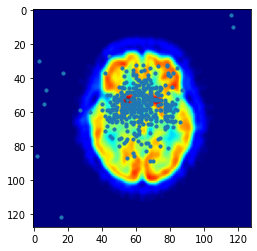

In [ ]:
show_one_scan_with_all_scans_fixations_ontop(mci_allData, 25, 6)

Subject  009_S_0842


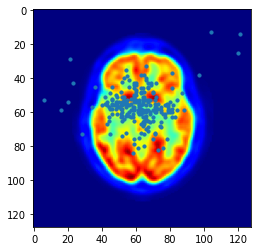

In [ ]:
show_one_scan_with_all_scans_fixations_ontop(nc_allData, 25, 6)

Subject  006_S_0653


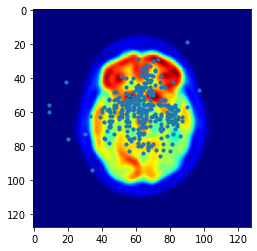

In [ ]:
show_one_scan_with_all_scans_fixations_ontop(ad_allData, 25, 6)

Subject  009_S_0842


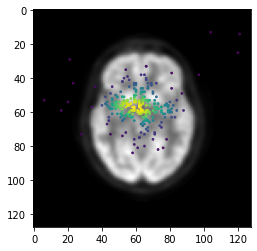

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_density(nc_allData, 25, 6)

Subject  006_S_0653


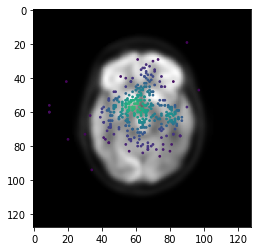

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_density(ad_allData, 25, 6)

Subject  007_S_0293


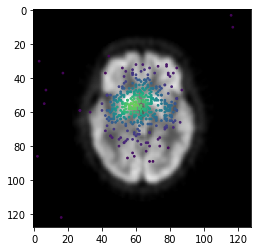

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_density(mci_allData, 25, 6)

Subject  009_S_0842
<class 'numpy.ndarray'>
(1000, 1000)


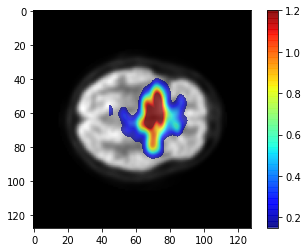

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations_heatmap(nc_allData, 25, 6)

Subject  006_S_0653
<class 'numpy.ndarray'>
(1000, 1000)


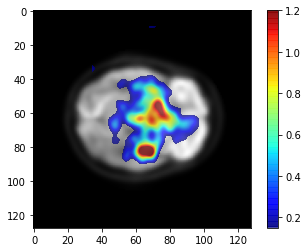

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations_heatmap(ad_allData, 25, 6)

Subject  007_S_0293
<class 'numpy.ndarray'>
(1000, 1000)


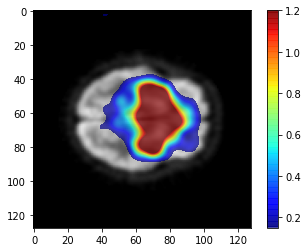

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations_heatmap(mci_allData, 25, 6)

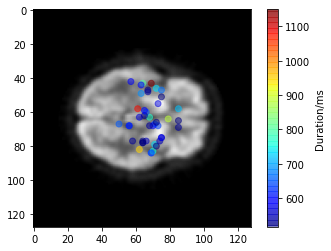

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations(mci_allData, 25, 6)

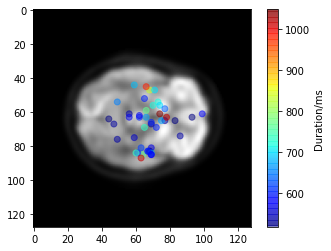

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations(ad_allData, 25, 6)

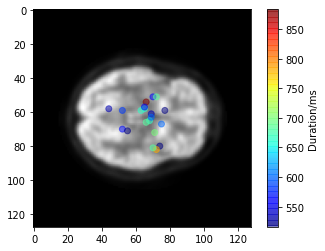

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations(nc_allData, 25, 6)

# Removal of Outlier Fixation Points

#### Removal Functions

Remove fixation point that fall outside the brain region.

In [ ]:
def remove_outlier_fixations(allData, criteria):
  print("Starting Removing Fixation Points ---------------------------------")

  save = [] # store points that were removed
  removed_points = 0

  # iterate over all PET scans
  for scan_index in range(allData.shape[0]):
    print("Scan ", scan_index, " of ", allData.shape[0])
    
    # if scan does not have any fixation points, continue to next
    if allData.at[scan_index, 'Has Fix'] == 0:
      continue 

    # obtain the coordinates where there is no brain image in the scan
    scan = allData.at[scan_index, 'Scan']
    coord = np.where((scan <= criteria))

    # list of the fixation points for every axial slice
    allFixations = allData.at[scan_index, 'Fixations'] 

    # iterate over all axial slices
    for slice_nr, slice_fix in enumerate(allFixations):

      # if this slice does not have any fixation point, continue to the next slice
      if len(slice_fix) == 0:
        continue

      # iterate over all fixation points of this slice
      for point_nr, point in enumerate(allData.at[scan_index, 'Durations'][slice_nr]):
        
        # for each point, determine if it is in the no-brain region
        for coordx, coordy, coordz in zip(coord[0], coord[1], coord[2]):
          if point[0] == coordx and point[1] == coordy and slice_nr == coordz:

            show_scan_with_fixations(allData, slice_nr, scan_index, "not save")
            
            pt = coordinates_untransform(coordx, coordy)
            plt.scatter(coordx, coordy, marker='^') # plot point to remove
            plt.show()

            print("Slice nr ", slice_nr)
            print("All axial cut fixations vector representation coordinate ", slice_fix)
            print("All axial cut fixations ", allData.at[scan_index, 'Durations'][slice_nr])
            print("Removed point coordinates ", coordx, coordy)
            print("Removed point vector representation coordinate ", pt)

            # save point to remove
            dur = point[2]
            order = allData.at[scan_index, 'Fixations'][slice_nr].index(pt)
            save_aux = {"scan index": scan_index, 
                        "slice nr": slice_nr, 
                        "coordx": coordx, 
                        "coordy": coordy, 
                        "duration": dur, 
                        "order": order}
            save.append(save_aux)

            # Remove
            allData.at[scan_index, 'Durations'][slice_nr].pop(point_nr)              
            allData.at[scan_index, 'Fixations'][slice_nr].remove(pt)

            print("Fixation point was removed --------------------------------", removed_points)
            removed_points += 1
            

  print("Total fixation points removed: ", removed_points, " -----------------------")
  return save

Remove a specific point manually

In [ ]:
def remove_point(allData, scan_index, slice_nr, point_x, point_y):
  show_scan_with_fixations(allData, slice_nr, scan_index, "not save")

  pt = coordinates_untransform(point_x, point_y)
  plt.scatter(point_x, point_y, marker='^')
  plt.show()

  # remove point
  allData.at[scan_index, 'Fixations'][slice_nr].remove(pt)
  for point_nr, fix_point in enumerate(allData.at[scan_index, 'Durations'][slice_nr]):
    if fix_point[0] == point_x and fix_point[1] == point_y:
      allData.at[scan_index, 'Durations'][slice_nr].pop(point_nr)

  print("Point Removed ------")
  print("Slice nr ", slice_nr)
  print("All axial cut fixations vector representation coordinate ", allData.at[scan_index, 'Fixations'][slice_nr])
  print("All axial cut fixations ", allData.at[scan_index, 'Durations'][slice_nr])
  print("Removed point coordinates ", point_x, point_y)
  print("Removed point vector representation coordinate ", pt)
  print("---------------")

Re-add a specific point manually

In [ ]:
def readd_points(allData, removed_points, points_to_readd):
  for removed_index in points_to_readd:
    point = removed_points[removed_index]
    scan_index = point["scan index"]
    slice_nr = point["slice nr"]
    point_x = point["coordx"]
    point_y = point["coordy"]
    dur = point["duration"]
    order = point["order"]

    show_scan_with_fixations(allData, slice_nr, scan_index, "not save")

    pt = coordinates_untransform(point_x, point_y)
    plt.scatter(point_x, point_y, marker='*')
    plt.show()

    # re-add point
    allData.at[scan_index, 'Fixations'][slice_nr].insert(order, pt)
    point_dur = (point_x, point_y, dur)
    allData.at[scan_index, 'Durations'][slice_nr].append(point_dur)

    print("Point Re-added ------")
    print("Slice nr ", slice_nr)
    print("All axial cut fixations vector representation coordinate ", allData.at[scan_index, 'Fixations'][slice_nr])
    print("All axial cut fixations ", allData.at[scan_index, 'Durations'][slice_nr])
    print("Re-added point coordinates ", point_x, point_y)
    print("Re-added point vector representation coordinate ", pt)
    print("---------------")

#### Removal of outlier points

Starting Removing Fixation Points ---------------------------------
Scan  0  of  714
Scan  1  of  714
Scan  2  of  714
Scan  3  of  714
Scan  4  of  714
Scan  5  of  714
Scan  6  of  714
Scan  7  of  714
Scan  8  of  714
Scan  9  of  714
Scan  10  of  714
Scan  11  of  714
Scan  12  of  714
Scan  13  of  714
Scan  14  of  714
Scan  15  of  714
Scan  16  of  714
Scan  17  of  714
Scan  18  of  714
Scan  19  of  714
Scan  20  of  714
Scan  21  of  714
Scan  22  of  714
Scan  23  of  714
Scan  24  of  714
Scan  25  of  714
Scan  26  of  714
Scan  27  of  714
Scan  28  of  714
Scan  29  of  714
Scan  30  of  714
Scan  31  of  714
Scan  32  of  714
Scan  33  of  714
Scan  34  of  714
Scan  35  of  714
Scan  36  of  714
Scan  37  of  714
Scan  38  of  714
Scan  39  of  714
Scan  40  of  714
Scan  41  of  714
Scan  42  of  714
Scan  43  of  714
Scan  44  of  714
Scan  45  of  714
Scan  46  of  714
Scan  47  of  714
Scan  48  of  714
Scan  49  of  714
Scan  50  of  714
Scan  51  of  714
Scan  

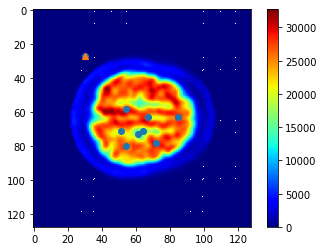

Slice nr  47
All axial cut fixations vector representation coordinate  [3867, 6599, 6970, 6992, 7881, 8263, 8639, 9294, 10943]
All axial cut fixations  [(30, 27, 83), (51, 71, 300), (54, 58, 200), (54, 80, 283), (61, 73, 250), (64, 71, 266), (67, 63, 266), (72, 78, 350), (85, 63, 383)]
Removed point coordinates  30 27
Removed point vector representation coordinate  3867
Fixation point was removed -------------------------------- 0
Scan  575  of  714
Subject  005_S_0546
Fixation points  [(38, 55, 316), (44, 58, 333), (68, 57, 333), (69, 45, 350), (72, 69, 316), (73, 77, 400), (74, 51, 400), (74, 72, 216), (76, 65, 400), (79, 63, 433), (93, 102, 200)]
Fixation points  [4919, 5690, 8761, 8877, 9285, 9421, 9523, 9544, 9793, 10175, 12006]


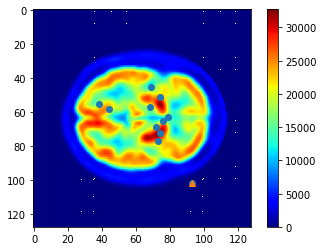

Slice nr  28
All axial cut fixations vector representation coordinate  [4919, 5690, 8761, 8877, 9285, 9421, 9523, 9544, 9793, 10175, 12006]
All axial cut fixations  [(38, 55, 316), (44, 58, 333), (68, 57, 333), (69, 45, 350), (72, 69, 316), (73, 77, 400), (74, 51, 400), (74, 72, 216), (76, 65, 400), (79, 63, 433), (93, 102, 200)]
Removed point coordinates  93 102
Removed point vector representation coordinate  12006
Fixation point was removed -------------------------------- 1
Subject  005_S_0546
Fixation points  [(64, 66, 167), (73, 81, 166), (74, 38, 216), (74, 61, 183), (74, 69, 600), (74, 87, 233), (75, 42, 283), (86, 63, 250), (91, 58, 266), (94, 63, 283), (109, 106, 233), (116, 110, 83), (123, 117, 167)]
Fixation points  [8258, 9425, 9510, 9533, 9541, 9559, 9642, 11071, 11706, 12095, 14058, 14958, 15861]


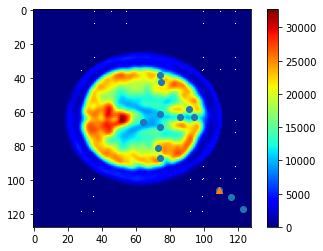

Slice nr  39
All axial cut fixations vector representation coordinate  [8258, 9425, 9510, 9533, 9541, 9559, 9642, 11071, 11706, 12095, 14058, 14958, 15861]
All axial cut fixations  [(64, 66, 167), (73, 81, 166), (74, 38, 216), (74, 61, 183), (74, 69, 600), (74, 87, 233), (75, 42, 283), (86, 63, 250), (91, 58, 266), (94, 63, 283), (109, 106, 233), (116, 110, 83), (123, 117, 167)]
Removed point coordinates  109 106
Removed point vector representation coordinate  14058
Fixation point was removed -------------------------------- 2
Subject  005_S_0546
Fixation points  [(64, 66, 167), (73, 81, 166), (74, 38, 216), (74, 61, 183), (74, 69, 600), (74, 87, 233), (75, 42, 283), (86, 63, 250), (91, 58, 266), (94, 63, 283), (116, 110, 83), (123, 117, 167)]
Fixation points  [8258, 9425, 9510, 9533, 9541, 9559, 9642, 11071, 11706, 12095, 14958, 15861]


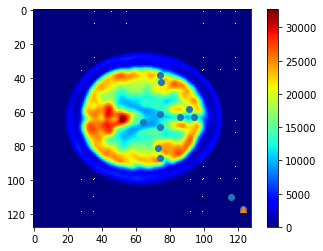

Slice nr  39
All axial cut fixations vector representation coordinate  [8258, 9425, 9510, 9533, 9541, 9559, 9642, 11071, 11706, 12095, 14958, 15861]
All axial cut fixations  [(64, 66, 167), (73, 81, 166), (74, 38, 216), (74, 61, 183), (74, 69, 600), (74, 87, 233), (75, 42, 283), (86, 63, 250), (91, 58, 266), (94, 63, 283), (116, 110, 83), (123, 117, 167)]
Removed point coordinates  123 117
Removed point vector representation coordinate  15861
Fixation point was removed -------------------------------- 3
Scan  576  of  714
Subject  005_S_1224
Fixation points  [(54, 63, 416), (65, 44, 200), (71, 66, 233), (84, 63, 233), (101, 100, 200)]
Fixation points  [6975, 8364, 9154, 10815, 13028]


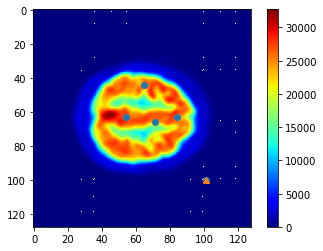

Slice nr  46
All axial cut fixations vector representation coordinate  [6975, 8364, 9154, 10815, 13028]
All axial cut fixations  [(54, 63, 416), (65, 44, 200), (71, 66, 233), (84, 63, 233), (101, 100, 200)]
Removed point coordinates  101 100
Removed point vector representation coordinate  13028
Fixation point was removed -------------------------------- 4
Scan  577  of  714
Scan  578  of  714
Scan  579  of  714
Scan  580  of  714
Subject  007_S_0293
Fixation points  [(52, 46, 416), (52, 79, 433), (75, 61, 433), (77, 58, 366), (84, 60, 100), (84, 63, 133), (92, 62, 183), (93, 63, 150), (99, 59, 150), (101, 66, 233)]
Fixation points  [6702, 6735, 9661, 9914, 10812, 10815, 11838, 11967, 12731, 12994]


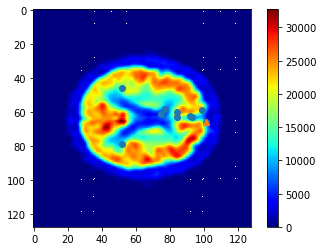

Slice nr  37
All axial cut fixations vector representation coordinate  [6702, 6735, 9661, 9914, 10812, 10815, 11838, 11967, 12731, 12994]
All axial cut fixations  [(52, 46, 416), (52, 79, 433), (75, 61, 433), (77, 58, 366), (84, 60, 100), (84, 63, 133), (92, 62, 183), (93, 63, 150), (99, 59, 150), (101, 66, 233)]
Removed point coordinates  101 66
Removed point vector representation coordinate  12994
Fixation point was removed -------------------------------- 5
Scan  581  of  714
Subject  007_S_0414
Fixation points  [(6, 16, 183), (42, 2, 383), (58, 47, 200), (59, 77, 366), (60, 43, 233), (62, 48, 233), (64, 46, 433), (64, 69, 167), (65, 49, 283), (65, 56, 383), (65, 81, 316), (66, 64, 333), (66, 80, 200), (67, 71, 433), (69, 48, 283), (69, 51, 100), (71, 57, 483), (72, 63, 250), (72, 66, 316), (73, 54, 383), (73, 57, 483), (73, 67, 266), (74, 77, 550), (75, 66, 466), (77, 53, 316), (78, 53, 383), (78, 59, 400), (78, 61, 283), (79, 68, 183), (79, 72, 316), (80, 51, 383), (80, 63, 200), 

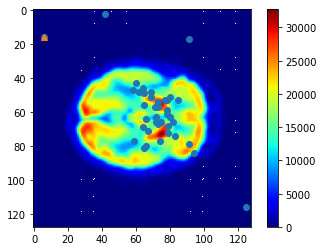

Slice nr  25
All axial cut fixations vector representation coordinate  [784, 5378, 7471, 7629, 7723, 7984, 8238, 8261, 8369, 8376, 8401, 8512, 8528, 8647, 8880, 8883, 9145, 9279, 9282, 9398, 9401, 9411, 9549, 9666, 9909, 10037, 10043, 10045, 10180, 10184, 10291, 10303, 10562, 10698, 10933, 11665, 11727, 12116, 16116]
All axial cut fixations  [(6, 16, 183), (42, 2, 383), (58, 47, 200), (59, 77, 366), (60, 43, 233), (62, 48, 233), (64, 46, 433), (64, 69, 167), (65, 49, 283), (65, 56, 383), (65, 81, 316), (66, 64, 333), (66, 80, 200), (67, 71, 433), (69, 48, 283), (69, 51, 100), (71, 57, 483), (72, 63, 250), (72, 66, 316), (73, 54, 383), (73, 57, 483), (73, 67, 266), (74, 77, 550), (75, 66, 466), (77, 53, 316), (78, 53, 383), (78, 59, 400), (78, 61, 283), (79, 68, 183), (79, 72, 316), (80, 51, 383), (80, 63, 200), (82, 66, 266), (83, 74, 450), (85, 53, 216), (91, 17, 183), (91, 79, 133), (94, 84, 200), (125, 116, 133)]
Removed point coordinates  6 16
Removed point vector representation co

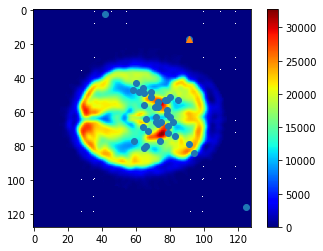

Slice nr  25
All axial cut fixations vector representation coordinate  [5378, 7471, 7629, 7723, 7984, 8238, 8261, 8369, 8376, 8401, 8512, 8528, 8647, 8880, 8883, 9145, 9279, 9282, 9398, 9401, 9411, 9549, 9666, 9909, 10037, 10043, 10045, 10180, 10184, 10291, 10303, 10562, 10698, 10933, 11665, 11727, 12116, 16116]
All axial cut fixations  [(42, 2, 383), (58, 47, 200), (59, 77, 366), (60, 43, 233), (62, 48, 233), (64, 46, 433), (64, 69, 167), (65, 49, 283), (65, 56, 383), (65, 81, 316), (66, 64, 333), (66, 80, 200), (67, 71, 433), (69, 48, 283), (69, 51, 100), (71, 57, 483), (72, 63, 250), (72, 66, 316), (73, 54, 383), (73, 57, 483), (73, 67, 266), (74, 77, 550), (75, 66, 466), (77, 53, 316), (78, 53, 383), (78, 59, 400), (78, 61, 283), (79, 68, 183), (79, 72, 316), (80, 51, 383), (80, 63, 200), (82, 66, 266), (83, 74, 450), (85, 53, 216), (91, 17, 183), (91, 79, 133), (94, 84, 200), (125, 116, 133)]
Removed point coordinates  91 17
Removed point vector representation coordinate  11665
Fi

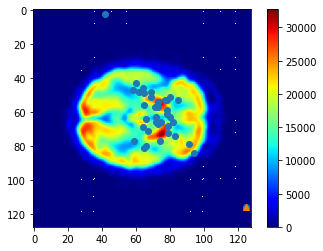

Slice nr  25
All axial cut fixations vector representation coordinate  [5378, 7471, 7629, 7723, 7984, 8238, 8261, 8369, 8376, 8401, 8512, 8528, 8647, 8880, 8883, 9145, 9279, 9282, 9398, 9401, 9411, 9549, 9666, 9909, 10037, 10043, 10045, 10180, 10184, 10291, 10303, 10562, 10698, 10933, 11727, 12116, 16116]
All axial cut fixations  [(42, 2, 383), (58, 47, 200), (59, 77, 366), (60, 43, 233), (62, 48, 233), (64, 46, 433), (64, 69, 167), (65, 49, 283), (65, 56, 383), (65, 81, 316), (66, 64, 333), (66, 80, 200), (67, 71, 433), (69, 48, 283), (69, 51, 100), (71, 57, 483), (72, 63, 250), (72, 66, 316), (73, 54, 383), (73, 57, 483), (73, 67, 266), (74, 77, 550), (75, 66, 466), (77, 53, 316), (78, 53, 383), (78, 59, 400), (78, 61, 283), (79, 68, 183), (79, 72, 316), (80, 51, 383), (80, 63, 200), (82, 66, 266), (83, 74, 450), (85, 53, 216), (91, 79, 133), (94, 84, 200), (125, 116, 133)]
Removed point coordinates  125 116
Removed point vector representation coordinate  16116
Fixation point was rem

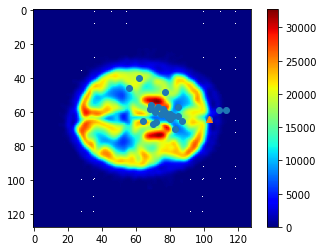

Slice nr  28
All axial cut fixations vector representation coordinate  [7214, 7976, 8257, 8762, 8888, 9027, 9147, 9148, 9282, 9401, 9661, 9786, 9904, 9916, 9917, 10175, 10301, 10304, 10558, 10694, 10937, 10942, 11201, 13248, 14011, 14523]
All axial cut fixations  [(56, 46, 433), (62, 40, 316), (64, 65, 400), (68, 58, 83), (69, 56, 316), (70, 67, 266), (71, 59, 217), (71, 60, 1133), (72, 66, 1049), (73, 57, 400), (75, 61, 416), (76, 58, 766), (77, 48, 100), (77, 60, 183), (77, 61, 1149), (79, 63, 250), (80, 61, 250), (80, 64, 1149), (82, 62, 383), (83, 70, 167), (85, 57, 266), (85, 62, 333), (87, 65, 283), (103, 64, 250), (109, 59, 216), (113, 59, 100)]
Removed point coordinates  103 64
Removed point vector representation coordinate  13248
Fixation point was removed -------------------------------- 9
Subject  007_S_0414
Fixation points  [(56, 46, 433), (62, 40, 316), (64, 65, 400), (68, 58, 83), (69, 56, 316), (70, 67, 266), (71, 59, 217), (71, 60, 1133), (72, 66, 1049), (73, 57, 400), 

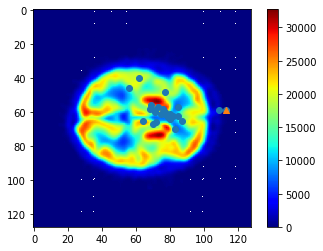

Slice nr  28
All axial cut fixations vector representation coordinate  [7214, 7976, 8257, 8762, 8888, 9027, 9147, 9148, 9282, 9401, 9661, 9786, 9904, 9916, 9917, 10175, 10301, 10304, 10558, 10694, 10937, 10942, 11201, 14011, 14523]
All axial cut fixations  [(56, 46, 433), (62, 40, 316), (64, 65, 400), (68, 58, 83), (69, 56, 316), (70, 67, 266), (71, 59, 217), (71, 60, 1133), (72, 66, 1049), (73, 57, 400), (75, 61, 416), (76, 58, 766), (77, 48, 100), (77, 60, 183), (77, 61, 1149), (79, 63, 250), (80, 61, 250), (80, 64, 1149), (82, 62, 383), (83, 70, 167), (85, 57, 266), (85, 62, 333), (87, 65, 283), (109, 59, 216), (113, 59, 100)]
Removed point coordinates  113 59
Removed point vector representation coordinate  14523
Fixation point was removed -------------------------------- 10
Scan  582  of  714
Scan  583  of  714
Subject  010_S_0161
Fixation points  [(43, 59, 633), (53, 65, 466), (54, 57, 183), (71, 61, 200), (73, 75, 450), (74, 58, 316), (86, 56, 466), (90, 69, 666), (100, 98, 150),

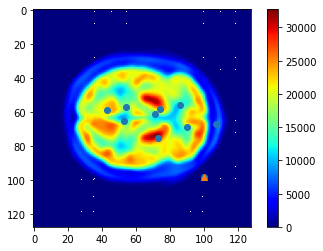

Slice nr  28
All axial cut fixations vector representation coordinate  [5563, 6849, 6969, 9149, 9419, 9530, 11064, 11589, 12898, 13763]
All axial cut fixations  [(43, 59, 633), (53, 65, 466), (54, 57, 183), (71, 61, 200), (73, 75, 450), (74, 58, 316), (86, 56, 466), (90, 69, 666), (100, 98, 150), (107, 67, 333)]
Removed point coordinates  100 98
Removed point vector representation coordinate  12898
Fixation point was removed -------------------------------- 11
Subject  010_S_0161
Fixation points  [(54, 53, 266), (65, 71, 450), (67, 48, 300), (70, 58, 333), (71, 80, 650), (73, 80, 200), (74, 73, 333), (75, 82, 216), (79, 75, 117), (80, 71, 167), (81, 82, 283), (86, 67, 167), (86, 71, 100), (95, 65, 133), (106, 58, 216)]
Fixation points  [6965, 8391, 8624, 9018, 9168, 9424, 9545, 9682, 10187, 10311, 10450, 11075, 11079, 12225, 13626]


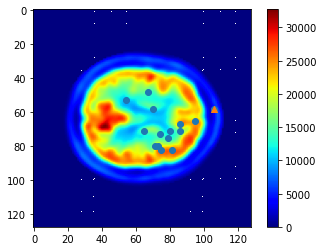

Slice nr  38
All axial cut fixations vector representation coordinate  [6965, 8391, 8624, 9018, 9168, 9424, 9545, 9682, 10187, 10311, 10450, 11075, 11079, 12225, 13626]
All axial cut fixations  [(54, 53, 266), (65, 71, 450), (67, 48, 300), (70, 58, 333), (71, 80, 650), (73, 80, 200), (74, 73, 333), (75, 82, 216), (79, 75, 117), (80, 71, 167), (81, 82, 283), (86, 67, 167), (86, 71, 100), (95, 65, 133), (106, 58, 216)]
Removed point coordinates  106 58
Removed point vector representation coordinate  13626
Fixation point was removed -------------------------------- 12
Subject  010_S_0161
Fixation points  [(42, 51, 167), (47, 53, 250), (48, 61, 350), (53, 70, 250), (57, 69, 333), (58, 63, 350), (84, 68, 400), (99, 107, 100)]
Fixation points  [5427, 6069, 6205, 6854, 7365, 7487, 10820, 12779]


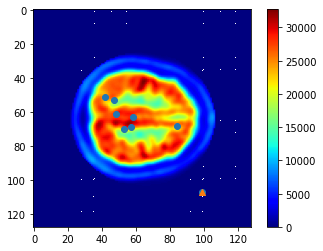

Slice nr  45
All axial cut fixations vector representation coordinate  [5427, 6069, 6205, 6854, 7365, 7487, 10820, 12779]
All axial cut fixations  [(42, 51, 167), (47, 53, 250), (48, 61, 350), (53, 70, 250), (57, 69, 333), (58, 63, 350), (84, 68, 400), (99, 107, 100)]
Removed point coordinates  99 107
Removed point vector representation coordinate  12779
Fixation point was removed -------------------------------- 13
Scan  584  of  714
Scan  585  of  714
Scan  586  of  714
Scan  587  of  714
Scan  588  of  714
Subject  012_S_0634
Fixation points  [(47, 64, 316), (57, 76, 333), (62, 68, 333), (63, 69, 266), (64, 58, 166), (72, 58, 716), (74, 64, 250), (74, 68, 216), (77, 77, 283), (79, 65, 350), (80, 68, 250), (83, 63, 899), (84, 63, 566), (86, 64, 300), (86, 65, 700), (89, 64, 666), (91, 61, 666), (93, 64, 550), (93, 65, 649), (104, 89, 233)]
Fixation points  [6080, 7372, 8004, 8133, 8250, 9274, 9536, 9540, 9933, 10177, 10308, 10687, 10815, 11072, 11073, 11456, 11709, 11968, 11969, 1340

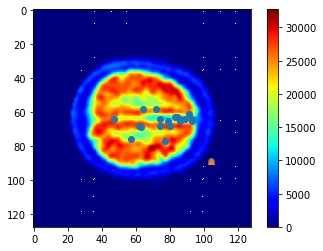

Slice nr  45
All axial cut fixations vector representation coordinate  [6080, 7372, 8004, 8133, 8250, 9274, 9536, 9540, 9933, 10177, 10308, 10687, 10815, 11072, 11073, 11456, 11709, 11968, 11969, 13401]
All axial cut fixations  [(47, 64, 316), (57, 76, 333), (62, 68, 333), (63, 69, 266), (64, 58, 166), (72, 58, 716), (74, 64, 250), (74, 68, 216), (77, 77, 283), (79, 65, 350), (80, 68, 250), (83, 63, 899), (84, 63, 566), (86, 64, 300), (86, 65, 700), (89, 64, 666), (91, 61, 666), (93, 64, 550), (93, 65, 649), (104, 89, 233)]
Removed point coordinates  104 89
Removed point vector representation coordinate  13401
Fixation point was removed -------------------------------- 14
Scan  589  of  714
Scan  590  of  714
Scan  591  of  714
Scan  592  of  714
Scan  593  of  714
Subject  013_S_1120
Fixation points  [(70, 62, 200), (71, 39, 266), (76, 61, 150), (85, 63, 216), (86, 68, 316), (92, 64, 466), (104, 107, 233)]
Fixation points  [9022, 9127, 9789, 10943, 11076, 11840, 13419]


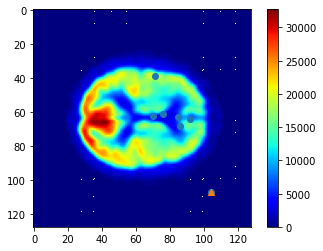

Slice nr  34
All axial cut fixations vector representation coordinate  [9022, 9127, 9789, 10943, 11076, 11840, 13419]
All axial cut fixations  [(70, 62, 200), (71, 39, 266), (76, 61, 150), (85, 63, 216), (86, 68, 316), (92, 64, 466), (104, 107, 233)]
Removed point coordinates  104 107
Removed point vector representation coordinate  13419
Fixation point was removed -------------------------------- 15
Scan  594  of  714
Subject  013_S_1186
Fixation points  [(59, 54, 183), (60, 60, 300), (71, 63, 383), (82, 66, 433), (88, 124, 100)]
Fixation points  [7606, 7740, 9151, 10562, 11388]


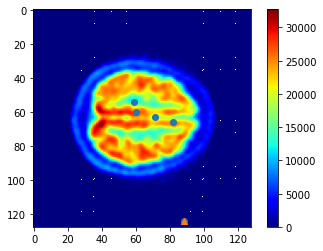

Slice nr  45
All axial cut fixations vector representation coordinate  [7606, 7740, 9151, 10562, 11388]
All axial cut fixations  [(59, 54, 183), (60, 60, 300), (71, 63, 383), (82, 66, 433), (88, 124, 100)]
Removed point coordinates  88 124
Removed point vector representation coordinate  11388
Fixation point was removed -------------------------------- 16
Scan  595  of  714
Scan  596  of  714
Scan  597  of  714
Scan  598  of  714
Scan  599  of  714
Scan  600  of  714
Scan  601  of  714
Subject  022_S_0544
Fixation points  [(51, 21, 450), (57, 60, 266), (62, 65, 250), (62, 74, 333), (64, 45, 433), (72, 61, 233), (73, 75, 300), (81, 65, 250), (84, 58, 316), (86, 55, 200), (92, 58, 366), (92, 68, 600)]
Fixation points  [6549, 7356, 8001, 8010, 8237, 9277, 9419, 10433, 10810, 11063, 11834, 11844]


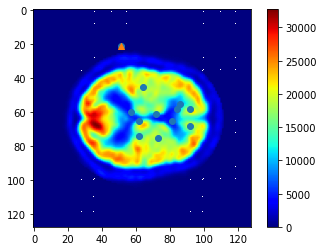

Slice nr  34
All axial cut fixations vector representation coordinate  [6549, 7356, 8001, 8010, 8237, 9277, 9419, 10433, 10810, 11063, 11834, 11844]
All axial cut fixations  [(51, 21, 450), (57, 60, 266), (62, 65, 250), (62, 74, 333), (64, 45, 433), (72, 61, 233), (73, 75, 300), (81, 65, 250), (84, 58, 316), (86, 55, 200), (92, 58, 366), (92, 68, 600)]
Removed point coordinates  51 21
Removed point vector representation coordinate  6549
Fixation point was removed -------------------------------- 17
Scan  602  of  714
Subject  022_S_0961
Fixation points  [(68, 75, 333), (69, 51, 300), (69, 89, 116), (71, 44, 366), (71, 49, 266), (71, 56, 416), (74, 81, 700), (75, 2, 167), (75, 84, 750), (75, 94, 117), (78, 74, 233), (81, 82, 400), (91, 102, 150)]
Fixation points  [8779, 8883, 8921, 9132, 9137, 9144, 9553, 9602, 9684, 9694, 10058, 10450, 11750]


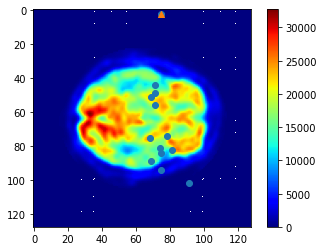

Slice nr  24
All axial cut fixations vector representation coordinate  [8779, 8883, 8921, 9132, 9137, 9144, 9553, 9602, 9684, 9694, 10058, 10450, 11750]
All axial cut fixations  [(68, 75, 333), (69, 51, 300), (69, 89, 116), (71, 44, 366), (71, 49, 266), (71, 56, 416), (74, 81, 700), (75, 2, 167), (75, 84, 750), (75, 94, 117), (78, 74, 233), (81, 82, 400), (91, 102, 150)]
Removed point coordinates  75 2
Removed point vector representation coordinate  9602
Fixation point was removed -------------------------------- 18
Subject  022_S_0961
Fixation points  [(68, 75, 333), (69, 51, 300), (69, 89, 116), (71, 44, 366), (71, 49, 266), (71, 56, 416), (74, 81, 700), (75, 84, 750), (75, 94, 117), (78, 74, 233), (81, 82, 400), (91, 102, 150)]
Fixation points  [8779, 8883, 8921, 9132, 9137, 9144, 9553, 9684, 9694, 10058, 10450, 11750]


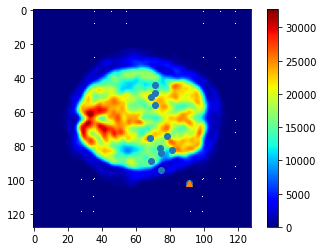

Slice nr  24
All axial cut fixations vector representation coordinate  [8779, 8883, 8921, 9132, 9137, 9144, 9553, 9684, 9694, 10058, 10450, 11750]
All axial cut fixations  [(68, 75, 333), (69, 51, 300), (69, 89, 116), (71, 44, 366), (71, 49, 266), (71, 56, 416), (74, 81, 700), (75, 84, 750), (75, 94, 117), (78, 74, 233), (81, 82, 400), (91, 102, 150)]
Removed point coordinates  91 102
Removed point vector representation coordinate  11750
Fixation point was removed -------------------------------- 19
Scan  603  of  714
Subject  022_S_1351
Fixation points  [(68, 55, 283), (75, 73, 366), (76, 80, 666), (86, 56, 350), (95, 49, 200), (103, 62, 133), (108, 58, 166)]
Fixation points  [8759, 9673, 9808, 11064, 12209, 13246, 13882]


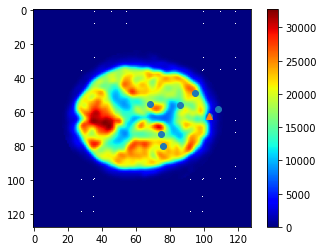

Slice nr  34
All axial cut fixations vector representation coordinate  [8759, 9673, 9808, 11064, 12209, 13246, 13882]
All axial cut fixations  [(68, 55, 283), (75, 73, 366), (76, 80, 666), (86, 56, 350), (95, 49, 200), (103, 62, 133), (108, 58, 166)]
Removed point coordinates  103 62
Removed point vector representation coordinate  13246
Fixation point was removed -------------------------------- 20
Subject  022_S_1351
Fixation points  [(63, 16, 167), (73, 70, 150), (76, 79, 233), (80, 72, 316), (82, 59, 450)]
Fixation points  [8080, 9414, 9807, 10312, 10555]


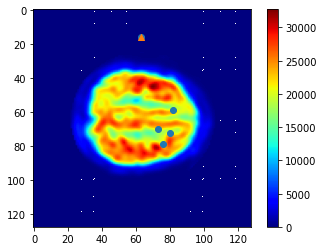

Slice nr  45
All axial cut fixations vector representation coordinate  [8080, 9414, 9807, 10312, 10555]
All axial cut fixations  [(63, 16, 167), (73, 70, 150), (76, 79, 233), (80, 72, 316), (82, 59, 450)]
Removed point coordinates  63 16
Removed point vector representation coordinate  8080
Fixation point was removed -------------------------------- 21
Scan  604  of  714
Subject  027_S_0408
Fixation points  [(24, 28, 483), (27, 68, 250), (34, 56, 583), (34, 67, 83), (35, 45, 466), (36, 68, 216), (37, 51, 500), (40, 42, 600), (41, 50, 400), (43, 50, 233), (43, 56, 350), (43, 58, 1349), (45, 46, 333), (46, 60, 100), (46, 75, 400), (47, 0, 216), (47, 14, 266), (48, 61, 183), (48, 81, 450), (51, 50, 516), (51, 62, 283), (52, 50, 616), (53, 63, 450), (55, 42, 400), (55, 51, 783), (55, 61, 533), (55, 62, 216), (57, 61, 500), (57, 62, 466), (57, 66, 216), (58, 55, 166), (58, 61, 233), (58, 74, 300), (60, 46, 466), (60, 72, 216), (63, 56, 233), (63, 73, 333), (64, 26, 17), (64, 59, 333), (65, 5

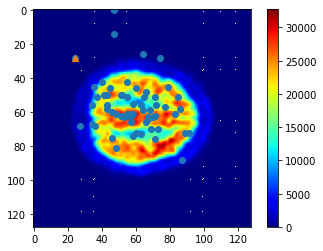

Slice nr  45
All axial cut fixations vector representation coordinate  [3100, 3524, 4408, 4419, 4525, 4676, 4787, 5162, 5298, 5554, 5560, 5562, 5806, 5948, 5963, 6016, 6030, 6205, 6225, 6578, 6590, 6706, 6847, 7082, 7091, 7101, 7102, 7357, 7358, 7362, 7479, 7485, 7498, 7726, 7752, 8120, 8137, 8218, 8251, 8371, 8496, 8514, 8639, 8640, 8763, 8902, 9023, 9139, 9150, 9164, 9272, 9414, 9500, 9913, 10157, 10685, 10931, 11066, 11224, 11464, 11720]
All axial cut fixations  [(24, 28, 483), (27, 68, 250), (34, 56, 583), (34, 67, 83), (35, 45, 466), (36, 68, 216), (37, 51, 500), (40, 42, 600), (41, 50, 400), (43, 50, 233), (43, 56, 350), (43, 58, 1349), (45, 46, 333), (46, 60, 100), (46, 75, 400), (47, 0, 216), (47, 14, 266), (48, 61, 183), (48, 81, 450), (51, 50, 516), (51, 62, 283), (52, 50, 616), (53, 63, 450), (55, 42, 400), (55, 51, 783), (55, 61, 533), (55, 62, 216), (57, 61, 500), (57, 62, 466), (57, 66, 216), (58, 55, 166), (58, 61, 233), (58, 74, 300), (60, 46, 466), (60, 72, 216), (63, 

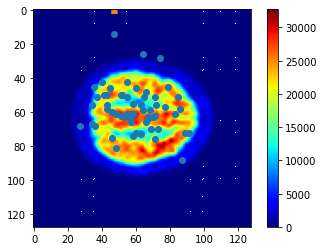

Slice nr  45
All axial cut fixations vector representation coordinate  [3524, 4408, 4419, 4525, 4676, 4787, 5162, 5298, 5554, 5560, 5562, 5806, 5948, 5963, 6016, 6030, 6205, 6225, 6578, 6590, 6706, 6847, 7082, 7091, 7101, 7102, 7357, 7358, 7362, 7479, 7485, 7498, 7726, 7752, 8120, 8137, 8218, 8251, 8371, 8496, 8514, 8639, 8640, 8763, 8902, 9023, 9139, 9150, 9164, 9272, 9414, 9500, 9913, 10157, 10685, 10931, 11066, 11224, 11464, 11720]
All axial cut fixations  [(27, 68, 250), (34, 56, 583), (34, 67, 83), (35, 45, 466), (36, 68, 216), (37, 51, 500), (40, 42, 600), (41, 50, 400), (43, 50, 233), (43, 56, 350), (43, 58, 1349), (45, 46, 333), (46, 60, 100), (46, 75, 400), (47, 0, 216), (47, 14, 266), (48, 61, 183), (48, 81, 450), (51, 50, 516), (51, 62, 283), (52, 50, 616), (53, 63, 450), (55, 42, 400), (55, 51, 783), (55, 61, 533), (55, 62, 216), (57, 61, 500), (57, 62, 466), (57, 66, 216), (58, 55, 166), (58, 61, 233), (58, 74, 300), (60, 46, 466), (60, 72, 216), (63, 56, 233), (63, 73, 33

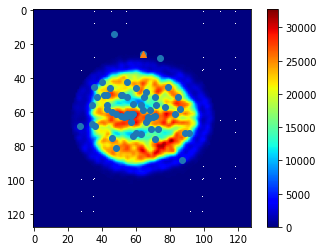

Slice nr  45
All axial cut fixations vector representation coordinate  [3524, 4408, 4419, 4525, 4676, 4787, 5162, 5298, 5554, 5560, 5562, 5806, 5948, 5963, 6030, 6205, 6225, 6578, 6590, 6706, 6847, 7082, 7091, 7101, 7102, 7357, 7358, 7362, 7479, 7485, 7498, 7726, 7752, 8120, 8137, 8218, 8251, 8371, 8496, 8514, 8639, 8640, 8763, 8902, 9023, 9139, 9150, 9164, 9272, 9414, 9500, 9913, 10157, 10685, 10931, 11066, 11224, 11464, 11720]
All axial cut fixations  [(27, 68, 250), (34, 56, 583), (34, 67, 83), (35, 45, 466), (36, 68, 216), (37, 51, 500), (40, 42, 600), (41, 50, 400), (43, 50, 233), (43, 56, 350), (43, 58, 1349), (45, 46, 333), (46, 60, 100), (46, 75, 400), (47, 14, 266), (48, 61, 183), (48, 81, 450), (51, 50, 516), (51, 62, 283), (52, 50, 616), (53, 63, 450), (55, 42, 400), (55, 51, 783), (55, 61, 533), (55, 62, 216), (57, 61, 500), (57, 62, 466), (57, 66, 216), (58, 55, 166), (58, 61, 233), (58, 74, 300), (60, 46, 466), (60, 72, 216), (63, 56, 233), (63, 73, 333), (64, 26, 17), (6

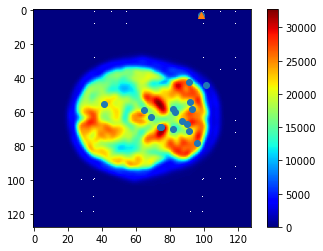

Slice nr  25
All axial cut fixations vector representation coordinate  [5303, 8379, 8895, 9541, 9669, 10554, 10566, 10684, 11201, 11587, 11690, 11719, 11830, 11962, 12366, 12547, 12972]
All axial cut fixations  [(41, 55, 233), (65, 59, 600), (69, 63, 216), (74, 69, 333), (75, 69, 366), (82, 58, 450), (82, 70, 316), (83, 60, 283), (87, 65, 433), (90, 67, 350), (91, 42, 266), (91, 71, 100), (92, 54, 200), (93, 58, 266), (96, 78, 250), (98, 3, 266), (101, 44, 150)]
Removed point coordinates  98 3
Removed point vector representation coordinate  12547
Fixation point was removed -------------------------------- 25
Subject  029_S_1073
Fixation points  [(59, 74, 416), (60, 54, 400), (61, 63, 200), (64, 70, 566), (67, 75, 366), (68, 64, 283), (72, 50, 250), (77, 65, 283), (78, 15, 166), (78, 72, 266), (80, 77, 400), (82, 63, 383), (82, 65, 350), (83, 3, 400), (83, 53, 233), (83, 68, 283), (84, 63, 250), (86, 65, 466), (87, 65, 466), (87, 66, 300), (87, 75, 366), (88, 63, 350), (89, 72, 350), (9

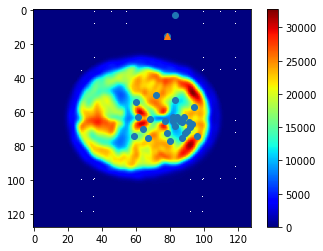

Slice nr  32
All axial cut fixations vector representation coordinate  [7626, 7734, 7871, 8262, 8651, 8768, 9266, 9921, 9999, 10056, 10317, 10559, 10561, 10627, 10677, 10692, 10815, 11073, 11201, 11202, 11211, 11327, 11464, 11591, 11714, 11845, 11971, 12089, 12362]
All axial cut fixations  [(59, 74, 416), (60, 54, 400), (61, 63, 200), (64, 70, 566), (67, 75, 366), (68, 64, 283), (72, 50, 250), (77, 65, 283), (78, 15, 166), (78, 72, 266), (80, 77, 400), (82, 63, 383), (82, 65, 350), (83, 3, 400), (83, 53, 233), (83, 68, 283), (84, 63, 250), (86, 65, 466), (87, 65, 466), (87, 66, 300), (87, 75, 366), (88, 63, 350), (89, 72, 350), (90, 71, 216), (91, 66, 300), (92, 69, 350), (93, 67, 200), (94, 57, 466), (96, 74, 217)]
Removed point coordinates  78 15
Removed point vector representation coordinate  9999
Fixation point was removed -------------------------------- 26
Subject  029_S_1073
Fixation points  [(59, 74, 416), (60, 54, 400), (61, 63, 200), (64, 70, 566), (67, 75, 366), (68, 64, 283

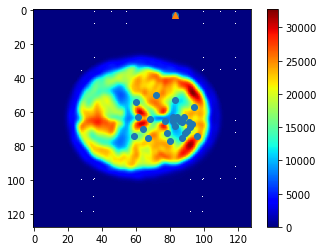

Slice nr  32
All axial cut fixations vector representation coordinate  [7626, 7734, 7871, 8262, 8651, 8768, 9266, 9921, 10056, 10317, 10559, 10561, 10627, 10677, 10692, 10815, 11073, 11201, 11202, 11211, 11327, 11464, 11591, 11714, 11845, 11971, 12089, 12362]
All axial cut fixations  [(59, 74, 416), (60, 54, 400), (61, 63, 200), (64, 70, 566), (67, 75, 366), (68, 64, 283), (72, 50, 250), (77, 65, 283), (78, 72, 266), (80, 77, 400), (82, 63, 383), (82, 65, 350), (83, 3, 400), (83, 53, 233), (83, 68, 283), (84, 63, 250), (86, 65, 466), (87, 65, 466), (87, 66, 300), (87, 75, 366), (88, 63, 350), (89, 72, 350), (90, 71, 216), (91, 66, 300), (92, 69, 350), (93, 67, 200), (94, 57, 466), (96, 74, 217)]
Removed point coordinates  83 3
Removed point vector representation coordinate  10627
Fixation point was removed -------------------------------- 27
Subject  029_S_1073
Fixation points  [(40, 8, 250), (66, 66, 416), (73, 61, 166), (86, 64, 366), (88, 63, 866), (90, 70, 333)]
Fixation points  [5

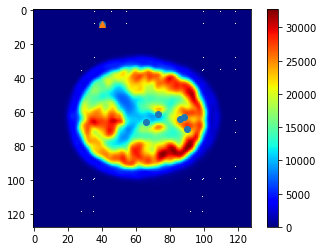

Slice nr  36
All axial cut fixations vector representation coordinate  [5128, 8514, 9405, 11072, 11327, 11590]
All axial cut fixations  [(40, 8, 250), (66, 66, 416), (73, 61, 166), (86, 64, 366), (88, 63, 866), (90, 70, 333)]
Removed point coordinates  40 8
Removed point vector representation coordinate  5128
Fixation point was removed -------------------------------- 28
Scan  606  of  714
Scan  607  of  714
Scan  608  of  714
Scan  609  of  714
Subject  031_S_0294
Fixation points  [(45, 64, 216), (66, 66, 383), (80, 67, 233), (84, 60, 167), (92, 64, 283), (104, 90, 333)]
Fixation points  [5824, 8514, 10307, 10812, 11840, 13402]


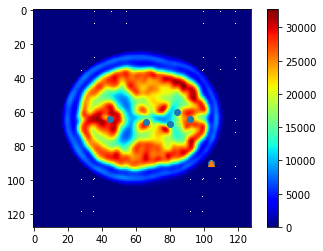

Slice nr  34
All axial cut fixations vector representation coordinate  [5824, 8514, 10307, 10812, 11840, 13402]
All axial cut fixations  [(45, 64, 216), (66, 66, 383), (80, 67, 233), (84, 60, 167), (92, 64, 283), (104, 90, 333)]
Removed point coordinates  104 90
Removed point vector representation coordinate  13402
Fixation point was removed -------------------------------- 29
Scan  610  of  714
Subject  032_S_0214
Fixation points  [(38, 70, 150), (40, 61, 167), (61, 20, 133), (69, 64, 416), (74, 71, 250), (76, 63, 616), (77, 60, 566), (77, 76, 333), (81, 65, 249), (81, 73, 233), (83, 68, 300), (83, 72, 383), (85, 59, 233), (88, 59, 400)]
Fixation points  [4934, 5181, 7828, 8896, 9543, 9791, 9916, 9932, 10433, 10441, 10692, 10696, 10939, 11323]


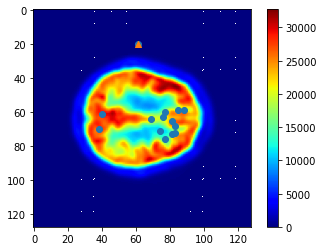

Slice nr  41
All axial cut fixations vector representation coordinate  [4934, 5181, 7828, 8896, 9543, 9791, 9916, 9932, 10433, 10441, 10692, 10696, 10939, 11323]
All axial cut fixations  [(38, 70, 150), (40, 61, 167), (61, 20, 133), (69, 64, 416), (74, 71, 250), (76, 63, 616), (77, 60, 566), (77, 76, 333), (81, 65, 249), (81, 73, 233), (83, 68, 300), (83, 72, 383), (85, 59, 233), (88, 59, 400)]
Removed point coordinates  61 20
Removed point vector representation coordinate  7828
Fixation point was removed -------------------------------- 30
Subject  032_S_0214
Fixation points  [(38, 70, 150), (40, 61, 167), (61, 20, 133), (69, 64, 416), (74, 71, 250), (76, 63, 616), (77, 60, 566), (77, 76, 333), (81, 65, 249), (81, 73, 233), (83, 68, 300), (83, 72, 383), (85, 59, 233), (88, 59, 400)]
Fixation points  [4934, 5181, 7828, 8896, 9543, 9791, 9916, 9932, 10433, 10441, 10692, 10696, 10939, 11323]


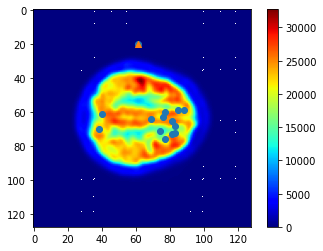

Slice nr  45
All axial cut fixations vector representation coordinate  [4934, 5181, 7828, 8896, 9543, 9791, 9916, 9932, 10433, 10441, 10692, 10696, 10939, 11323]
All axial cut fixations  [(38, 70, 150), (40, 61, 167), (61, 20, 133), (69, 64, 416), (74, 71, 250), (76, 63, 616), (77, 60, 566), (77, 76, 333), (81, 65, 249), (81, 73, 233), (83, 68, 300), (83, 72, 383), (85, 59, 233), (88, 59, 400)]
Removed point coordinates  61 20
Removed point vector representation coordinate  7828
Fixation point was removed -------------------------------- 31
Scan  611  of  714
Scan  612  of  714
Scan  613  of  714
Subject  033_S_0513
Fixation points  [(73, 60, 200), (74, 72, 866), (75, 62, 350), (76, 66, 583), (77, 70, 533), (79, 74, 300), (80, 56, 283), (87, 79, 300), (88, 52, 100), (89, 63, 150), (89, 68, 233), (95, 53, 133), (97, 83, 117), (98, 66, 150), (104, 78, 133), (107, 71, 333)]
Fixation points  [9404, 9544, 9662, 9794, 9926, 10186, 10296, 11215, 11316, 11455, 11460, 12213, 12499, 12610, 13390

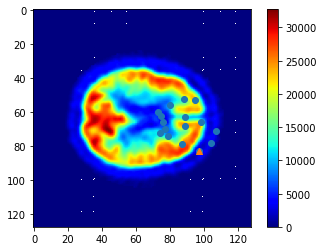

Slice nr  38
All axial cut fixations vector representation coordinate  [9404, 9544, 9662, 9794, 9926, 10186, 10296, 11215, 11316, 11455, 11460, 12213, 12499, 12610, 13390, 13767]
All axial cut fixations  [(73, 60, 200), (74, 72, 866), (75, 62, 350), (76, 66, 583), (77, 70, 533), (79, 74, 300), (80, 56, 283), (87, 79, 300), (88, 52, 100), (89, 63, 150), (89, 68, 233), (95, 53, 133), (97, 83, 117), (98, 66, 150), (104, 78, 133), (107, 71, 333)]
Removed point coordinates  97 83
Removed point vector representation coordinate  12499
Fixation point was removed -------------------------------- 32
Subject  033_S_0513
Fixation points  [(73, 60, 200), (74, 72, 866), (75, 62, 350), (76, 66, 583), (77, 70, 533), (79, 74, 300), (80, 56, 283), (87, 79, 300), (88, 52, 100), (89, 63, 150), (89, 68, 233), (95, 53, 133), (98, 66, 150), (104, 78, 133), (107, 71, 333)]
Fixation points  [9404, 9544, 9662, 9794, 9926, 10186, 10296, 11215, 11316, 11455, 11460, 12213, 12610, 13390, 13767]


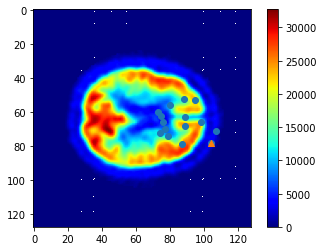

Slice nr  38
All axial cut fixations vector representation coordinate  [9404, 9544, 9662, 9794, 9926, 10186, 10296, 11215, 11316, 11455, 11460, 12213, 12610, 13390, 13767]
All axial cut fixations  [(73, 60, 200), (74, 72, 866), (75, 62, 350), (76, 66, 583), (77, 70, 533), (79, 74, 300), (80, 56, 283), (87, 79, 300), (88, 52, 100), (89, 63, 150), (89, 68, 233), (95, 53, 133), (98, 66, 150), (104, 78, 133), (107, 71, 333)]
Removed point coordinates  104 78
Removed point vector representation coordinate  13390
Fixation point was removed -------------------------------- 33
Scan  614  of  714
Scan  615  of  714
Subject  035_S_0292
Fixation points  [(53, 74, 250), (64, 66, 366), (66, 51, 200), (66, 67, 199), (70, 66, 100), (77, 65, 283), (77, 68, 150), (79, 55, 317), (81, 62, 500), (82, 70, 200), (87, 62, 266), (118, 117, 100)]
Fixation points  [6858, 8258, 8499, 8515, 9026, 9921, 9924, 10167, 10430, 10566, 11198, 15221]


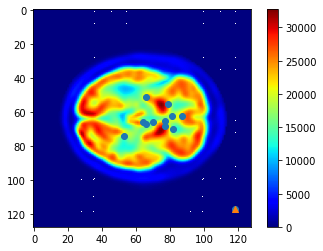

Slice nr  25
All axial cut fixations vector representation coordinate  [6858, 8258, 8499, 8515, 9026, 9921, 9924, 10167, 10430, 10566, 11198, 15221]
All axial cut fixations  [(53, 74, 250), (64, 66, 366), (66, 51, 200), (66, 67, 199), (70, 66, 100), (77, 65, 283), (77, 68, 150), (79, 55, 317), (81, 62, 500), (82, 70, 200), (87, 62, 266), (118, 117, 100)]
Removed point coordinates  118 117
Removed point vector representation coordinate  15221
Fixation point was removed -------------------------------- 34
Subject  035_S_0292
Fixation points  [(37, 34, 200), (47, 52, 466), (48, 43, 117), (53, 47, 416), (55, 49, 116), (57, 69, 233), (58, 48, 616), (59, 49, 150), (61, 67, 333), (62, 54, 100), (65, 52, 217), (65, 53, 133), (65, 59, 133), (65, 121, 200), (68, 56, 350), (69, 56, 167), (69, 59, 383), (70, 55, 150), (71, 123, 83), (77, 55, 382), (77, 60, 433), (77, 66, 300), (78, 55, 233), (81, 70, 400), (85, 63, 283), (87, 61, 416), (88, 64, 383), (90, 55, 350), (90, 66, 483), (92, 66, 550), (9

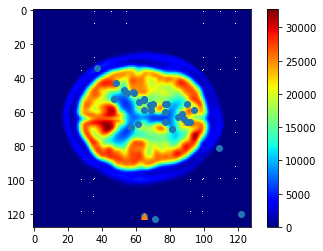

Slice nr  35
All axial cut fixations vector representation coordinate  [4770, 6068, 6187, 6831, 7089, 7365, 7472, 7601, 7875, 7990, 8372, 8373, 8379, 8441, 8760, 8888, 8891, 9015, 9211, 9911, 9916, 9922, 10039, 10438, 10943, 11197, 11328, 11575, 11586, 11842, 12091, 14033, 15736]
All axial cut fixations  [(37, 34, 200), (47, 52, 466), (48, 43, 117), (53, 47, 416), (55, 49, 116), (57, 69, 233), (58, 48, 616), (59, 49, 150), (61, 67, 333), (62, 54, 100), (65, 52, 217), (65, 53, 133), (65, 59, 133), (65, 121, 200), (68, 56, 350), (69, 56, 167), (69, 59, 383), (70, 55, 150), (71, 123, 83), (77, 55, 382), (77, 60, 433), (77, 66, 300), (78, 55, 233), (81, 70, 400), (85, 63, 283), (87, 61, 416), (88, 64, 383), (90, 55, 350), (90, 66, 483), (92, 66, 550), (94, 59, 349), (109, 81, 133), (122, 120, 200)]
Removed point coordinates  65 121
Removed point vector representation coordinate  8441
Fixation point was removed -------------------------------- 35
Subject  035_S_0292
Fixation points  [(37, 3

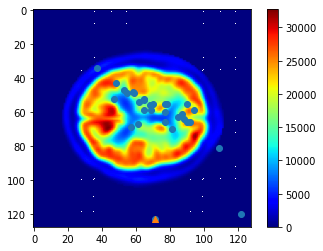

Slice nr  35
All axial cut fixations vector representation coordinate  [4770, 6068, 6187, 6831, 7089, 7365, 7472, 7601, 7875, 7990, 8372, 8373, 8379, 8760, 8888, 8891, 9015, 9211, 9911, 9916, 9922, 10039, 10438, 10943, 11197, 11328, 11575, 11586, 11842, 12091, 14033, 15736]
All axial cut fixations  [(37, 34, 200), (47, 52, 466), (48, 43, 117), (53, 47, 416), (55, 49, 116), (57, 69, 233), (58, 48, 616), (59, 49, 150), (61, 67, 333), (62, 54, 100), (65, 52, 217), (65, 53, 133), (65, 59, 133), (68, 56, 350), (69, 56, 167), (69, 59, 383), (70, 55, 150), (71, 123, 83), (77, 55, 382), (77, 60, 433), (77, 66, 300), (78, 55, 233), (81, 70, 400), (85, 63, 283), (87, 61, 416), (88, 64, 383), (90, 55, 350), (90, 66, 483), (92, 66, 550), (94, 59, 349), (109, 81, 133), (122, 120, 200)]
Removed point coordinates  71 123
Removed point vector representation coordinate  9211
Fixation point was removed -------------------------------- 36
Subject  035_S_0292
Fixation points  [(37, 34, 200), (47, 52, 466)

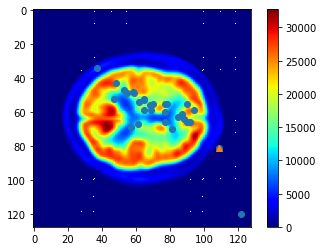

Slice nr  35
All axial cut fixations vector representation coordinate  [4770, 6068, 6187, 6831, 7089, 7365, 7472, 7601, 7875, 7990, 8372, 8373, 8379, 8760, 8888, 8891, 9015, 9911, 9916, 9922, 10039, 10438, 10943, 11197, 11328, 11575, 11586, 11842, 12091, 14033, 15736]
All axial cut fixations  [(37, 34, 200), (47, 52, 466), (48, 43, 117), (53, 47, 416), (55, 49, 116), (57, 69, 233), (58, 48, 616), (59, 49, 150), (61, 67, 333), (62, 54, 100), (65, 52, 217), (65, 53, 133), (65, 59, 133), (68, 56, 350), (69, 56, 167), (69, 59, 383), (70, 55, 150), (77, 55, 382), (77, 60, 433), (77, 66, 300), (78, 55, 233), (81, 70, 400), (85, 63, 283), (87, 61, 416), (88, 64, 383), (90, 55, 350), (90, 66, 483), (92, 66, 550), (94, 59, 349), (109, 81, 133), (122, 120, 200)]
Removed point coordinates  109 81
Removed point vector representation coordinate  14033
Fixation point was removed -------------------------------- 37
Scan  616  of  714
Subject  035_S_0997
Fixation points  [(70, 62, 350), (75, 73, 433),

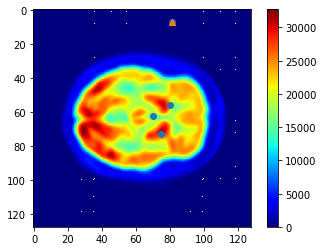

Slice nr  25
All axial cut fixations vector representation coordinate  [9022, 9673, 10296, 10375]
All axial cut fixations  [(70, 62, 350), (75, 73, 433), (80, 56, 333), (81, 7, 150)]
Removed point coordinates  81 7
Removed point vector representation coordinate  10375
Fixation point was removed -------------------------------- 38
Scan  617  of  714
Scan  618  of  714
Subject  036_S_0673
Fixation points  [(48, 5, 316), (51, 60, 333), (52, 69, 216), (61, 56, 200), (62, 66, 316), (78, 65, 216), (88, 64, 250)]
Fixation points  [6149, 6588, 6725, 7864, 8002, 10049, 11328]


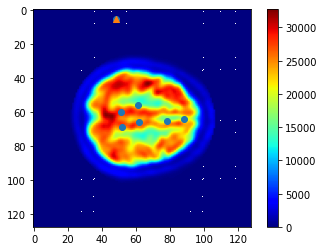

Slice nr  45
All axial cut fixations vector representation coordinate  [6149, 6588, 6725, 7864, 8002, 10049, 11328]
All axial cut fixations  [(48, 5, 316), (51, 60, 333), (52, 69, 216), (61, 56, 200), (62, 66, 316), (78, 65, 216), (88, 64, 250)]
Removed point coordinates  48 5
Removed point vector representation coordinate  6149
Fixation point was removed -------------------------------- 39
Scan  619  of  714
Scan  620  of  714
Scan  621  of  714
Subject  036_S_0976
Fixation points  [(69, 80, 433), (69, 84, 649), (71, 56, 233), (73, 6, 316), (73, 75, 283), (76, 84, 300), (91, 82, 217)]
Fixation points  [8912, 8916, 9144, 9350, 9419, 9812, 11730]


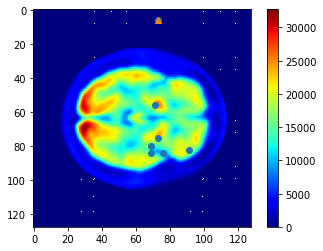

Slice nr  25
All axial cut fixations vector representation coordinate  [8912, 8916, 9144, 9350, 9419, 9812, 11730]
All axial cut fixations  [(69, 80, 433), (69, 84, 649), (71, 56, 233), (73, 6, 316), (73, 75, 283), (76, 84, 300), (91, 82, 217)]
Removed point coordinates  73 6
Removed point vector representation coordinate  9350
Fixation point was removed -------------------------------- 40
Scan  622  of  714
Subject  036_S_1135
Fixation points  [(56, 46, 83), (62, 50, 183), (66, 66, 316), (80, 76, 250), (82, 65, 433), (85, 66, 233), (91, 67, 233), (97, 78, 233)]
Fixation points  [7214, 7986, 8514, 10316, 10561, 10946, 11715, 12494]


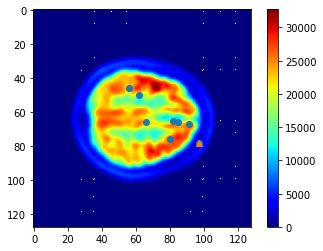

Slice nr  45
All axial cut fixations vector representation coordinate  [7214, 7986, 8514, 10316, 10561, 10946, 11715, 12494]
All axial cut fixations  [(56, 46, 83), (62, 50, 183), (66, 66, 316), (80, 76, 250), (82, 65, 433), (85, 66, 233), (91, 67, 233), (97, 78, 233)]
Removed point coordinates  97 78
Removed point vector representation coordinate  12494
Fixation point was removed -------------------------------- 41
Scan  623  of  714
Scan  624  of  714
Subject  037_S_0150
Fixation points  [(43, 77, 283), (52, 89, 100), (55, 60, 350), (55, 71, 283), (71, 72, 383), (74, 69, 266), (79, 65, 333), (84, 66, 383), (102, 85, 250)]
Fixation points  [5581, 6745, 7100, 7111, 9160, 9541, 10177, 10818, 13141]


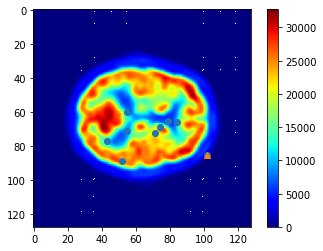

Slice nr  34
All axial cut fixations vector representation coordinate  [5581, 6745, 7100, 7111, 9160, 9541, 10177, 10818, 13141]
All axial cut fixations  [(43, 77, 283), (52, 89, 100), (55, 60, 350), (55, 71, 283), (71, 72, 383), (74, 69, 266), (79, 65, 333), (84, 66, 383), (102, 85, 250)]
Removed point coordinates  102 85
Removed point vector representation coordinate  13141
Fixation point was removed -------------------------------- 42
Scan  625  of  714
Subject  037_S_0377
Fixation points  [(58, 67, 200), (78, 77, 200), (88, 65, 216), (90, 71, 300), (94, 67, 483), (97, 63, 250), (106, 74, 500)]
Fixation points  [7491, 10061, 11329, 11591, 12099, 12479, 13642]


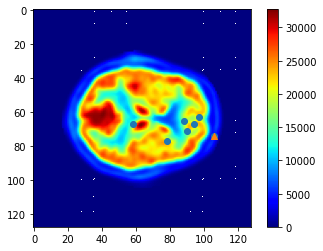

Slice nr  33
All axial cut fixations vector representation coordinate  [7491, 10061, 11329, 11591, 12099, 12479, 13642]
All axial cut fixations  [(58, 67, 200), (78, 77, 200), (88, 65, 216), (90, 71, 300), (94, 67, 483), (97, 63, 250), (106, 74, 500)]
Removed point coordinates  106 74
Removed point vector representation coordinate  13642
Fixation point was removed -------------------------------- 43
Scan  626  of  714
Scan  627  of  714
Subject  037_S_0566
Fixation points  [(64, 59, 466), (88, 60, 350), (88, 77, 233), (89, 69, 250), (98, 97, 333)]
Fixation points  [8251, 11324, 11341, 11461, 12641]


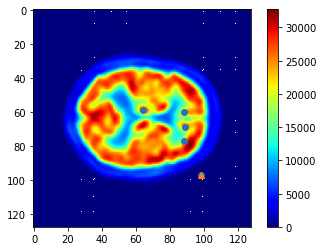

Slice nr  34
All axial cut fixations vector representation coordinate  [8251, 11324, 11341, 11461, 12641]
All axial cut fixations  [(64, 59, 466), (88, 60, 350), (88, 77, 233), (89, 69, 250), (98, 97, 333)]
Removed point coordinates  98 97
Removed point vector representation coordinate  12641
Fixation point was removed -------------------------------- 44
Scan  628  of  714
Scan  629  of  714
Scan  630  of  714
Subject  041_S_1010
Fixation points  [(48, 5, 316), (51, 60, 333), (52, 69, 216), (61, 56, 200), (62, 66, 316), (78, 65, 216), (88, 64, 250)]
Fixation points  [6149, 6588, 6725, 7864, 8002, 10049, 11328]


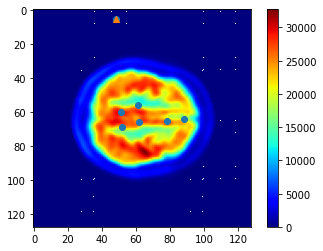

Slice nr  45
All axial cut fixations vector representation coordinate  [6149, 6588, 6725, 7864, 8002, 10049, 11328]
All axial cut fixations  [(48, 5, 316), (51, 60, 333), (52, 69, 216), (61, 56, 200), (62, 66, 316), (78, 65, 216), (88, 64, 250)]
Removed point coordinates  48 5
Removed point vector representation coordinate  6149
Fixation point was removed -------------------------------- 45
Scan  631  of  714
Scan  632  of  714
Scan  633  of  714
Scan  634  of  714
Scan  635  of  714
Scan  636  of  714
Scan  637  of  714
Scan  638  of  714
Scan  639  of  714
Scan  640  of  714
Scan  641  of  714
Scan  642  of  714
Scan  643  of  714
Scan  644  of  714
Scan  645  of  714
Scan  646  of  714
Scan  647  of  714
Scan  648  of  714
Scan  649  of  714
Scan  650  of  714
Scan  651  of  714
Scan  652  of  714
Scan  653  of  714
Scan  654  of  714
Scan  655  of  714
Scan  656  of  714
Scan  657  of  714
Scan  658  of  714
Scan  659  of  714
Scan  660  of  714
Scan  661  of  714
Scan  662  of  71

In [ ]:
removed_points = remove_outlier_fixations(mci_allData, 1500)

Subject  007_S_0293
Fixation points  [(52, 46, 416), (52, 79, 433), (75, 61, 433), (77, 58, 366), (84, 60, 100), (84, 63, 133), (92, 62, 183), (93, 63, 150), (99, 59, 150)]
Fixation points  [6702, 6735, 9661, 9914, 10812, 10815, 11838, 11967, 12731]


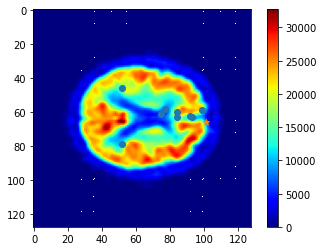

Point Re-added ------
Slice nr  37
All axial cut fixations vector representation coordinate  [6702, 6735, 9661, 9914, 10812, 10815, 11838, 11967, 12731, 12994]
All axial cut fixations  [(52, 46, 416), (52, 79, 433), (75, 61, 433), (77, 58, 366), (84, 60, 100), (84, 63, 133), (92, 62, 183), (93, 63, 150), (99, 59, 150), (101, 66, 233)]
Re-added point coordinates  101 66
Re-added point vector representation coordinate  12994
---------------
Subject  007_S_0414
Fixation points  [(56, 46, 433), (62, 40, 316), (64, 65, 400), (68, 58, 83), (69, 56, 316), (70, 67, 266), (71, 59, 217), (71, 60, 1133), (72, 66, 1049), (73, 57, 400), (75, 61, 416), (76, 58, 766), (77, 48, 100), (77, 60, 183), (77, 61, 1149), (79, 63, 250), (80, 61, 250), (80, 64, 1149), (82, 62, 383), (83, 70, 167), (85, 57, 266), (85, 62, 333), (87, 65, 283), (109, 59, 216)]
Fixation points  [7214, 7976, 8257, 8762, 8888, 9027, 9147, 9148, 9282, 9401, 9661, 9786, 9904, 9916, 9917, 10175, 10301, 10304, 10558, 10694, 10937, 10942

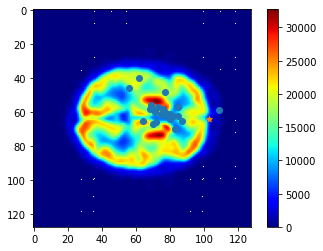

Point Re-added ------
Slice nr  28
All axial cut fixations vector representation coordinate  [7214, 7976, 8257, 8762, 8888, 9027, 9147, 9148, 9282, 9401, 9661, 9786, 9904, 9916, 9917, 10175, 10301, 10304, 10558, 10694, 10937, 10942, 11201, 13248, 14011]
All axial cut fixations  [(56, 46, 433), (62, 40, 316), (64, 65, 400), (68, 58, 83), (69, 56, 316), (70, 67, 266), (71, 59, 217), (71, 60, 1133), (72, 66, 1049), (73, 57, 400), (75, 61, 416), (76, 58, 766), (77, 48, 100), (77, 60, 183), (77, 61, 1149), (79, 63, 250), (80, 61, 250), (80, 64, 1149), (82, 62, 383), (83, 70, 167), (85, 57, 266), (85, 62, 333), (87, 65, 283), (109, 59, 216), (103, 64, 250)]
Re-added point coordinates  103 64
Re-added point vector representation coordinate  13248
---------------
Subject  022_S_1351
Fixation points  [(68, 55, 283), (75, 73, 366), (76, 80, 666), (86, 56, 350), (95, 49, 200), (108, 58, 166)]
Fixation points  [8759, 9673, 9808, 11064, 12209, 13882]


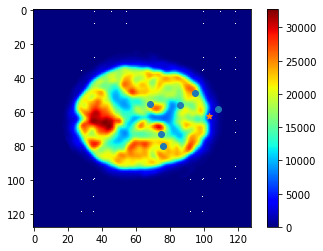

Point Re-added ------
Slice nr  34
All axial cut fixations vector representation coordinate  [8759, 9673, 9808, 11064, 12209, 13246, 13882]
All axial cut fixations  [(68, 55, 283), (75, 73, 366), (76, 80, 666), (86, 56, 350), (95, 49, 200), (108, 58, 166), (103, 62, 133)]
Re-added point coordinates  103 62
Re-added point vector representation coordinate  13246
---------------


In [ ]:
readd_points(mci_allData, removed_points, [5, 9, 20])

In [ ]:
print_all_individual_slices_with_fixation_points(mci_allData)

Subject  005_S_0546
Fixation points  [(64, 66, 167), (73, 81, 166), (74, 38, 216), (74, 61, 183), (74, 69, 600), (74, 87, 233), (75, 42, 283), (86, 63, 250), (91, 58, 266), (94, 63, 283), (116, 110, 83)]
Fixation points  [8258, 9425, 9510, 9533, 9541, 9559, 9642, 11071, 11706, 12095, 14958]


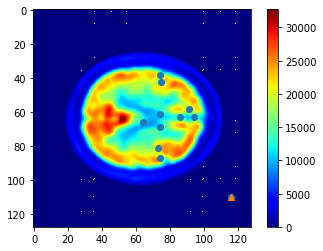

Point Removed ------
Slice nr  39
All axial cut fixations vector representation coordinate  [8258, 9425, 9510, 9533, 9541, 9559, 9642, 11071, 11706, 12095]
All axial cut fixations  [(64, 66, 167), (73, 81, 166), (74, 38, 216), (74, 61, 183), (74, 69, 600), (74, 87, 233), (75, 42, 283), (86, 63, 250), (91, 58, 266), (94, 63, 283)]
Removed point coordinates  116 110
Removed point vector representation coordinate  14958
---------------
Subject  007_S_0414
Fixation points  [(42, 2, 383), (58, 47, 200), (59, 77, 366), (60, 43, 233), (62, 48, 233), (64, 46, 433), (64, 69, 167), (65, 49, 283), (65, 56, 383), (65, 81, 316), (66, 64, 333), (66, 80, 200), (67, 71, 433), (69, 48, 283), (69, 51, 100), (71, 57, 483), (72, 63, 250), (72, 66, 316), (73, 54, 383), (73, 57, 483), (73, 67, 266), (74, 77, 550), (75, 66, 466), (77, 53, 316), (78, 53, 383), (78, 59, 400), (78, 61, 283), (79, 68, 183), (79, 72, 316), (80, 51, 383), (80, 63, 200), (82, 66, 266), (83, 74, 450), (85, 53, 216), (91, 79, 133), (

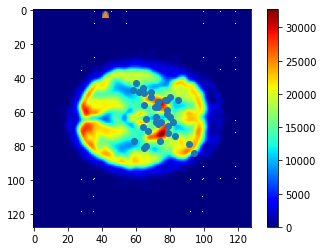

Point Removed ------
Slice nr  25
All axial cut fixations vector representation coordinate  [7471, 7629, 7723, 7984, 8238, 8261, 8369, 8376, 8401, 8512, 8528, 8647, 8880, 8883, 9145, 9279, 9282, 9398, 9401, 9411, 9549, 9666, 9909, 10037, 10043, 10045, 10180, 10184, 10291, 10303, 10562, 10698, 10933, 11727, 12116]
All axial cut fixations  [(58, 47, 200), (59, 77, 366), (60, 43, 233), (62, 48, 233), (64, 46, 433), (64, 69, 167), (65, 49, 283), (65, 56, 383), (65, 81, 316), (66, 64, 333), (66, 80, 200), (67, 71, 433), (69, 48, 283), (69, 51, 100), (71, 57, 483), (72, 63, 250), (72, 66, 316), (73, 54, 383), (73, 57, 483), (73, 67, 266), (74, 77, 550), (75, 66, 466), (77, 53, 316), (78, 53, 383), (78, 59, 400), (78, 61, 283), (79, 68, 183), (79, 72, 316), (80, 51, 383), (80, 63, 200), (82, 66, 266), (83, 74, 450), (85, 53, 216), (91, 79, 133), (94, 84, 200)]
Removed point coordinates  42 2
Removed point vector representation coordinate  5378
---------------
Subject  027_S_0408
Fixation poin

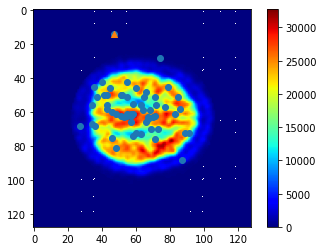

Point Removed ------
Slice nr  45
All axial cut fixations vector representation coordinate  [3524, 4408, 4419, 4525, 4676, 4787, 5162, 5298, 5554, 5560, 5562, 5806, 5948, 5963, 6205, 6225, 6578, 6590, 6706, 6847, 7082, 7091, 7101, 7102, 7357, 7358, 7362, 7479, 7485, 7498, 7726, 7752, 8120, 8137, 8251, 8371, 8496, 8514, 8639, 8640, 8763, 8902, 9023, 9139, 9150, 9164, 9272, 9414, 9500, 9913, 10157, 10685, 10931, 11066, 11224, 11464, 11720]
All axial cut fixations  [(27, 68, 250), (34, 56, 583), (34, 67, 83), (35, 45, 466), (36, 68, 216), (37, 51, 500), (40, 42, 600), (41, 50, 400), (43, 50, 233), (43, 56, 350), (43, 58, 1349), (45, 46, 333), (46, 60, 100), (46, 75, 400), (48, 61, 183), (48, 81, 450), (51, 50, 516), (51, 62, 283), (52, 50, 616), (53, 63, 450), (55, 42, 400), (55, 51, 783), (55, 61, 533), (55, 62, 216), (57, 61, 500), (57, 62, 466), (57, 66, 216), (58, 55, 166), (58, 61, 233), (58, 74, 300), (60, 46, 466), (60, 72, 216), (63, 56, 233), (63, 73, 333), (64, 59, 333), (65, 51

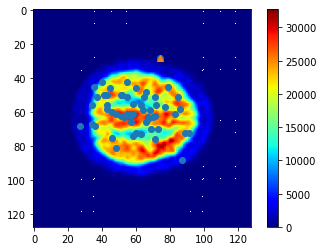

Point Removed ------
Slice nr  45
All axial cut fixations vector representation coordinate  [3524, 4408, 4419, 4525, 4676, 4787, 5162, 5298, 5554, 5560, 5562, 5806, 5948, 5963, 6205, 6225, 6578, 6590, 6706, 6847, 7082, 7091, 7101, 7102, 7357, 7358, 7362, 7479, 7485, 7498, 7726, 7752, 8120, 8137, 8251, 8371, 8496, 8514, 8639, 8640, 8763, 8902, 9023, 9139, 9150, 9164, 9272, 9414, 9913, 10157, 10685, 10931, 11066, 11224, 11464, 11720]
All axial cut fixations  [(27, 68, 250), (34, 56, 583), (34, 67, 83), (35, 45, 466), (36, 68, 216), (37, 51, 500), (40, 42, 600), (41, 50, 400), (43, 50, 233), (43, 56, 350), (43, 58, 1349), (45, 46, 333), (46, 60, 100), (46, 75, 400), (48, 61, 183), (48, 81, 450), (51, 50, 516), (51, 62, 283), (52, 50, 616), (53, 63, 450), (55, 42, 400), (55, 51, 783), (55, 61, 533), (55, 62, 216), (57, 61, 500), (57, 62, 466), (57, 66, 216), (58, 55, 166), (58, 61, 233), (58, 74, 300), (60, 46, 466), (60, 72, 216), (63, 56, 233), (63, 73, 333), (64, 59, 333), (65, 51, 217)

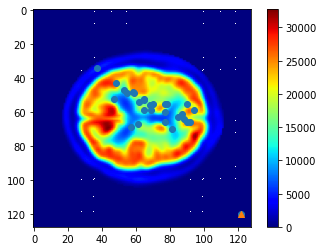

Point Removed ------
Slice nr  35
All axial cut fixations vector representation coordinate  [4770, 6068, 6187, 6831, 7089, 7365, 7472, 7601, 7875, 7990, 8372, 8373, 8379, 8760, 8888, 8891, 9015, 9911, 9916, 9922, 10039, 10438, 10943, 11197, 11328, 11575, 11586, 11842, 12091]
All axial cut fixations  [(37, 34, 200), (47, 52, 466), (48, 43, 117), (53, 47, 416), (55, 49, 116), (57, 69, 233), (58, 48, 616), (59, 49, 150), (61, 67, 333), (62, 54, 100), (65, 52, 217), (65, 53, 133), (65, 59, 133), (68, 56, 350), (69, 56, 167), (69, 59, 383), (70, 55, 150), (77, 55, 382), (77, 60, 433), (77, 66, 300), (78, 55, 233), (81, 70, 400), (85, 63, 283), (87, 61, 416), (88, 64, 383), (90, 55, 350), (90, 66, 483), (92, 66, 550), (94, 59, 349)]
Removed point coordinates  122 120
Removed point vector representation coordinate  15736
---------------


In [ ]:
remove_point(mci_allData, 575, 39, 116, 110)
remove_point(mci_allData, 581, 25, 42, 2)
remove_point(mci_allData, 604, 45, 47, 14)
remove_point(mci_allData, 604, 45, 74, 28)
remove_point(mci_allData, 615, 35, 122, 120)

---------------------------------

Starting Removing Fixation Points ---------------------------------
Scan  0  of  314
Scan  1  of  314
Scan  2  of  314
Scan  3  of  314
Scan  4  of  314
Scan  5  of  314
Scan  6  of  314
Scan  7  of  314
Scan  8  of  314
Scan  9  of  314
Scan  10  of  314
Scan  11  of  314
Scan  12  of  314
Scan  13  of  314
Scan  14  of  314
Scan  15  of  314
Scan  16  of  314
Scan  17  of  314
Scan  18  of  314
Scan  19  of  314
Scan  20  of  314
Scan  21  of  314
Scan  22  of  314
Scan  23  of  314
Scan  24  of  314
Scan  25  of  314
Scan  26  of  314
Scan  27  of  314
Scan  28  of  314
Scan  29  of  314
Scan  30  of  314
Scan  31  of  314
Scan  32  of  314
Scan  33  of  314
Scan  34  of  314
Scan  35  of  314
Scan  36  of  314
Scan  37  of  314
Scan  38  of  314
Scan  39  of  314
Scan  40  of  314
Scan  41  of  314
Scan  42  of  314
Scan  43  of  314
Scan  44  of  314
Scan  45  of  314
Scan  46  of  314
Scan  47  of  314
Scan  48  of  314
Scan  49  of  314
Scan  50  of  314
Scan  51  of  314
Scan  

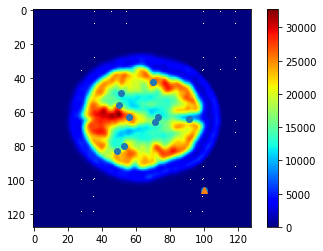

Slice nr  40
All axial cut fixations vector representation coordinate  [6355, 6456, 6577, 6864, 7231, 9002, 9154, 9407, 11712, 12906]
All axial cut fixations  [(49, 83, 583), (50, 56, 400), (51, 49, 316), (53, 80, 350), (56, 63, 366), (70, 42, 216), (71, 66, 500), (73, 63, 316), (91, 64, 400), (100, 106, 433)]
Removed point coordinates  100 106
Removed point vector representation coordinate  12906
Fixation point was removed -------------------------------- 0
Scan  256  of  314
Subject  027_S_1254
Fixation points  [(24, 8, 283), (66, 65, 400), (67, 64, 100), (70, 58, 183), (74, 59, 100), (79, 65, 183), (79, 69, 300), (80, 79, 566), (82, 84, 266), (83, 61, 316), (83, 76, 566), (85, 52, 216)]
Fixation points  [3080, 8513, 8640, 9018, 9531, 10177, 10181, 10319, 10580, 10685, 10700, 10932]


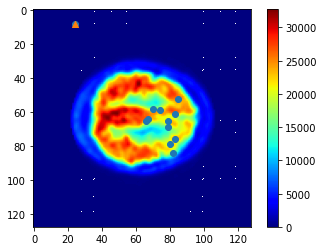

Slice nr  45
All axial cut fixations vector representation coordinate  [3080, 8513, 8640, 9018, 9531, 10177, 10181, 10319, 10580, 10685, 10700, 10932]
All axial cut fixations  [(24, 8, 283), (66, 65, 400), (67, 64, 100), (70, 58, 183), (74, 59, 100), (79, 65, 183), (79, 69, 300), (80, 79, 566), (82, 84, 266), (83, 61, 316), (83, 76, 566), (85, 52, 216)]
Removed point coordinates  24 8
Removed point vector representation coordinate  3080
Fixation point was removed -------------------------------- 1
Scan  257  of  314
Scan  258  of  314
Subject  109_S_1157
Fixation points  [(56, 53, 483), (78, 61, 283), (92, 63, 350), (115, 100, 200)]
Fixation points  [7221, 10045, 11839, 14820]


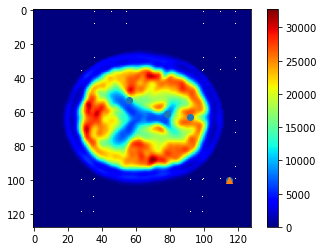

Slice nr  35
All axial cut fixations vector representation coordinate  [7221, 10045, 11839, 14820]
All axial cut fixations  [(56, 53, 483), (78, 61, 283), (92, 63, 350), (115, 100, 200)]
Removed point coordinates  115 100
Removed point vector representation coordinate  14820
Fixation point was removed -------------------------------- 2
Scan  259  of  314
Scan  260  of  314
Subject  036_S_0760
Fixation points  [(31, 33, 316), (44, 77, 300), (53, 44, 400), (54, 80, 233), (60, 66, 216), (61, 84, 250), (76, 58, 283), (77, 73, 233)]
Fixation points  [4001, 5709, 6828, 6992, 7746, 7892, 9786, 9929]


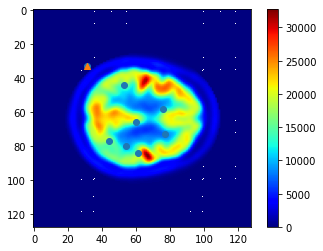

Slice nr  41
All axial cut fixations vector representation coordinate  [4001, 5709, 6828, 6992, 7746, 7892, 9786, 9929]
All axial cut fixations  [(31, 33, 316), (44, 77, 300), (53, 44, 400), (54, 80, 233), (60, 66, 216), (61, 84, 250), (76, 58, 283), (77, 73, 233)]
Removed point coordinates  31 33
Removed point vector representation coordinate  4001
Fixation point was removed -------------------------------- 3
Scan  261  of  314
Scan  262  of  314
Scan  263  of  314
Scan  264  of  314
Subject  128_S_1430
Fixation points  [(52, 62, 183), (59, 66, 433), (64, 50, 349), (69, 81, 567), (72, 9, 266), (76, 60, 216), (77, 65, 533)]
Fixation points  [6718, 7618, 8242, 8913, 9225, 9788, 9921]


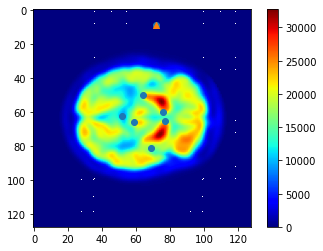

Slice nr  25
All axial cut fixations vector representation coordinate  [6718, 7618, 8242, 8913, 9225, 9788, 9921]
All axial cut fixations  [(52, 62, 183), (59, 66, 433), (64, 50, 349), (69, 81, 567), (72, 9, 266), (76, 60, 216), (77, 65, 533)]
Removed point coordinates  72 9
Removed point vector representation coordinate  9225
Fixation point was removed -------------------------------- 4
Subject  128_S_1430
Fixation points  [(29, 49, 500), (48, 82, 400), (54, 86, 400), (60, 64, 416), (64, 77, 200), (76, 73, 366), (88, 67, 300)]
Fixation points  [3761, 6226, 6998, 7744, 8269, 9801, 11331]


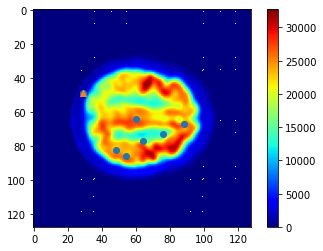

Slice nr  44
All axial cut fixations vector representation coordinate  [3761, 6226, 6998, 7744, 8269, 9801, 11331]
All axial cut fixations  [(29, 49, 500), (48, 82, 400), (54, 86, 400), (60, 64, 416), (64, 77, 200), (76, 73, 366), (88, 67, 300)]
Removed point coordinates  29 49
Removed point vector representation coordinate  3761
Fixation point was removed -------------------------------- 5
Scan  265  of  314
Scan  266  of  314
Scan  267  of  314
Subject  057_S_1371
Fixation points  [(47, 65, 600), (70, 77, 650), (74, 52, 433), (75, 59, 383), (81, 61, 150), (92, 65, 333), (97, 59, 300), (101, 63, 100)]
Fixation points  [6081, 9037, 9524, 9659, 10429, 11841, 12475, 12991]


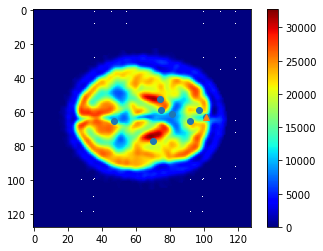

Slice nr  29
All axial cut fixations vector representation coordinate  [6081, 9037, 9524, 9659, 10429, 11841, 12475, 12991]
All axial cut fixations  [(47, 65, 600), (70, 77, 650), (74, 52, 433), (75, 59, 383), (81, 61, 150), (92, 65, 333), (97, 59, 300), (101, 63, 100)]
Removed point coordinates  101 63
Removed point vector representation coordinate  12991
Fixation point was removed -------------------------------- 6
Subject  057_S_1371
Fixation points  [(51, 6, 33), (60, 23, 83), (61, 56, 550), (61, 65, 683), (68, 70, 416), (74, 61, 366), (76, 65, 500), (79, 66, 600), (80, 73, 183), (83, 63, 350), (90, 61, 300), (92, 72, 283)]
Fixation points  [6534, 7703, 7864, 7873, 8774, 9533, 9793, 10178, 10313, 10687, 11581, 11848]


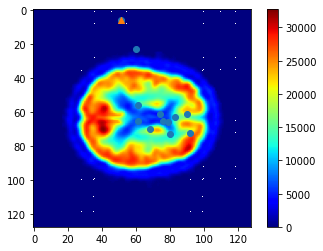

Slice nr  36
All axial cut fixations vector representation coordinate  [6534, 7703, 7864, 7873, 8774, 9533, 9793, 10178, 10313, 10687, 11581, 11848]
All axial cut fixations  [(51, 6, 33), (60, 23, 83), (61, 56, 550), (61, 65, 683), (68, 70, 416), (74, 61, 366), (76, 65, 500), (79, 66, 600), (80, 73, 183), (83, 63, 350), (90, 61, 300), (92, 72, 283)]
Removed point coordinates  51 6
Removed point vector representation coordinate  6534
Fixation point was removed -------------------------------- 7
Scan  268  of  314
Scan  269  of  314
Subject  036_S_1001
Fixation points  [(56, 61, 533), (62, 56, 316), (62, 65, 350), (66, 33, 216), (67, 66, 216), (70, 52, 366), (74, 61, 1049), (75, 65, 666), (83, 68, 216), (86, 19, 100), (86, 57, 150), (88, 54, 233)]
Fixation points  [7229, 7992, 8001, 8481, 8642, 9012, 9533, 9665, 10692, 11027, 11065, 11318]


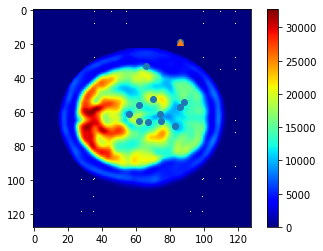

Slice nr  25
All axial cut fixations vector representation coordinate  [7229, 7992, 8001, 8481, 8642, 9012, 9533, 9665, 10692, 11027, 11065, 11318]
All axial cut fixations  [(56, 61, 533), (62, 56, 316), (62, 65, 350), (66, 33, 216), (67, 66, 216), (70, 52, 366), (74, 61, 1049), (75, 65, 666), (83, 68, 216), (86, 19, 100), (86, 57, 150), (88, 54, 233)]
Removed point coordinates  86 19
Removed point vector representation coordinate  11027
Fixation point was removed -------------------------------- 8
Scan  270  of  314
Scan  271  of  314
Subject  016_S_0991
Fixation points  [(65, 72, 233), (68, 83, 533), (70, 69, 250), (71, 83, 483), (75, 74, 366), (78, 56, 183), (87, 67, 316), (89, 75, 483), (90, 67, 350), (92, 71, 283), (96, 66, 283), (109, 90, 183)]
Fixation points  [8392, 8787, 9029, 9171, 9674, 10040, 11203, 11467, 11587, 11847, 12354, 14042]


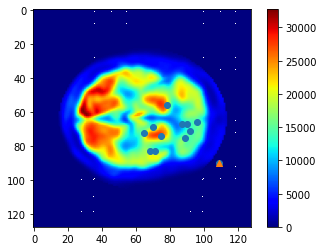

Slice nr  25
All axial cut fixations vector representation coordinate  [8392, 8787, 9029, 9171, 9674, 10040, 11203, 11467, 11587, 11847, 12354, 14042]
All axial cut fixations  [(65, 72, 233), (68, 83, 533), (70, 69, 250), (71, 83, 483), (75, 74, 366), (78, 56, 183), (87, 67, 316), (89, 75, 483), (90, 67, 350), (92, 71, 283), (96, 66, 283), (109, 90, 183)]
Removed point coordinates  109 90
Removed point vector representation coordinate  14042
Fixation point was removed -------------------------------- 9
Subject  016_S_0991
Fixation points  [(64, 70, 150), (85, 74, 233), (86, 91, 350), (87, 81, 500), (91, 66, 100), (95, 70, 483), (102, 71, 433), (105, 56, 183), (113, 64, 117)]
Fixation points  [8262, 10954, 11099, 11217, 11714, 12230, 13127, 13496, 14528]


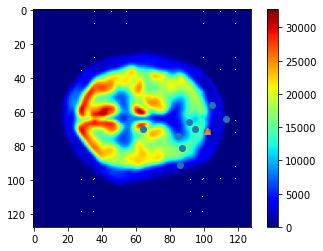

Slice nr  31
All axial cut fixations vector representation coordinate  [8262, 10954, 11099, 11217, 11714, 12230, 13127, 13496, 14528]
All axial cut fixations  [(64, 70, 150), (85, 74, 233), (86, 91, 350), (87, 81, 500), (91, 66, 100), (95, 70, 483), (102, 71, 433), (105, 56, 183), (113, 64, 117)]
Removed point coordinates  102 71
Removed point vector representation coordinate  13127
Fixation point was removed -------------------------------- 10
Subject  016_S_0991
Fixation points  [(64, 70, 150), (85, 74, 233), (86, 91, 350), (87, 81, 500), (91, 66, 100), (95, 70, 483), (105, 56, 183), (113, 64, 117)]
Fixation points  [8262, 10954, 11099, 11217, 11714, 12230, 13496, 14528]


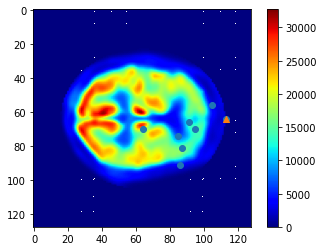

Slice nr  31
All axial cut fixations vector representation coordinate  [8262, 10954, 11099, 11217, 11714, 12230, 13496, 14528]
All axial cut fixations  [(64, 70, 150), (85, 74, 233), (86, 91, 350), (87, 81, 500), (91, 66, 100), (95, 70, 483), (105, 56, 183), (113, 64, 117)]
Removed point coordinates  113 64
Removed point vector representation coordinate  14528
Fixation point was removed -------------------------------- 11
Scan  272  of  314
Scan  273  of  314
Scan  274  of  314
Scan  275  of  314
Scan  276  of  314
Subject  100_S_0747
Fixation points  [(51, 71, 266), (56, 64, 366), (62, 82, 316), (63, 52, 316), (68, 63, 450), (68, 72, 233), (69, 85, 133), (70, 48, 150), (70, 54, 100), (70, 61, 183), (88, 73, 316), (95, 66, 150), (101, 65, 217)]
Fixation points  [6599, 7232, 8018, 8116, 8767, 8776, 8917, 9008, 9014, 9021, 11337, 12226, 12993]


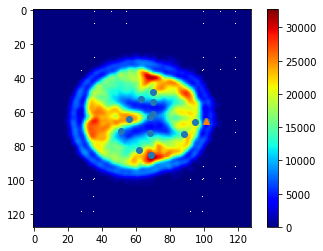

Slice nr  40
All axial cut fixations vector representation coordinate  [6599, 7232, 8018, 8116, 8767, 8776, 8917, 9008, 9014, 9021, 11337, 12226, 12993]
All axial cut fixations  [(51, 71, 266), (56, 64, 366), (62, 82, 316), (63, 52, 316), (68, 63, 450), (68, 72, 233), (69, 85, 133), (70, 48, 150), (70, 54, 100), (70, 61, 183), (88, 73, 316), (95, 66, 150), (101, 65, 217)]
Removed point coordinates  101 65
Removed point vector representation coordinate  12993
Fixation point was removed -------------------------------- 12
Scan  277  of  314
Scan  278  of  314
Scan  279  of  314
Subject  062_S_0730
Fixation points  [(44, 65, 316), (45, 65, 167), (58, 70, 383), (59, 64, 83), (59, 65, 233), (64, 68, 450), (66, 63, 233), (72, 65, 366), (80, 64, 566), (86, 59, 316), (89, 77, 250), (95, 89, 100)]
Fixation points  [5697, 5825, 7494, 7616, 7617, 8260, 8511, 9281, 10304, 11067, 11469, 12249]


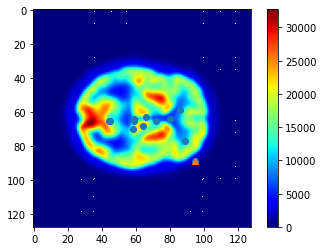

Slice nr  29
All axial cut fixations vector representation coordinate  [5697, 5825, 7494, 7616, 7617, 8260, 8511, 9281, 10304, 11067, 11469, 12249]
All axial cut fixations  [(44, 65, 316), (45, 65, 167), (58, 70, 383), (59, 64, 83), (59, 65, 233), (64, 68, 450), (66, 63, 233), (72, 65, 366), (80, 64, 566), (86, 59, 316), (89, 77, 250), (95, 89, 100)]
Removed point coordinates  95 89
Removed point vector representation coordinate  12249
Fixation point was removed -------------------------------- 13
Scan  280  of  314
Scan  281  of  314
Subject  057_S_1379
Fixation points  [(52, 87, 350), (57, 76, 433), (57, 88, 350), (59, 59, 283), (59, 80, 116), (59, 91, 250), (61, 85, 1083), (62, 49, 400), (64, 72, 533), (66, 87, 166), (72, 63, 233), (76, 72, 216), (78, 69, 150), (93, 68, 250), (122, 127, 183)]
Fixation points  [6743, 7372, 7384, 7611, 7632, 7643, 7893, 7985, 8264, 8535, 9279, 9800, 10053, 11972, 15743]


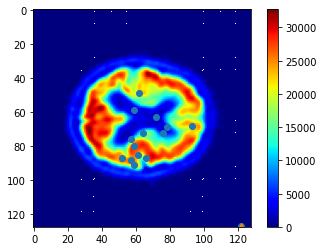

Slice nr  37
All axial cut fixations vector representation coordinate  [6743, 7372, 7384, 7611, 7632, 7643, 7893, 7985, 8264, 8535, 9279, 9800, 10053, 11972, 15743]
All axial cut fixations  [(52, 87, 350), (57, 76, 433), (57, 88, 350), (59, 59, 283), (59, 80, 116), (59, 91, 250), (61, 85, 1083), (62, 49, 400), (64, 72, 533), (66, 87, 166), (72, 63, 233), (76, 72, 216), (78, 69, 150), (93, 68, 250), (122, 127, 183)]
Removed point coordinates  122 127
Removed point vector representation coordinate  15743
Fixation point was removed -------------------------------- 14
Scan  282  of  314
Scan  283  of  314
Scan  284  of  314
Scan  285  of  314
Subject  031_S_0321
Fixation points  [(53, 64, 366), (55, 64, 583), (68, 56, 183), (68, 71, 350), (70, 76, 516), (73, 65, 366), (85, 51, 267), (86, 58, 350), (87, 66, 416), (89, 60, 333), (89, 63, 733), (95, 84, 300), (96, 70, 250)]
Fixation points  [6848, 7104, 8760, 8775, 9036, 9409, 10931, 11066, 11202, 11452, 11455, 12244, 12358]


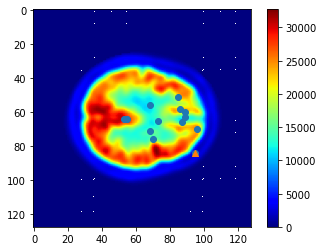

Slice nr  40
All axial cut fixations vector representation coordinate  [6848, 7104, 8760, 8775, 9036, 9409, 10931, 11066, 11202, 11452, 11455, 12244, 12358]
All axial cut fixations  [(53, 64, 366), (55, 64, 583), (68, 56, 183), (68, 71, 350), (70, 76, 516), (73, 65, 366), (85, 51, 267), (86, 58, 350), (87, 66, 416), (89, 60, 333), (89, 63, 733), (95, 84, 300), (96, 70, 250)]
Removed point coordinates  95 84
Removed point vector representation coordinate  12244
Fixation point was removed -------------------------------- 15
Scan  286  of  314
Scan  287  of  314
Scan  288  of  314
Scan  289  of  314
Scan  290  of  314
Subject  003_S_1059
Fixation points  [(64, 9, 200), (70, 74, 400), (73, 49, 433), (74, 62, 300), (81, 66, 300)]
Fixation points  [8201, 9034, 9393, 9534, 10434]


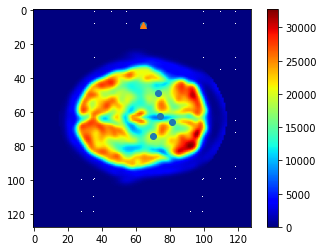

Slice nr  24
All axial cut fixations vector representation coordinate  [8201, 9034, 9393, 9534, 10434]
All axial cut fixations  [(64, 9, 200), (70, 74, 400), (73, 49, 433), (74, 62, 300), (81, 66, 300)]
Removed point coordinates  64 9
Removed point vector representation coordinate  8201
Fixation point was removed -------------------------------- 16
Subject  003_S_1059
Fixation points  [(23, 6, 283), (45, 62, 250), (57, 51, 233), (58, 61, 333), (58, 77, 400), (62, 48, 416), (63, 83, 250), (65, 83, 316), (75, 64, 749), (79, 72, 250), (82, 72, 483)]
Fixation points  [2950, 5822, 7347, 7485, 7501, 7984, 8147, 8403, 9664, 10184, 10568]


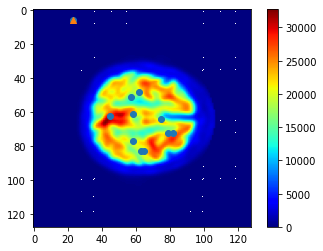

Slice nr  46
All axial cut fixations vector representation coordinate  [2950, 5822, 7347, 7485, 7501, 7984, 8147, 8403, 9664, 10184, 10568]
All axial cut fixations  [(23, 6, 283), (45, 62, 250), (57, 51, 233), (58, 61, 333), (58, 77, 400), (62, 48, 416), (63, 83, 250), (65, 83, 316), (75, 64, 749), (79, 72, 250), (82, 72, 483)]
Removed point coordinates  23 6
Removed point vector representation coordinate  2950
Fixation point was removed -------------------------------- 17
Scan  291  of  314
Subject  137_S_1041
Fixation points  [(42, 114, 117), (44, 119, 150), (75, 55, 200), (85, 73, 233), (87, 57, 316), (88, 65, 566)]
Fixation points  [5490, 5751, 9655, 10953, 11193, 11329]


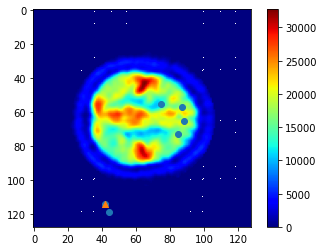

Slice nr  45
All axial cut fixations vector representation coordinate  [5490, 5751, 9655, 10953, 11193, 11329]
All axial cut fixations  [(42, 114, 117), (44, 119, 150), (75, 55, 200), (85, 73, 233), (87, 57, 316), (88, 65, 566)]
Removed point coordinates  42 114
Removed point vector representation coordinate  5490
Fixation point was removed -------------------------------- 18
Scan  292  of  314
Subject  127_S_0754
Fixation points  [(49, 78, 283), (58, 88, 266), (66, 61, 350), (73, 88, 266), (81, 68, 283), (86, 82, 366), (94, 67, 283), (106, 67, 283)]
Fixation points  [6350, 7512, 8509, 9432, 10436, 11090, 12099, 13635]


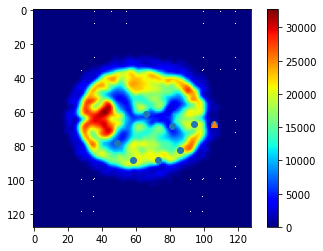

Slice nr  34
All axial cut fixations vector representation coordinate  [6350, 7512, 8509, 9432, 10436, 11090, 12099, 13635]
All axial cut fixations  [(49, 78, 283), (58, 88, 266), (66, 61, 350), (73, 88, 266), (81, 68, 283), (86, 82, 366), (94, 67, 283), (106, 67, 283)]
Removed point coordinates  106 67
Removed point vector representation coordinate  13635
Fixation point was removed -------------------------------- 19
Scan  293  of  314
Scan  294  of  314
Subject  033_S_1281
Fixation points  [(54, 86, 466), (58, 58, 316), (62, 82, 283), (66, 78, 383), (67, 83, 600), (68, 9, 183), (69, 85, 583), (73, 54, 383)]
Fixation points  [6998, 7482, 8018, 8526, 8659, 8713, 8917, 9398]


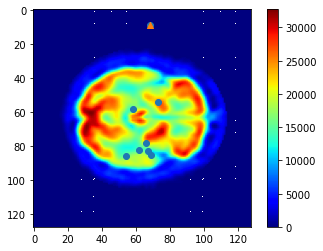

Slice nr  25
All axial cut fixations vector representation coordinate  [6998, 7482, 8018, 8526, 8659, 8713, 8917, 9398]
All axial cut fixations  [(54, 86, 466), (58, 58, 316), (62, 82, 283), (66, 78, 383), (67, 83, 600), (68, 9, 183), (69, 85, 583), (73, 54, 383)]
Removed point coordinates  68 9
Removed point vector representation coordinate  8713
Fixation point was removed -------------------------------- 20
Scan  295  of  314
Scan  296  of  314
Scan  297  of  314
Subject  011_S_0003
Fixation points  [(52, 60, 583), (56, 65, 217), (60, 68, 1133), (61, 62, 300), (66, 66, 333), (68, 72, 433), (80, 62, 183), (87, 64, 400), (100, 108, 100)]
Fixation points  [6716, 7233, 7748, 7870, 8514, 8776, 10302, 11200, 12908]


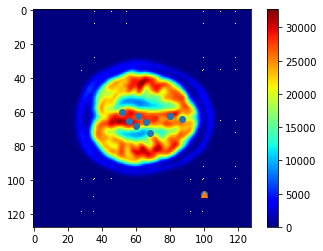

Slice nr  45
All axial cut fixations vector representation coordinate  [6716, 7233, 7748, 7870, 8514, 8776, 10302, 11200, 12908]
All axial cut fixations  [(52, 60, 583), (56, 65, 217), (60, 68, 1133), (61, 62, 300), (66, 66, 333), (68, 72, 433), (80, 62, 183), (87, 64, 400), (100, 108, 100)]
Removed point coordinates  100 108
Removed point vector representation coordinate  12908
Fixation point was removed -------------------------------- 21
Subject  011_S_0003
Fixation points  [(52, 56, 816), (56, 65, 316), (56, 72, 283), (60, 65, 233), (64, 67, 383), (72, 61, 316), (83, 65, 233), (94, 114, 233)]
Fixation points  [6712, 7233, 7240, 7745, 8259, 9277, 10689, 12146]


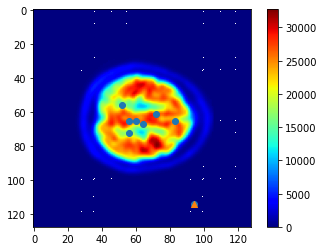

Slice nr  48
All axial cut fixations vector representation coordinate  [6712, 7233, 7240, 7745, 8259, 9277, 10689, 12146]
All axial cut fixations  [(52, 56, 816), (56, 65, 316), (56, 72, 283), (60, 65, 233), (64, 67, 383), (72, 61, 316), (83, 65, 233), (94, 114, 233)]
Removed point coordinates  94 114
Removed point vector representation coordinate  12146
Fixation point was removed -------------------------------- 22
Scan  298  of  314
Scan  299  of  314
Scan  300  of  314
Scan  301  of  314
Subject  024_S_1171
Fixation points  [(51, 67, 283), (60, 22, 333), (64, 82, 250), (68, 62, 366), (85, 64, 416)]
Fixation points  [6595, 7702, 8274, 8766, 10944]


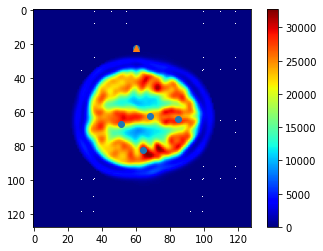

Slice nr  43
All axial cut fixations vector representation coordinate  [6595, 7702, 8274, 8766, 10944]
All axial cut fixations  [(51, 67, 283), (60, 22, 333), (64, 82, 250), (68, 62, 366), (85, 64, 416)]
Removed point coordinates  60 22
Removed point vector representation coordinate  7702
Fixation point was removed -------------------------------- 23
Scan  302  of  314
Scan  303  of  314
Subject  021_S_1109
Fixation points  [(39, 52, 217), (53, 69, 266), (61, 43, 450), (71, 105, 166)]
Fixation points  [5044, 6853, 7851, 9193]


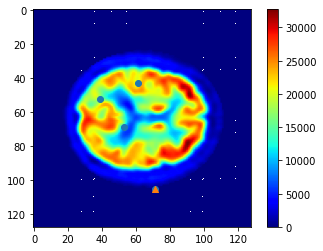

Slice nr  35
All axial cut fixations vector representation coordinate  [5044, 6853, 7851, 9193]
All axial cut fixations  [(39, 52, 217), (53, 69, 266), (61, 43, 450), (71, 105, 166)]
Removed point coordinates  71 105
Removed point vector representation coordinate  9193
Fixation point was removed -------------------------------- 24
Scan  304  of  314
Subject  007_S_0316
Fixation points  [(43, 5, 383), (45, 50, 316), (47, 83, 416), (57, 72, 266), (62, 72, 217), (63, 61, 300), (70, 80, 216), (81, 67, 300), (88, 64, 166)]
Fixation points  [5509, 5810, 6099, 7368, 8008, 8125, 9040, 10435, 11328]


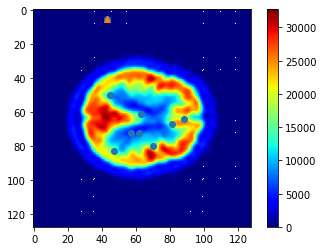

Slice nr  39
All axial cut fixations vector representation coordinate  [5509, 5810, 6099, 7368, 8008, 8125, 9040, 10435, 11328]
All axial cut fixations  [(43, 5, 383), (45, 50, 316), (47, 83, 416), (57, 72, 266), (62, 72, 217), (63, 61, 300), (70, 80, 216), (81, 67, 300), (88, 64, 166)]
Removed point coordinates  43 5
Removed point vector representation coordinate  5509
Fixation point was removed -------------------------------- 25
Scan  305  of  314
Scan  306  of  314
Subject  011_S_0183
Fixation points  [(53, 89, 250), (54, 48, 167), (56, 38, 166), (56, 80, 133), (62, 55, 17), (65, 77, 300), (73, 68, 216), (81, 62, 250), (86, 73, 133), (86, 90, 216), (92, 75, 117), (93, 60, 300), (99, 76, 316)]
Fixation points  [6873, 6960, 7206, 7248, 7991, 8397, 9412, 10430, 11081, 11098, 11851, 11964, 12748]


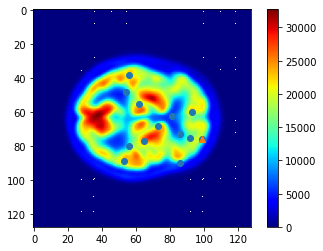

Slice nr  31
All axial cut fixations vector representation coordinate  [6873, 6960, 7206, 7248, 7991, 8397, 9412, 10430, 11081, 11098, 11851, 11964, 12748]
All axial cut fixations  [(53, 89, 250), (54, 48, 167), (56, 38, 166), (56, 80, 133), (62, 55, 17), (65, 77, 300), (73, 68, 216), (81, 62, 250), (86, 73, 133), (86, 90, 216), (92, 75, 117), (93, 60, 300), (99, 76, 316)]
Removed point coordinates  99 76
Removed point vector representation coordinate  12748
Fixation point was removed -------------------------------- 26
Subject  011_S_0183
Fixation points  [(35, 69, 366), (52, 67, 183), (54, 80, 583), (55, 52, 433), (59, 60, 200), (75, 67, 366), (110, 121, 250)]
Fixation points  [4549, 6723, 6992, 7092, 7612, 9667, 14201]


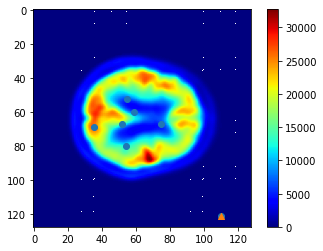

Slice nr  40
All axial cut fixations vector representation coordinate  [4549, 6723, 6992, 7092, 7612, 9667, 14201]
All axial cut fixations  [(35, 69, 366), (52, 67, 183), (54, 80, 583), (55, 52, 433), (59, 60, 200), (75, 67, 366), (110, 121, 250)]
Removed point coordinates  110 121
Removed point vector representation coordinate  14201
Fixation point was removed -------------------------------- 27
Scan  307  of  314
Subject  021_S_0343
Fixation points  [(9, 41, 433), (59, 46, 166), (67, 64, 350), (79, 65, 300)]
Fixation points  [1193, 7598, 8640, 10177]


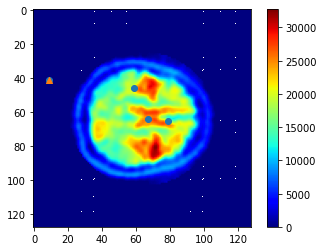

Slice nr  45
All axial cut fixations vector representation coordinate  [1193, 7598, 8640, 10177]
All axial cut fixations  [(9, 41, 433), (59, 46, 166), (67, 64, 350), (79, 65, 300)]
Removed point coordinates  9 41
Removed point vector representation coordinate  1193
Fixation point was removed -------------------------------- 28
Scan  308  of  314
Scan  309  of  314
Scan  310  of  314
Scan  311  of  314
Scan  312  of  314
Scan  313  of  314
Subject  128_S_0266
Fixation points  [(54, 86, 466), (58, 58, 316), (62, 82, 283), (66, 78, 383), (67, 83, 600), (68, 9, 183), (69, 85, 583), (73, 54, 383)]
Fixation points  [6998, 7482, 8018, 8526, 8659, 8713, 8917, 9398]


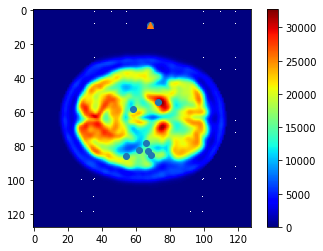

Slice nr  25
All axial cut fixations vector representation coordinate  [6998, 7482, 8018, 8526, 8659, 8713, 8917, 9398]
All axial cut fixations  [(54, 86, 466), (58, 58, 316), (62, 82, 283), (66, 78, 383), (67, 83, 600), (68, 9, 183), (69, 85, 583), (73, 54, 383)]
Removed point coordinates  68 9
Removed point vector representation coordinate  8713
Fixation point was removed -------------------------------- 29
Total fixation points removed:  30  -----------------------


In [ ]:
removed_points = remove_outlier_fixations(ad_allData, 1500)

Subject  057_S_1371
Fixation points  [(47, 65, 600), (70, 77, 650), (74, 52, 433), (75, 59, 383), (81, 61, 150), (92, 65, 333), (97, 59, 300)]
Fixation points  [6081, 9037, 9524, 9659, 10429, 11841, 12475]


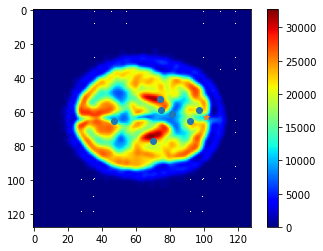

Point Re-added ------
Slice nr  29
All axial cut fixations vector representation coordinate  [6081, 9037, 9524, 9659, 10429, 11841, 12475, 12991]
All axial cut fixations  [(47, 65, 600), (70, 77, 650), (74, 52, 433), (75, 59, 383), (81, 61, 150), (92, 65, 333), (97, 59, 300), (101, 63, 100)]
Re-added point coordinates  101 63
Re-added point vector representation coordinate  12991
---------------
Subject  016_S_0991
Fixation points  [(64, 70, 150), (85, 74, 233), (86, 91, 350), (87, 81, 500), (91, 66, 100), (95, 70, 483), (105, 56, 183)]
Fixation points  [8262, 10954, 11099, 11217, 11714, 12230, 13496]


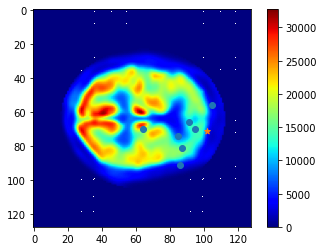

Point Re-added ------
Slice nr  31
All axial cut fixations vector representation coordinate  [8262, 10954, 11099, 11217, 11714, 12230, 13127, 13496]
All axial cut fixations  [(64, 70, 150), (85, 74, 233), (86, 91, 350), (87, 81, 500), (91, 66, 100), (95, 70, 483), (105, 56, 183), (102, 71, 433)]
Re-added point coordinates  102 71
Re-added point vector representation coordinate  13127
---------------
Subject  100_S_0747
Fixation points  [(51, 71, 266), (56, 64, 366), (62, 82, 316), (63, 52, 316), (68, 63, 450), (68, 72, 233), (69, 85, 133), (70, 48, 150), (70, 54, 100), (70, 61, 183), (88, 73, 316), (95, 66, 150)]
Fixation points  [6599, 7232, 8018, 8116, 8767, 8776, 8917, 9008, 9014, 9021, 11337, 12226]


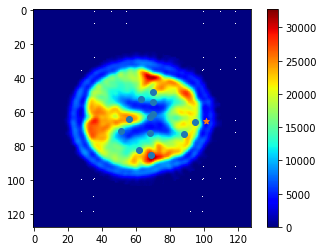

Point Re-added ------
Slice nr  40
All axial cut fixations vector representation coordinate  [6599, 7232, 8018, 8116, 8767, 8776, 8917, 9008, 9014, 9021, 11337, 12226, 12993]
All axial cut fixations  [(51, 71, 266), (56, 64, 366), (62, 82, 316), (63, 52, 316), (68, 63, 450), (68, 72, 233), (69, 85, 133), (70, 48, 150), (70, 54, 100), (70, 61, 183), (88, 73, 316), (95, 66, 150), (101, 65, 217)]
Re-added point coordinates  101 65
Re-added point vector representation coordinate  12993
---------------
Subject  011_S_0183
Fixation points  [(53, 89, 250), (54, 48, 167), (56, 38, 166), (56, 80, 133), (62, 55, 17), (65, 77, 300), (73, 68, 216), (81, 62, 250), (86, 73, 133), (86, 90, 216), (92, 75, 117), (93, 60, 300)]
Fixation points  [6873, 6960, 7206, 7248, 7991, 8397, 9412, 10430, 11081, 11098, 11851, 11964]


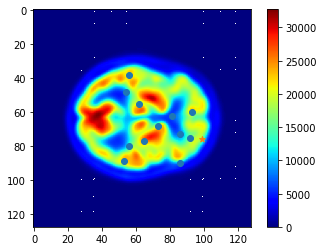

Point Re-added ------
Slice nr  31
All axial cut fixations vector representation coordinate  [6873, 6960, 7206, 7248, 7991, 8397, 9412, 10430, 11081, 11098, 11851, 11964, 12748]
All axial cut fixations  [(53, 89, 250), (54, 48, 167), (56, 38, 166), (56, 80, 133), (62, 55, 17), (65, 77, 300), (73, 68, 216), (81, 62, 250), (86, 73, 133), (86, 90, 216), (92, 75, 117), (93, 60, 300), (99, 76, 316)]
Re-added point coordinates  99 76
Re-added point vector representation coordinate  12748
---------------


In [ ]:
readd_points(ad_allData, removed_points, [6, 10, 12, 26])

In [ ]:
print_all_individual_slices_with_fixation_points(ad_allData)

Subject  036_S_0760
Fixation points  [(52, 20, 217), (54, 78, 316), (59, 45, 183), (65, 85, 366), (73, 59, 266), (75, 76, 183)]
Fixation points  [6676, 6990, 7597, 8405, 9403, 9676]


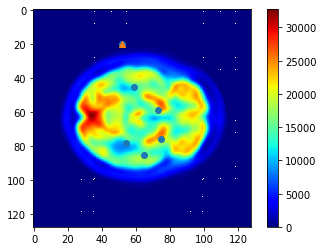

Point Removed ------
Slice nr  25
All axial cut fixations vector representation coordinate  [6990, 7597, 8405, 9403, 9676]
All axial cut fixations  [(54, 78, 316), (59, 45, 183), (65, 85, 366), (73, 59, 266), (75, 76, 183)]
Removed point coordinates  52 20
Removed point vector representation coordinate  6676
---------------
Subject  057_S_1371
Fixation points  [(60, 23, 83), (61, 56, 550), (61, 65, 683), (68, 70, 416), (74, 61, 366), (76, 65, 500), (79, 66, 600), (80, 73, 183), (83, 63, 350), (90, 61, 300), (92, 72, 283)]
Fixation points  [7703, 7864, 7873, 8774, 9533, 9793, 10178, 10313, 10687, 11581, 11848]


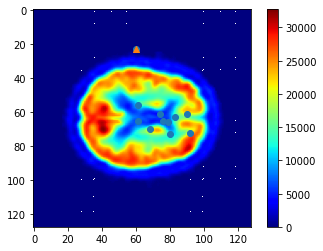

Point Removed ------
Slice nr  36
All axial cut fixations vector representation coordinate  [7864, 7873, 8774, 9533, 9793, 10178, 10313, 10687, 11581, 11848]
All axial cut fixations  [(61, 56, 550), (61, 65, 683), (68, 70, 416), (74, 61, 366), (76, 65, 500), (79, 66, 600), (80, 73, 183), (83, 63, 350), (90, 61, 300), (92, 72, 283)]
Removed point coordinates  60 23
Removed point vector representation coordinate  7703
---------------
Subject  114_S_0374
Fixation points  [(41, 79, 350), (51, 53, 516), (54, 84, 233), (66, 101, 150), (70, 72, 333), (74, 69, 233), (81, 65, 549), (81, 67, 100), (88, 66, 100), (90, 68, 117), (95, 68, 166), (96, 69, 183)]
Fixation points  [5327, 6581, 6996, 8549, 9032, 9541, 10433, 10435, 11330, 11588, 12228, 12357]


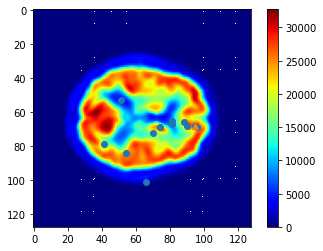

Point Removed ------
Slice nr  34
All axial cut fixations vector representation coordinate  [5327, 6581, 6996, 8549, 9032, 9541, 10433, 10435, 11330, 11588, 12357]
All axial cut fixations  [(41, 79, 350), (51, 53, 516), (54, 84, 233), (66, 101, 150), (70, 72, 333), (74, 69, 233), (81, 65, 549), (81, 67, 100), (88, 66, 100), (90, 68, 117), (96, 69, 183)]
Removed point coordinates  95 68
Removed point vector representation coordinate  12228
---------------
Subject  114_S_0374
Fixation points  [(41, 79, 350), (51, 53, 516), (54, 84, 233), (66, 101, 150), (70, 72, 333), (74, 69, 233), (81, 65, 549), (81, 67, 100), (88, 66, 100), (90, 68, 117), (96, 69, 183)]
Fixation points  [5327, 6581, 6996, 8549, 9032, 9541, 10433, 10435, 11330, 11588, 12357]


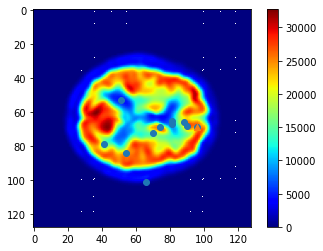

Point Removed ------
Slice nr  34
All axial cut fixations vector representation coordinate  [5327, 6581, 6996, 8549, 9032, 9541, 10433, 10435, 11330, 11588]
All axial cut fixations  [(41, 79, 350), (51, 53, 516), (54, 84, 233), (66, 101, 150), (70, 72, 333), (74, 69, 233), (81, 65, 549), (81, 67, 100), (88, 66, 100), (90, 68, 117)]
Removed point coordinates  96 69
Removed point vector representation coordinate  12357
---------------
Subject  137_S_1041
Fixation points  [(44, 119, 150), (75, 55, 200), (85, 73, 233), (87, 57, 316), (88, 65, 566)]
Fixation points  [5751, 9655, 10953, 11193, 11329]


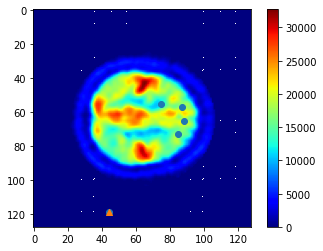

Point Removed ------
Slice nr  45
All axial cut fixations vector representation coordinate  [9655, 10953, 11193, 11329]
All axial cut fixations  [(75, 55, 200), (85, 73, 233), (87, 57, 316), (88, 65, 566)]
Removed point coordinates  44 119
Removed point vector representation coordinate  5751
---------------
Subject  057_S_0474
Fixation points  [(35, 57, 366), (59, 53, 300), (65, 60, 400), (70, 106, 250), (88, 64, 383)]
Fixation points  [4537, 7605, 8380, 9066, 11328]


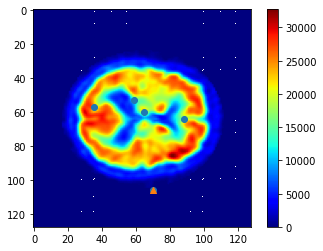

Point Removed ------
Slice nr  34
All axial cut fixations vector representation coordinate  [4537, 7605, 8380, 11328]
All axial cut fixations  [(35, 57, 366), (59, 53, 300), (65, 60, 400), (88, 64, 383)]
Removed point coordinates  70 106
Removed point vector representation coordinate  9066
---------------
Subject  013_S_1161
Fixation points  [(58, 50, 433), (69, 55, 233), (72, 54, 333), (81, 97, 233)]
Fixation points  [7474, 8887, 9270, 10465]


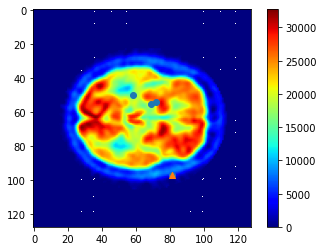

Point Removed ------
Slice nr  25
All axial cut fixations vector representation coordinate  [7474, 8887, 9270]
All axial cut fixations  [(58, 50, 433), (69, 55, 233), (72, 54, 333)]
Removed point coordinates  81 97
Removed point vector representation coordinate  10465
---------------


In [ ]:
remove_point(ad_allData, 260, 25, 52, 20)
remove_point(ad_allData, 267, 36, 60, 23)
remove_point(ad_allData, 288, 34, 66, 101)
remove_point(ad_allData, 291, 45, 44, 119)
remove_point(ad_allData, 295, 34, 70, 106)
remove_point(ad_allData, 309, 25, 81, 97)

------------------------------

Starting Removing Fixation Points ---------------------------------
Scan  0  of  365
Scan  1  of  365
Scan  2  of  365
Scan  3  of  365
Scan  4  of  365
Scan  5  of  365
Scan  6  of  365
Scan  7  of  365
Scan  8  of  365
Scan  9  of  365
Scan  10  of  365
Scan  11  of  365
Scan  12  of  365
Scan  13  of  365
Scan  14  of  365
Scan  15  of  365
Scan  16  of  365
Scan  17  of  365
Scan  18  of  365
Scan  19  of  365
Scan  20  of  365
Scan  21  of  365
Scan  22  of  365
Scan  23  of  365
Scan  24  of  365
Scan  25  of  365
Scan  26  of  365
Scan  27  of  365
Scan  28  of  365
Scan  29  of  365
Scan  30  of  365
Scan  31  of  365
Scan  32  of  365
Scan  33  of  365
Scan  34  of  365
Scan  35  of  365
Scan  36  of  365
Scan  37  of  365
Scan  38  of  365
Scan  39  of  365
Scan  40  of  365
Scan  41  of  365
Scan  42  of  365
Scan  43  of  365
Scan  44  of  365
Scan  45  of  365
Scan  46  of  365
Scan  47  of  365
Scan  48  of  365
Scan  49  of  365
Scan  50  of  365
Scan  51  of  365
Scan  

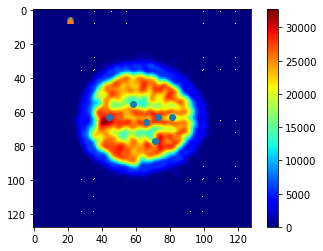

Slice nr  46
All axial cut fixations vector representation coordinate  [2694, 5695, 7479, 8514, 9165, 9407, 10431]
All axial cut fixations  [(21, 6, 300), (44, 63, 300), (58, 55, 183), (66, 66, 350), (71, 77, 350), (73, 63, 216), (81, 63, 450)]
Removed point coordinates  21 6
Removed point vector representation coordinate  2694
Fixation point was removed -------------------------------- 0
Scan  284  of  365
Scan  285  of  365
Scan  286  of  365
Subject  010_S_0067
Fixation points  [(16, 24, 266), (56, 60, 200), (57, 68, 316), (77, 71, 483)]
Fixation points  [2072, 7228, 7364, 9927]


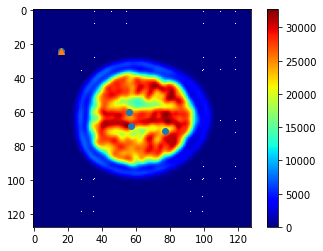

Slice nr  47
All axial cut fixations vector representation coordinate  [2072, 7228, 7364, 9927]
All axial cut fixations  [(16, 24, 266), (56, 60, 200), (57, 68, 316), (77, 71, 483)]
Removed point coordinates  16 24
Removed point vector representation coordinate  2072
Fixation point was removed -------------------------------- 1
Scan  287  of  365
Scan  288  of  365
Scan  289  of  365
Scan  290  of  365
Scan  291  of  365
Scan  292  of  365
Subject  011_S_0021
Fixation points  [(57, 70, 150), (58, 65, 283), (72, 68, 166), (73, 71, 250), (91, 90, 183), (104, 122, 117)]
Fixation points  [7366, 7489, 9284, 9415, 11738, 13434]


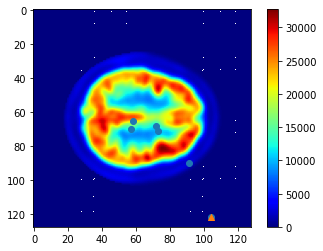

Slice nr  40
All axial cut fixations vector representation coordinate  [7366, 7489, 9284, 9415, 11738, 13434]
All axial cut fixations  [(57, 70, 150), (58, 65, 283), (72, 68, 166), (73, 71, 250), (91, 90, 183), (104, 122, 117)]
Removed point coordinates  104 122
Removed point vector representation coordinate  13434
Fixation point was removed -------------------------------- 2
Scan  293  of  365
Subject  011_S_0023
Fixation points  [(41, 58, 217), (52, 79, 433), (53, 61, 383), (55, 7, 233), (72, 48, 216), (73, 61, 266), (84, 79, 316), (92, 55, 833)]
Fixation points  [5306, 6735, 6845, 7047, 9264, 9405, 10831, 11831]


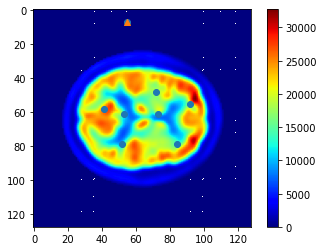

Slice nr  34
All axial cut fixations vector representation coordinate  [5306, 6735, 6845, 7047, 9264, 9405, 10831, 11831]
All axial cut fixations  [(41, 58, 217), (52, 79, 433), (53, 61, 383), (55, 7, 233), (72, 48, 216), (73, 61, 266), (84, 79, 316), (92, 55, 833)]
Removed point coordinates  55 7
Removed point vector representation coordinate  7047
Fixation point was removed -------------------------------- 3
Scan  294  of  365
Scan  295  of  365
Subject  012_S_1133
Fixation points  [(32, 26, 150), (48, 66, 350), (53, 61, 233), (55, 49, 333), (59, 61, 383), (79, 65, 266)]
Fixation points  [4122, 6210, 6845, 7089, 7613, 10177]


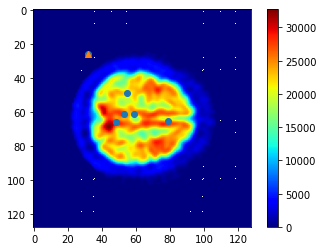

Slice nr  47
All axial cut fixations vector representation coordinate  [4122, 6210, 6845, 7089, 7613, 10177]
All axial cut fixations  [(32, 26, 150), (48, 66, 350), (53, 61, 233), (55, 49, 333), (59, 61, 383), (79, 65, 266)]
Removed point coordinates  32 26
Removed point vector representation coordinate  4122
Fixation point was removed -------------------------------- 4
Scan  296  of  365
Subject  013_S_0502
Fixation points  [(69, 16, 183), (71, 62, 200), (72, 62, 100), (74, 20, 117), (75, 6, 216), (80, 63, 100), (82, 63, 133), (83, 46, 200), (85, 23, 216), (90, 65, 133), (99, 21, 150)]
Fixation points  [8848, 9150, 9278, 9492, 9606, 10303, 10559, 10670, 10903, 11585, 12693]


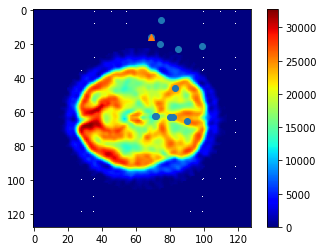

Slice nr  25
All axial cut fixations vector representation coordinate  [8848, 9150, 9278, 9492, 9606, 10303, 10559, 10670, 10903, 11585, 12693]
All axial cut fixations  [(69, 16, 183), (71, 62, 200), (72, 62, 100), (74, 20, 117), (75, 6, 216), (80, 63, 100), (82, 63, 133), (83, 46, 200), (85, 23, 216), (90, 65, 133), (99, 21, 150)]
Removed point coordinates  69 16
Removed point vector representation coordinate  8848
Fixation point was removed -------------------------------- 5
Subject  013_S_0502
Fixation points  [(71, 62, 200), (72, 62, 100), (74, 20, 117), (75, 6, 216), (80, 63, 100), (82, 63, 133), (83, 46, 200), (85, 23, 216), (90, 65, 133), (99, 21, 150)]
Fixation points  [9150, 9278, 9492, 9606, 10303, 10559, 10670, 10903, 11585, 12693]


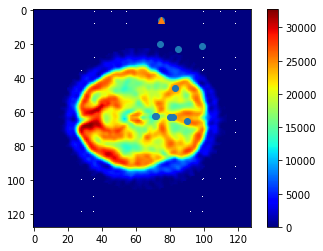

Slice nr  25
All axial cut fixations vector representation coordinate  [9150, 9278, 9492, 9606, 10303, 10559, 10670, 10903, 11585, 12693]
All axial cut fixations  [(71, 62, 200), (72, 62, 100), (74, 20, 117), (75, 6, 216), (80, 63, 100), (82, 63, 133), (83, 46, 200), (85, 23, 216), (90, 65, 133), (99, 21, 150)]
Removed point coordinates  75 6
Removed point vector representation coordinate  9606
Fixation point was removed -------------------------------- 6
Subject  013_S_0502
Fixation points  [(71, 62, 200), (72, 62, 100), (74, 20, 117), (80, 63, 100), (82, 63, 133), (83, 46, 200), (85, 23, 216), (90, 65, 133), (99, 21, 150)]
Fixation points  [9150, 9278, 9492, 10303, 10559, 10670, 10903, 11585, 12693]


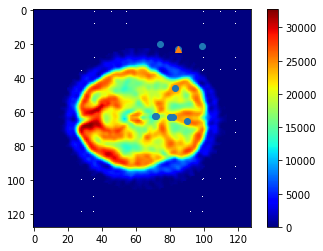

Slice nr  25
All axial cut fixations vector representation coordinate  [9150, 9278, 9492, 10303, 10559, 10670, 10903, 11585, 12693]
All axial cut fixations  [(71, 62, 200), (72, 62, 100), (74, 20, 117), (80, 63, 100), (82, 63, 133), (83, 46, 200), (85, 23, 216), (90, 65, 133), (99, 21, 150)]
Removed point coordinates  85 23
Removed point vector representation coordinate  10903
Fixation point was removed -------------------------------- 7
Subject  013_S_0502
Fixation points  [(71, 62, 200), (72, 62, 100), (74, 20, 117), (80, 63, 100), (82, 63, 133), (83, 46, 200), (90, 65, 133), (99, 21, 150)]
Fixation points  [9150, 9278, 9492, 10303, 10559, 10670, 11585, 12693]


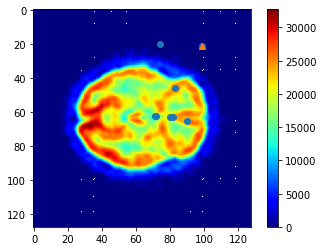

Slice nr  25
All axial cut fixations vector representation coordinate  [9150, 9278, 9492, 10303, 10559, 10670, 11585, 12693]
All axial cut fixations  [(71, 62, 200), (72, 62, 100), (74, 20, 117), (80, 63, 100), (82, 63, 133), (83, 46, 200), (90, 65, 133), (99, 21, 150)]
Removed point coordinates  99 21
Removed point vector representation coordinate  12693
Fixation point was removed -------------------------------- 8
Scan  297  of  365
Subject  016_S_0359
Fixation points  [(68, 66, 366), (75, 67, 316), (77, 52, 283), (115, 104, 300)]
Fixation points  [8770, 9667, 9908, 14824]


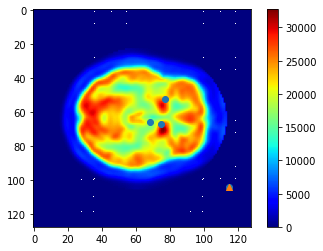

Slice nr  25
All axial cut fixations vector representation coordinate  [8770, 9667, 9908, 14824]
All axial cut fixations  [(68, 66, 366), (75, 67, 316), (77, 52, 283), (115, 104, 300)]
Removed point coordinates  115 104
Removed point vector representation coordinate  14824
Fixation point was removed -------------------------------- 9
Scan  298  of  365
Scan  299  of  365
Scan  300  of  365
Subject  021_S_0647
Fixation points  [(24, 6, 183), (48, 66, 283), (54, 48, 266), (63, 55, 200), (76, 62, 233), (78, 67, 266)]
Fixation points  [3078, 6210, 6960, 8119, 9790, 10051]


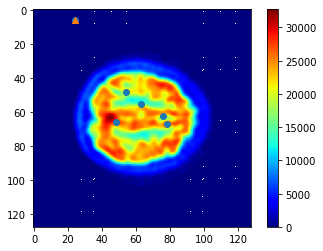

Slice nr  46
All axial cut fixations vector representation coordinate  [3078, 6210, 6960, 8119, 9790, 10051]
All axial cut fixations  [(24, 6, 183), (48, 66, 283), (54, 48, 266), (63, 55, 200), (76, 62, 233), (78, 67, 266)]
Removed point coordinates  24 6
Removed point vector representation coordinate  3078
Fixation point was removed -------------------------------- 10
Scan  301  of  365
Subject  022_S_0014
Fixation points  [(62, 65, 383), (74, 76, 167), (76, 54, 100), (79, 114, 183), (83, 66, 183), (89, 57, 283), (90, 72, 483), (96, 56, 250)]
Fixation points  [8001, 9548, 9782, 10226, 10690, 11449, 11592, 12344]


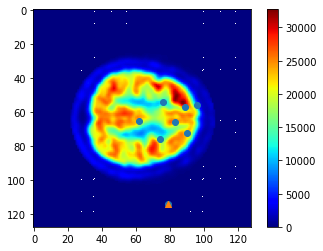

Slice nr  44
All axial cut fixations vector representation coordinate  [8001, 9548, 9782, 10226, 10690, 11449, 11592, 12344]
All axial cut fixations  [(62, 65, 383), (74, 76, 167), (76, 54, 100), (79, 114, 183), (83, 66, 183), (89, 57, 283), (90, 72, 483), (96, 56, 250)]
Removed point coordinates  79 114
Removed point vector representation coordinate  10226
Fixation point was removed -------------------------------- 11
Scan  302  of  365
Scan  303  of  365
Scan  304  of  365
Scan  305  of  365
Scan  306  of  365
Scan  307  of  365
Scan  308  of  365
Scan  309  of  365
Subject  029_S_0866
Fixation points  [(19, 50, 117), (42, 59, 283), (46, 34, 250), (49, 69, 100), (51, 51, 150), (57, 66, 633), (58, 61, 200), (64, 63, 283), (68, 35, 200), (76, 48, 233), (77, 68, 150), (84, 64, 416), (89, 63, 283), (98, 62, 283)]
Fixation points  [2482, 5435, 5922, 6341, 6579, 7362, 7485, 8255, 8739, 9776, 9924, 10816, 11455, 12606]


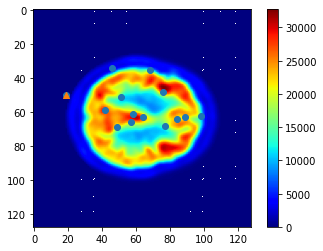

Slice nr  41
All axial cut fixations vector representation coordinate  [2482, 5435, 5922, 6341, 6579, 7362, 7485, 8255, 8739, 9776, 9924, 10816, 11455, 12606]
All axial cut fixations  [(19, 50, 117), (42, 59, 283), (46, 34, 250), (49, 69, 100), (51, 51, 150), (57, 66, 633), (58, 61, 200), (64, 63, 283), (68, 35, 200), (76, 48, 233), (77, 68, 150), (84, 64, 416), (89, 63, 283), (98, 62, 283)]
Removed point coordinates  19 50
Removed point vector representation coordinate  2482
Fixation point was removed -------------------------------- 12
Scan  310  of  365
Scan  311  of  365
Subject  033_S_0734
Fixation points  [(20, 5, 316), (45, 51, 500), (47, 79, 400), (52, 63, 600), (60, 63, 416), (71, 67, 316), (83, 62, 167)]
Fixation points  [2565, 5811, 6095, 6719, 7743, 9155, 10686]


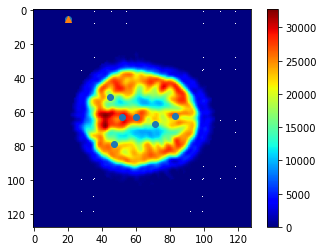

Slice nr  43
All axial cut fixations vector representation coordinate  [2565, 5811, 6095, 6719, 7743, 9155, 10686]
All axial cut fixations  [(20, 5, 316), (45, 51, 500), (47, 79, 400), (52, 63, 600), (60, 63, 416), (71, 67, 316), (83, 62, 167)]
Removed point coordinates  20 5
Removed point vector representation coordinate  2565
Fixation point was removed -------------------------------- 13
Scan  312  of  365
Scan  313  of  365
Scan  314  of  365
Subject  035_S_0555
Fixation points  [(66, 57, 416), (70, 62, 600), (70, 66, 433), (70, 69, 400), (80, 65, 550), (80, 70, 250), (81, 64, 283), (94, 88, 167)]
Fixation points  [8505, 9022, 9026, 9029, 10305, 10310, 10432, 12120]


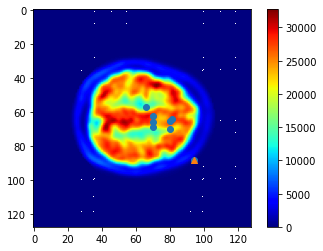

Slice nr  45
All axial cut fixations vector representation coordinate  [8505, 9022, 9026, 9029, 10305, 10310, 10432, 12120]
All axial cut fixations  [(66, 57, 416), (70, 62, 600), (70, 66, 433), (70, 69, 400), (80, 65, 550), (80, 70, 250), (81, 64, 283), (94, 88, 167)]
Removed point coordinates  94 88
Removed point vector representation coordinate  12120
Fixation point was removed -------------------------------- 14
Scan  315  of  365
Scan  316  of  365
Subject  036_S_0672
Fixation points  [(56, 54, 283), (68, 63, 416), (75, 68, 416), (76, 57, 300), (80, 64, 150), (90, 97, 266)]
Fixation points  [7222, 8767, 9668, 9785, 10304, 11617]


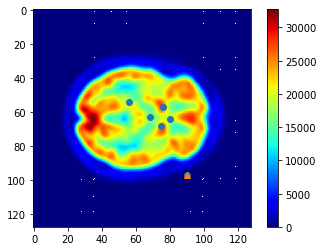

Slice nr  25
All axial cut fixations vector representation coordinate  [7222, 8767, 9668, 9785, 10304, 11617]
All axial cut fixations  [(56, 54, 283), (68, 63, 416), (75, 68, 416), (76, 57, 300), (80, 64, 150), (90, 97, 266)]
Removed point coordinates  90 97
Removed point vector representation coordinate  11617
Fixation point was removed -------------------------------- 15
Scan  317  of  365
Scan  318  of  365
Subject  037_S_0327
Fixation points  [(62, 68, 383), (65, 51, 300), (71, 75, 300), (73, 71, 500), (75, 60, 466), (76, 59, 316), (79, 63, 366), (114, 121, 183)]
Fixation points  [8004, 8371, 9163, 9415, 9660, 9787, 10175, 14713]


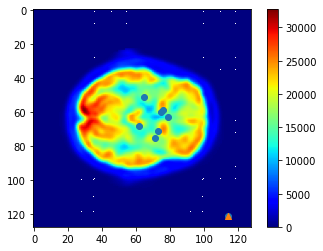

Slice nr  25
All axial cut fixations vector representation coordinate  [8004, 8371, 9163, 9415, 9660, 9787, 10175, 14713]
All axial cut fixations  [(62, 68, 383), (65, 51, 300), (71, 75, 300), (73, 71, 500), (75, 60, 466), (76, 59, 316), (79, 63, 366), (114, 121, 183)]
Removed point coordinates  114 121
Removed point vector representation coordinate  14713
Fixation point was removed -------------------------------- 16
Subject  037_S_0327
Fixation points  [(25, 7, 200), (57, 49, 366), (58, 60, 316), (80, 66, 283)]
Fixation points  [3207, 7345, 7484, 10306]


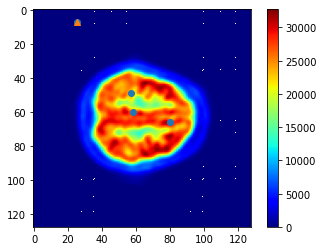

Slice nr  46
All axial cut fixations vector representation coordinate  [3207, 7345, 7484, 10306]
All axial cut fixations  [(25, 7, 200), (57, 49, 366), (58, 60, 316), (80, 66, 283)]
Removed point coordinates  25 7
Removed point vector representation coordinate  3207
Fixation point was removed -------------------------------- 17
Scan  319  of  365
Scan  320  of  365
Scan  321  of  365
Scan  322  of  365
Scan  323  of  365
Scan  324  of  365
Scan  325  of  365
Scan  326  of  365
Subject  073_S_0311
Fixation points  [(74, 74, 416), (88, 77, 183), (89, 54, 200), (93, 61, 233), (109, 106, 316)]
Fixation points  [9546, 11341, 11446, 11965, 14058]


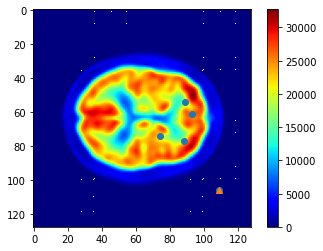

Slice nr  34
All axial cut fixations vector representation coordinate  [9546, 11341, 11446, 11965, 14058]
All axial cut fixations  [(74, 74, 416), (88, 77, 183), (89, 54, 200), (93, 61, 233), (109, 106, 316)]
Removed point coordinates  109 106
Removed point vector representation coordinate  14058
Fixation point was removed -------------------------------- 18
Scan  327  of  365
Scan  328  of  365
Scan  329  of  365
Scan  330  of  365
Scan  331  of  365
Subject  099_S_0533
Fixation points  [(66, 66, 466), (81, 60, 400), (82, 59, 316), (103, 120, 100)]
Fixation points  [8514, 10428, 10555, 13304]


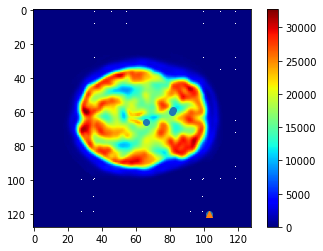

Slice nr  25
All axial cut fixations vector representation coordinate  [8514, 10428, 10555, 13304]
All axial cut fixations  [(66, 66, 466), (81, 60, 400), (82, 59, 316), (103, 120, 100)]
Removed point coordinates  103 120
Removed point vector representation coordinate  13304
Fixation point was removed -------------------------------- 19
Subject  099_S_0533
Fixation points  [(49, 11, 283), (59, 77, 300), (61, 65, 350), (67, 70, 283), (68, 60, 333), (71, 58, 516), (75, 58, 316), (86, 70, 400), (94, 61, 366)]
Fixation points  [6283, 7629, 7873, 8646, 8764, 9146, 9658, 11078, 12093]


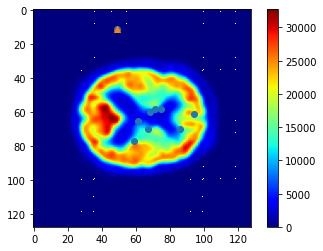

Slice nr  35
All axial cut fixations vector representation coordinate  [6283, 7629, 7873, 8646, 8764, 9146, 9658, 11078, 12093]
All axial cut fixations  [(49, 11, 283), (59, 77, 300), (61, 65, 350), (67, 70, 283), (68, 60, 333), (71, 58, 516), (75, 58, 316), (86, 70, 400), (94, 61, 366)]
Removed point coordinates  49 11
Removed point vector representation coordinate  6283
Fixation point was removed -------------------------------- 20
Scan  332  of  365
Scan  333  of  365
Scan  334  of  365
Scan  335  of  365
Scan  336  of  365
Scan  337  of  365
Subject  116_S_0648
Fixation points  [(32, 26, 150), (48, 66, 350), (53, 61, 233), (55, 49, 333), (59, 61, 383), (79, 65, 266)]
Fixation points  [4122, 6210, 6845, 7089, 7613, 10177]


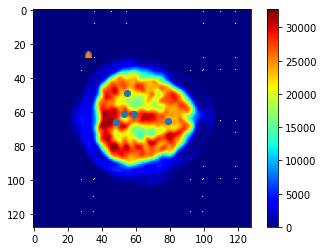

Slice nr  47
All axial cut fixations vector representation coordinate  [4122, 6210, 6845, 7089, 7613, 10177]
All axial cut fixations  [(32, 26, 150), (48, 66, 350), (53, 61, 233), (55, 49, 333), (59, 61, 383), (79, 65, 266)]
Removed point coordinates  32 26
Removed point vector representation coordinate  4122
Fixation point was removed -------------------------------- 21
Scan  338  of  365
Scan  339  of  365
Scan  340  of  365
Scan  341  of  365
Scan  342  of  365
Scan  343  of  365
Scan  344  of  365
Scan  345  of  365
Scan  346  of  365
Scan  347  of  365
Scan  348  of  365
Scan  349  of  365
Scan  350  of  365
Scan  351  of  365
Scan  352  of  365
Scan  353  of  365
Scan  354  of  365
Scan  355  of  365
Scan  356  of  365
Scan  357  of  365
Scan  358  of  365
Scan  359  of  365
Scan  360  of  365
Scan  361  of  365
Scan  362  of  365
Scan  363  of  365
Scan  364  of  365
Total fixation points removed:  22  -----------------------


In [ ]:
removed_points = remove_outlier_fixations(nc_allData, 1500)

In [ ]:
#readd_points(nc_allData, removed_points, [])

In [ ]:
print_all_individual_slices_with_fixation_points(nc_allData)

Subject  013_S_0502
Fixation points  [(71, 62, 200), (72, 62, 100), (74, 20, 117), (80, 63, 100), (82, 63, 133), (83, 46, 200), (90, 65, 133)]
Fixation points  [9150, 9278, 9492, 10303, 10559, 10670, 11585]


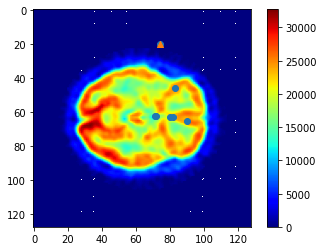

Point Removed ------
Slice nr  25
All axial cut fixations vector representation coordinate  [9150, 9278, 10303, 10559, 10670, 11585]
All axial cut fixations  [(71, 62, 200), (72, 62, 100), (80, 63, 100), (82, 63, 133), (83, 46, 200), (90, 65, 133)]
Removed point coordinates  74 20
Removed point vector representation coordinate  9492
---------------
Subject  020_S_0883
Fixation points  [(55, 25, 300), (63, 57, 316), (79, 59, 283)]
Fixation points  [7065, 8121, 10171]


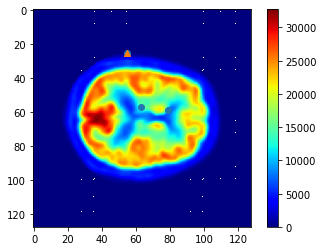

Point Removed ------
Slice nr  34
All axial cut fixations vector representation coordinate  [8121, 10171]
All axial cut fixations  [(63, 57, 316), (79, 59, 283)]
Removed point coordinates  55 25
Removed point vector representation coordinate  7065
---------------
Subject  027_S_0074
Fixation points  [(44, 66, 250), (58, 74, 516), (58, 76, 333), (68, 26, 283), (68, 60, 450), (69, 52, 200), (72, 65, 350), (74, 65, 416), (82, 60, 283), (87, 64, 266), (93, 61, 350)]
Fixation points  [5698, 7498, 7500, 8730, 8764, 8884, 9281, 9537, 10556, 11200, 11965]


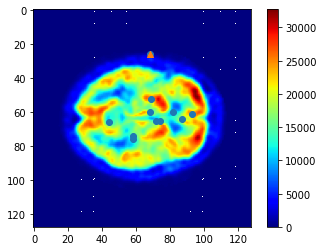

Point Removed ------
Slice nr  27
All axial cut fixations vector representation coordinate  [5698, 7498, 7500, 8764, 8884, 9281, 9537, 10556, 11200, 11965]
All axial cut fixations  [(44, 66, 250), (58, 74, 516), (58, 76, 333), (68, 60, 450), (69, 52, 200), (72, 65, 350), (74, 65, 416), (82, 60, 283), (87, 64, 266), (93, 61, 350)]
Removed point coordinates  68 26
Removed point vector representation coordinate  8730
---------------
Subject  027_S_0120
Fixation points  [(61, 59, 383), (73, 57, 183), (80, 57, 300), (84, 68, 233), (85, 98, 266), (93, 56, 333)]
Fixation points  [7867, 9401, 10297, 10820, 10978, 11960]


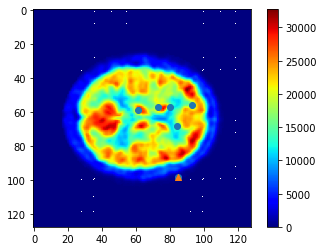

Point Removed ------
Slice nr  34
All axial cut fixations vector representation coordinate  [7867, 9401, 10297, 10820, 11960]
All axial cut fixations  [(61, 59, 383), (73, 57, 183), (80, 57, 300), (84, 68, 233), (93, 56, 333)]
Removed point coordinates  85 98
Removed point vector representation coordinate  10978
---------------
Subject  109_S_0967
Fixation points  [(49, 55, 250), (53, 66, 200), (67, 67, 133), (70, 104, 200), (74, 87, 167), (77, 67, 216)]
Fixation points  [6327, 6850, 8643, 9064, 9559, 9923]


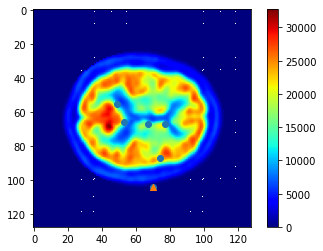

Point Removed ------
Slice nr  34
All axial cut fixations vector representation coordinate  [6327, 6850, 8643, 9559, 9923]
All axial cut fixations  [(49, 55, 250), (53, 66, 200), (67, 67, 133), (74, 87, 167), (77, 67, 216)]
Removed point coordinates  70 104
Removed point vector representation coordinate  9064
---------------


In [ ]:
remove_point(nc_allData, 296, 25, 74, 20)
remove_point(nc_allData, 299, 34, 55, 25)
remove_point(nc_allData, 306, 27, 68, 26)
remove_point(nc_allData, 307, 34, 85, 98)
remove_point(nc_allData, 334, 34, 70, 104)

#### Plot Examples of overlapped fixations again

Subject  007_S_0293


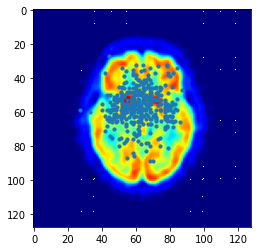

In [ ]:
show_one_scan_with_all_scans_fixations_ontop(mci_allData, 25, 6)

Subject  009_S_0842


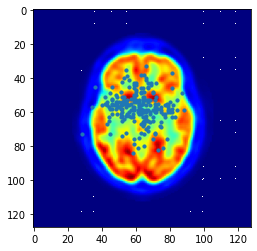

In [ ]:
show_one_scan_with_all_scans_fixations_ontop(nc_allData, 25, 6)

Subject  006_S_0653


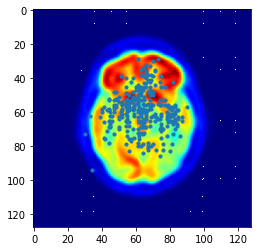

In [ ]:
show_one_scan_with_all_scans_fixations_ontop(ad_allData, 25, 6)

Subject  009_S_0842


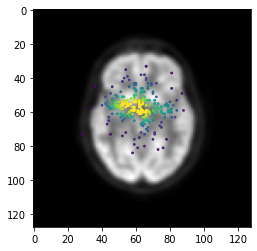

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_density(nc_allData, 25, 6)

Subject  006_S_0653


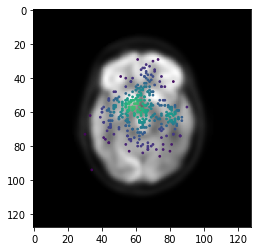

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_density(ad_allData, 25, 6)

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_density(mci_allData, 25, 6)

Subject  009_S_0842
<class 'numpy.ndarray'>
(1000, 1000)


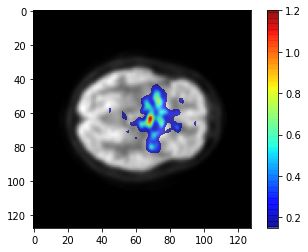

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations_heatmap(nc_allData, 25, 6)

Subject  006_S_0653
<class 'numpy.ndarray'>
(1000, 1000)


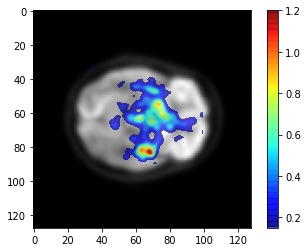

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations_heatmap(ad_allData, 25, 6)

Subject  007_S_0293
<class 'numpy.ndarray'>
(1000, 1000)


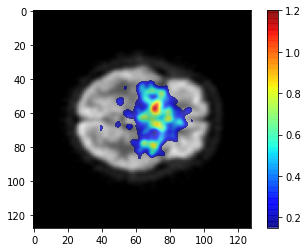

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations_heatmap(mci_allData, 25, 6)

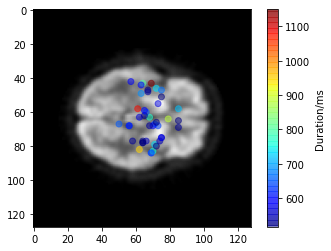

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations(mci_allData, 25, 6)

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations(ad_allData, 25, 6)

In [ ]:
show_one_scan_with_all_scans_fixations_ontop_durations(nc_allData, 25, 6)

# Store Data in Google Drive

store the entire dataframe in pickle format

In [ ]:
nc_allData.to_pickle("/content/drive/My Drive/dataset/pandas_dataframes/nc_allData.pkl")
mci_allData.to_pickle("/content/drive/My Drive/dataset/pandas_dataframes/mci_allData.pkl")
ad_allData.to_pickle("/content/drive/My Drive/dataset/pandas_dataframes/ad_allData.pkl")

store each scan in a separated numpy file for each class

In [ ]:
for id in range(0, len(nc_allData)):
  np.save("/content/drive/My Drive/dataset/PETs_numpy/not_normalized/"+str(nc_allData.at[id, 'Scan ID'])+ '.npy', np.array(nc_allData.at[id, 'Scan']))

for id in range(0, len(ad_allData)):
  np.save("/content/drive/My Drive/dataset/PETs_numpy/not_normalized/"+str(ad_allData.at[id, 'Scan ID'])+ '.npy', np.array(ad_allData.at[id, 'Scan']))

for id in range(0, len(mci_allData)):
  np.save("/content/drive/My Drive/dataset/PETs_numpy/not_normalized/"+str(mci_allData.at[id, 'Scan ID'])+ '.npy', np.array(mci_allData.at[id, 'Scan']))

store the labels of each scan

In [ ]:
# create a dictionary (key - scan ID; item - class)
dict_nc = nc_allData[['Class', 'Scan ID']].set_index('Scan ID').to_dict()
dict_ad = ad_allData[['Class', 'Scan ID']].set_index('Scan ID').to_dict()
dict_mci = mci_allData[['Class', 'Scan ID']].set_index('Scan ID').to_dict()

# merge dictionaries for the different classes
dict_nc['Class'].update(dict_ad['Class'])
dict_nc['Class'].update(dict_mci['Class'])

np.save("/content/drive/My Drive/dataset/PETs_numpy/Labels/labels.npy", dict_nc['Class'])

store the id of each subject

In [ ]:
# create a dictionary (key - scan ID; item - subject ID)
dict_nc = nc_allData[['Subject ID', 'Scan ID']].set_index('Scan ID').to_dict()
dict_ad = ad_allData[['Subject ID', 'Scan ID']].set_index('Scan ID').to_dict()
dict_mci = mci_allData[['Subject ID', 'Scan ID']].set_index('Scan ID').to_dict()

# merge dictionaries for the different classes
dict_nc['Subject ID'].update(dict_ad['Subject ID'])
dict_nc['Subject ID'].update(dict_mci['Subject ID'])

np.save("/content/drive/My Drive/dataset/PETs_numpy/Subject_id/subject_id.npy", dict_nc['Subject ID'])

store if the scans has fixations or not

In [ ]:
# create a dictionary (key - scan ID; item - Has fix)
dict_nc = nc_allData[['Has Fix', 'Scan ID']].set_index('Scan ID').to_dict()
dict_ad = ad_allData[['Has Fix', 'Scan ID']].set_index('Scan ID').to_dict()
dict_mci = mci_allData[['Has Fix', 'Scan ID']].set_index('Scan ID').to_dict()

# merge dictionaries for the different classes
dict_nc['Has Fix'].update(dict_ad['Has Fix'])
dict_nc['Has Fix'].update(dict_mci['Has Fix'])

np.save("/content/drive/My Drive/dataset/PETs_numpy/has_fixations/has_fixations.npy", dict_nc['Has Fix'])

Print all the scans ID of each patient

In [ ]:
dict_nc = np.load("/content/drive/My Drive/dataset/PETs_numpy/Subject_id/subject_id.npy", allow_pickle=True)
dict_nc = dict_nc.item()

import collections

flipped = {}
  
for key, value in dict_nc.items():
    if value not in flipped:
        flipped[value] = [key]
    else:
        flipped[value].append(key)
  
# printing result
print("final_dictionary", str(flipped))

final_dictionary {'005_S_0223': [0, 102, 196, 340], '005_S_0610': [1, 103, 197, 281], '006_S_0484': [2, 104], '006_S_0498': [3, 105, 198, 282], '006_S_0731': [4, 106, 199, 341], '009_S_0751': [5, 107, 200, 283], '009_S_0842': [6, 108, 201, 284], '009_S_0862': [7, 109, 202, 285], '010_S_0067': [8, 110, 203, 286], '010_S_0419': [9, 111, 204, 287], '010_S_0420': [10, 112, 205, 288], '011_S_0002': [11, 114], '011_S_0005': [12, 115, 207, 290], '011_S_0008': [13, 116, 208], '011_S_0016': [14, 117, 209, 291], '011_S_0021': [15, 118, 210, 292], '011_S_0023': [16, 119, 211, 293], '012_S_0637': [17, 120, 212, 294], '012_S_1133': [18, 121, 213, 295], '013_S_0502': [19, 122, 214, 296], '013_S_0575': [20, 123], '016_S_0359': [21, 124, 215, 297], '018_S_0043': [22, 125, 298], '018_S_0055': [23, 126, 216], '020_S_0097': [24, 127, 217, 342], '020_S_0883': [25, 218, 299], '021_S_0647': [26, 128, 219, 300], '022_S_0014': [27, 129, 301], '022_S_0096': [28, 131, 221, 303], '022_S_0130': [29, 132, 222, 304

# Normalize scans dividing by max

In [ ]:
def show_scan_plot(scan, slice_nr):
  one_slice_2d = scan[:,:,slice_nr] # array with one slice of a single patient
  plt.imshow(one_slice_2d, cmap='jet')
  plt.colorbar()
  plt.show()

In [ ]:
for ID in range(1393):
  scan_original = np.load(root_path + '/PETs_numpy/not_normalized/' + str(ID) + '.npy')

  new_scan = scan_original / np.amax(scan_original)

  # for slice_nr in range(60):
  #   mask = create_circular_mask(128, 128, a=elipse_values[slice_nr][0], 
  #                           b=elipse_values[slice_nr][1], radius=elipse_values[slice_nr][2])
  #   new_scan[:,:,slice_nr] = mask*new_scan[:,:,slice_nr]

  np.save(root_path + '/PETs_numpy/normalized/'+str(ID) + '.npy', new_scan)

check if ok

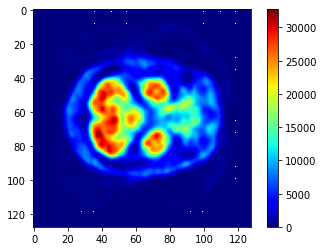

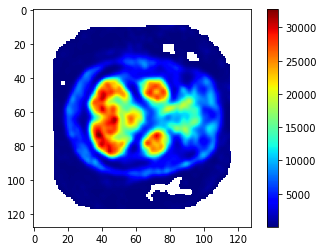

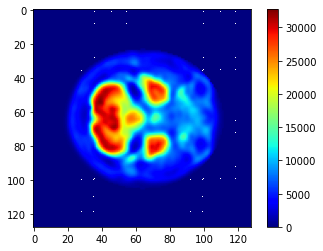

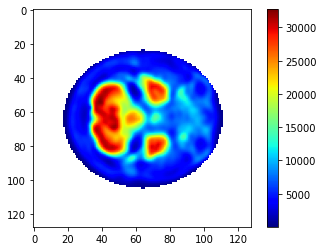

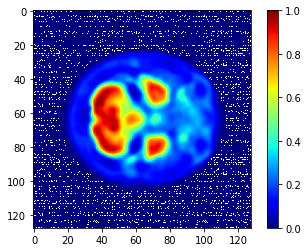

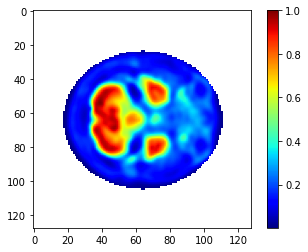

In [ ]:
ID = 210

scan_original = np.load('/content/drive/My Drive/dataset/PETs_numpy/original/'+str(ID)+'.npy', allow_pickle='TRUE')
show_scan_plot(scan_original, 12)

new_scan = scan_original[:,:,12].copy()
masked_array = np.ma.masked_where(new_scan == 0, new_scan)
cmap = plt.cm.get_cmap('jet') # Can be any colormap that you want after the cm
cmap.set_bad(color='white')
plt.imshow(masked_array, cmap=cmap)
plt.colorbar()
plt.show()


scan_not_normalized = np.load('/content/drive/My Drive/dataset/PETs_numpy/not_normalized/'+str(ID)+'.npy', allow_pickle='TRUE')
show_scan_plot(scan_not_normalized, 12)

new_scan = scan_not_normalized[:,:,12].copy()
masked_array = np.ma.masked_where(new_scan == 0, new_scan)
cmap = plt.cm.get_cmap('jet') # Can be any colormap that you want after the cm
cmap.set_bad(color='white')
plt.imshow(masked_array, cmap=cmap)
plt.colorbar()
plt.show()

scan_normalized = np.load('/content/drive/My Drive/dataset/PETs_numpy/normalized/'+str(ID)+'.npy', allow_pickle='TRUE')
show_scan_plot(scan_normalized, 12)

new_scan = scan_normalized[:,:,12].copy()
masked_array = np.ma.masked_where(new_scan == 0, new_scan)
cmap = plt.cm.get_cmap('jet') # Can be any colormap that you want after the cm
cmap.set_bad(color='white')
plt.imshow(masked_array, cmap=cmap)
plt.colorbar()
plt.show()

# Data augmentation

Augmented number of scans by flipping

In [ ]:
import tensorflow as tf

labels_daugmentation = {}
subject_id_daugmentation = {}

for ID in range(1393):
  print(ID, ID+1393)

  # read scan
  scan_orig = np.zeros((128,128,64,1))
  real_scan_flipped = np.zeros((128,128,64,1))
  scan_orig[:,:,:,0] = np.load(root_path + '/PETs_numpy/normalized_with_64axial_slices/' + str(ID) + '.npy')

  # flip scan
  scan_flipped = np.zeros((128,128,64,1))
  for slice_nr in range(64):
    scan_flipped[:,:,slice_nr,:] = tf.image.flip_left_right(scan_orig[:,:,slice_nr,:])
    real_scan_flipped[:,:,slice_nr] = scan_flipped[:,:,63-slice_nr]
    # if slice_nr == 25:
    #   print('Original')
    #   plt.imshow(scan_orig[:,:,slice_nr,0], cmap='jet')
    #   plt.show()
    #   print('Flipped')
    #   plt.imshow(scan_flipped[:,:,slice_nr,0], cmap='jet')
    #   plt.show()

  # add class do dictionary
  labels = np.load(root_path + '/PETs_numpy/Labels/labels.npy', allow_pickle='TRUE')
  labels = labels.item()
  labels_daugmentation[ID] = labels[ID]
  labels_daugmentation[1393+ID] = labels[ID]

  # add subject id to dictionary
  subject_id = np.load(root_path + '/PETs_numpy/Subject_id/subject_id.npy', allow_pickle='TRUE')
  subject_id = subject_id.item() # it is a dictionary
  subject_id_daugmentation[ID] = subject_id[ID]
  subject_id_daugmentation[1393+ID] = subject_id[ID]

  # save both scans new folder
  np.save("/content/drive/My Drive/dataset/PETs_numpy_data_augmentation/normalized_with_64axial_slices/"+str(ID) + '.npy', scan_orig[:,:,:,0])
  np.save("/content/drive/My Drive/dataset/PETs_numpy_data_augmentation/normalized_with_64axial_slices/"+str(1393+ID) + '.npy', real_scan_flipped[:,:,:,0])

# save labels and subject id
np.save("/content/drive/My Drive/dataset/PETs_numpy_data_augmentation/Labels/labels.npy", labels_daugmentation)
np.save("/content/drive/My Drive/dataset/PETs_numpy_data_augmentation/Subject_id/subject_id.npy", subject_id_daugmentation)

0 1393
1 1394
2 1395
3 1396
4 1397
5 1398
6 1399
7 1400
8 1401
9 1402
10 1403
11 1404
12 1405
13 1406
14 1407
15 1408
16 1409
17 1410
18 1411
19 1412
20 1413
21 1414
22 1415
23 1416
24 1417
25 1418
26 1419
27 1420
28 1421
29 1422
30 1423
31 1424
32 1425
33 1426
34 1427
35 1428
36 1429
37 1430
38 1431
39 1432
40 1433
41 1434
42 1435
43 1436
44 1437
45 1438
46 1439
47 1440
48 1441
49 1442
50 1443
51 1444
52 1445
53 1446
54 1447
55 1448
56 1449
57 1450
58 1451
59 1452
60 1453
61 1454
62 1455
63 1456
64 1457
65 1458
66 1459
67 1460
68 1461
69 1462
70 1463
71 1464
72 1465
73 1466
74 1467
75 1468
76 1469
77 1470
78 1471
79 1472
80 1473
81 1474
82 1475
83 1476
84 1477
85 1478
86 1479
87 1480
88 1481
89 1482
90 1483
91 1484
92 1485
93 1486
94 1487
95 1488
96 1489
97 1490
98 1491
99 1492
100 1493
101 1494
102 1495
103 1496
104 1497
105 1498
106 1499
107 1500
108 1501
109 1502
110 1503
111 1504
112 1505
113 1506
114 1507
115 1508
116 1509
117 1510
118 1511
119 1512
120 1513
121 1514
122 1515
123

In [ ]:
nc_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/nc_allData.pkl")
mci_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/mci_allData.pkl")
ad_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/ad_allData.pkl")

In [ ]:
import tensorflow as tf
import os.path
from os import path

has_fixations = {}

for ID in range(len(nc_allData)):
  scan_id = nc_allData.at[ID, 'Scan ID']
  print(scan_id)
  has_fixations[scan_id] = nc_allData.at[ID, 'Has Fix']
  has_fixations[scan_id+1393] = nc_allData.at[ID, 'Has Fix']

for ID in range(len(ad_allData)):
  scan_id = ad_allData.at[ID, 'Scan ID']
  print(scan_id)
  has_fixations[scan_id] = ad_allData.at[ID, 'Has Fix']
  has_fixations[scan_id+1393] = ad_allData.at[ID, 'Has Fix']

for ID in range(len(mci_allData)):
  scan_id = mci_allData.at[ID, 'Scan ID']
  print(scan_id)
  has_fixations[scan_id] = mci_allData.at[ID, 'Has Fix']
  has_fixations[scan_id+1393] = mci_allData.at[ID, 'Has Fix']

np.save("/content/drive/My Drive/dataset/PETs_numpy_data_augmentation/has_fixations/has_fixations.npy", has_fixations)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

Augmented number of attention maps by flipping

In [ ]:
import tensorflow as tf
import os.path
from os import path

labels_daugmentation = {}
subject_id_daugmentation = {}

for ID in range(1393):

  if os.path.exists(root_path + '/attention_maps/Duration_based_64/' + str(ID) + '.npy'):
    print(ID)
    # read scan
    scan_orig = np.zeros((128,128,64,1))
    real_scan_flipped = np.zeros((128,128,64,1))
    scan_orig[:,:,:,0] = np.load(root_path + '/attention_maps/Duration_based_64/' + str(ID) + '.npy')

    # flip scan
    scan_flipped = np.zeros((128,128,64,1))
    for slice_nr in range(64):
      scan_flipped[:,:,slice_nr,:] = tf.image.flip_left_right(scan_orig[:,:,slice_nr,:])
      real_scan_flipped[:,:,slice_nr] = scan_flipped[:,:,63-slice_nr]

    # save both scans new folder
    np.save("/content/drive/My Drive/dataset/attention_maps_data_augmentation/Duration_based_64/"+str(ID) + '.npy', scan_orig[:,:,:,0])
    np.save("/content/drive/My Drive/dataset/attention_maps_data_augmentation/Duration_based_64/"+str(1393+ID) + '.npy', real_scan_flipped[:,:,:,0])

281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
620
621
622
623
624
625
626
627
628
629
630
631
632
633
634
635
636
637
638
639
640
641
642
643
644
645
646
647
648
649
650
651
652
653
654
655
656
657
658
659
660
661
662
663
664
665
666
667
668
669
670
671
672
673
674
675
676
677
678
1251
1252
1253
1254
1255
1256
1257
1258
1259
1260
1261
1262
1263
1264
1265
1266
1267
1268
1269
1270
1271
1272
1273
1274
1275
1276
1277
1278
1279
1280
1281
1282
1283
1284
1285
1286
1287
1288
1289
1290
1291
1292
1293
1294
1295
1296
1297
1298
1299
1300
1301
1302
1303
1304
1305
1306
1307
1308
1309


# Segmentation scans

In [ ]:
def show_scan_plot(scan, slice_nr):
  one_slice_2d = scan[:,:,slice_nr] # array with one slice of a single patient
  plt.imshow(one_slice_2d, cmap='jet')
  plt.colorbar()
  plt.show()

Add 4 empty axial slices and rotate 90 degrees

(60, 128, 128)
slice_nr  0


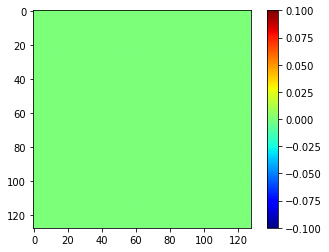

slice_nr  1


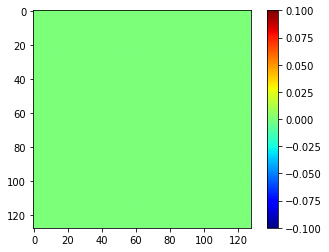

slice_nr  2


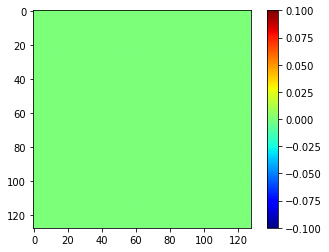

slice_nr  3


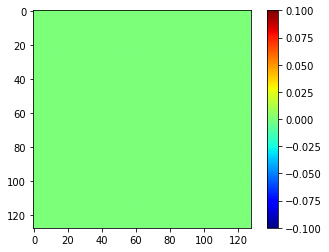

slice_nr  4


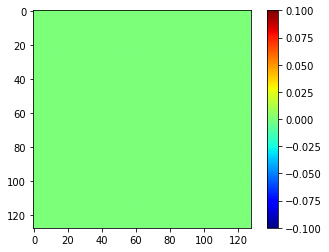

slice_nr  5


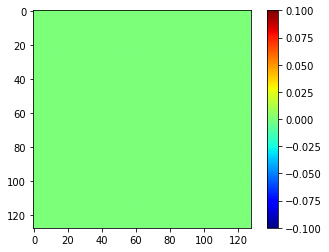

slice_nr  6


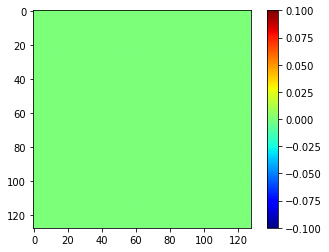

slice_nr  7


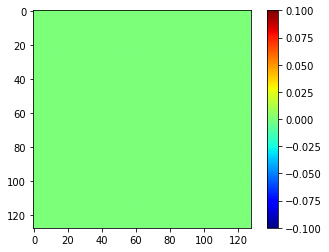

slice_nr  8


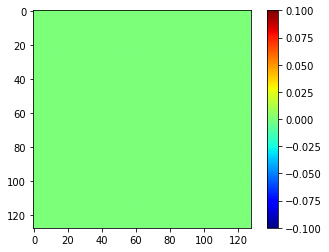

slice_nr  9


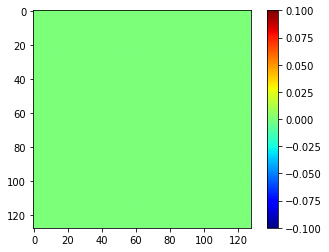

slice_nr  10


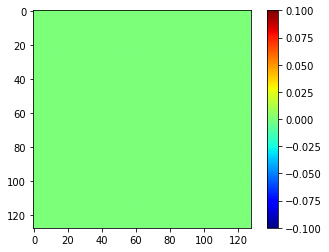

slice_nr  11


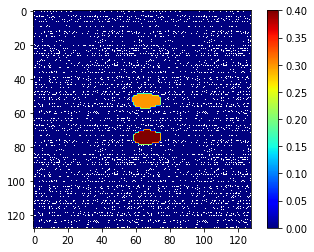

slice_nr  12


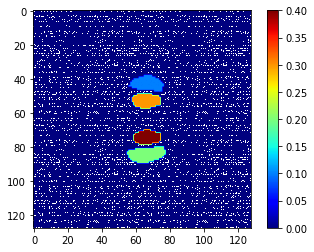

slice_nr  13


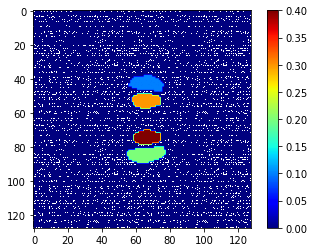

slice_nr  14


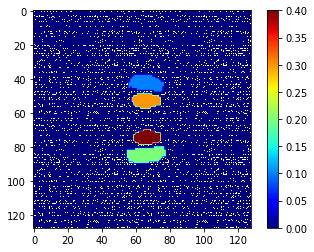

slice_nr  15


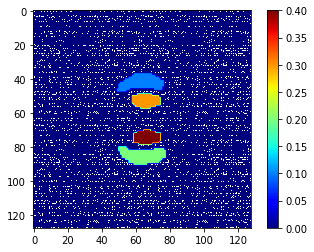

slice_nr  16


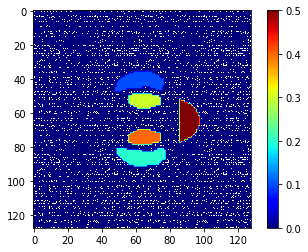

slice_nr  17


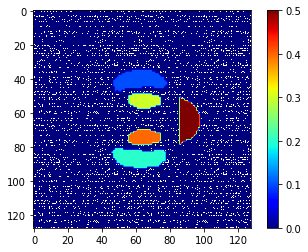

slice_nr  18


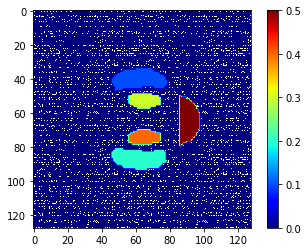

slice_nr  19


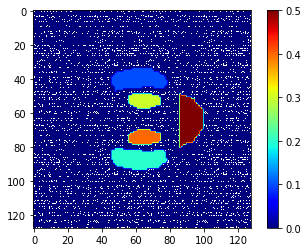

slice_nr  20


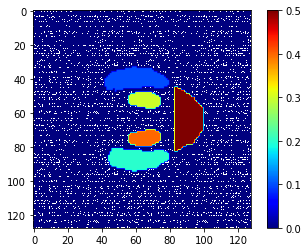

slice_nr  21


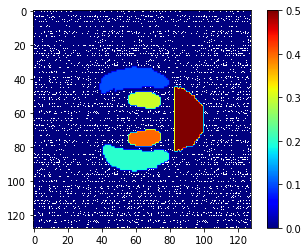

slice_nr  22


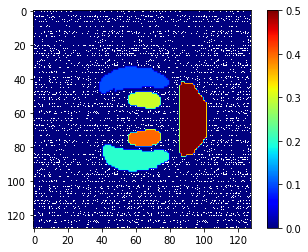

slice_nr  23


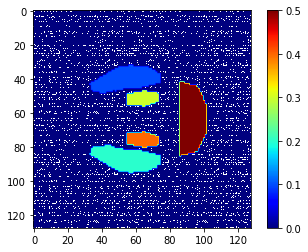

slice_nr  24


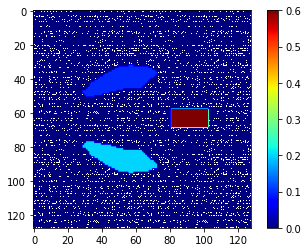

slice_nr  25


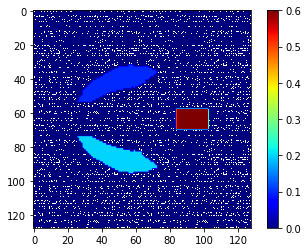

slice_nr  26


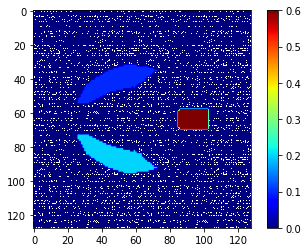

slice_nr  27


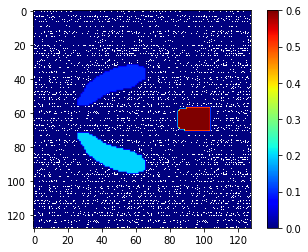

slice_nr  28


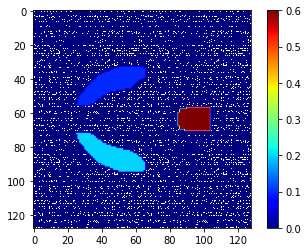

slice_nr  29


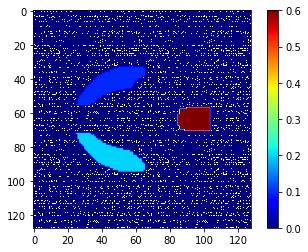

slice_nr  30


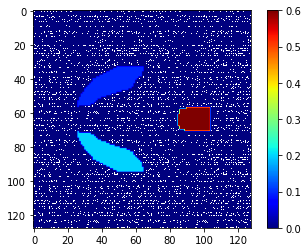

slice_nr  31


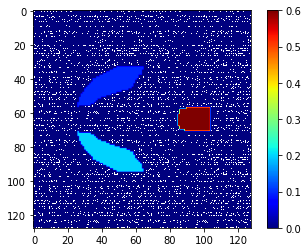

slice_nr  32


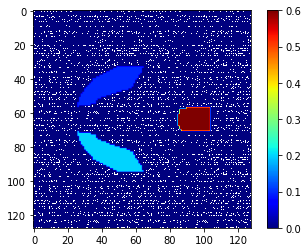

slice_nr  33


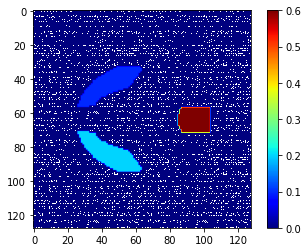

slice_nr  34


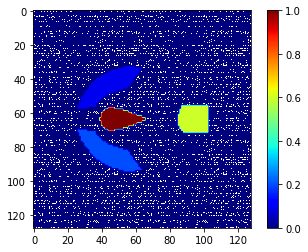

slice_nr  35


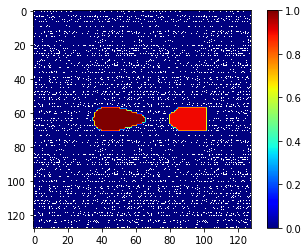

slice_nr  36


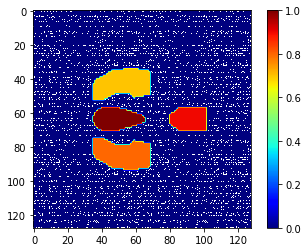

slice_nr  37


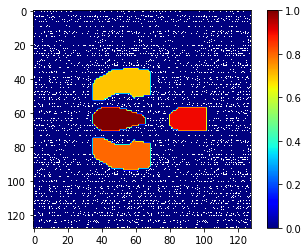

slice_nr  38


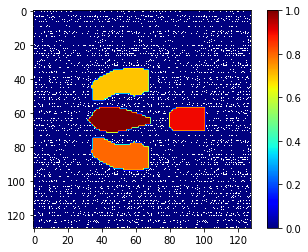

slice_nr  39


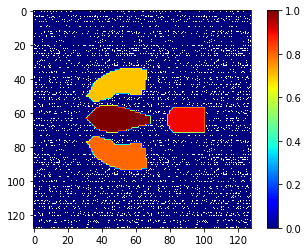

slice_nr  40


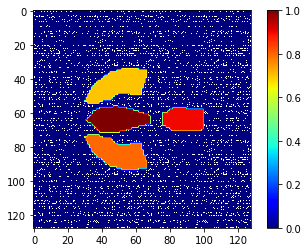

slice_nr  41


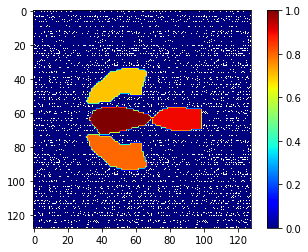

slice_nr  42


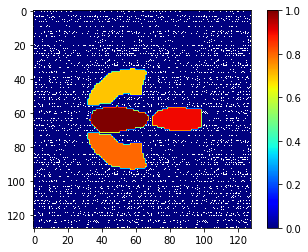

slice_nr  43


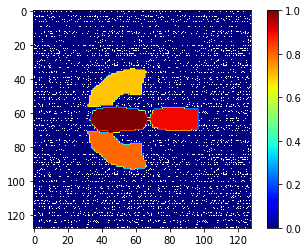

slice_nr  44


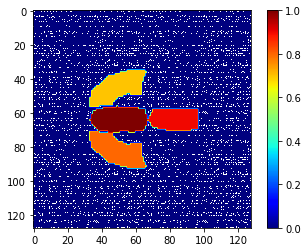

slice_nr  45


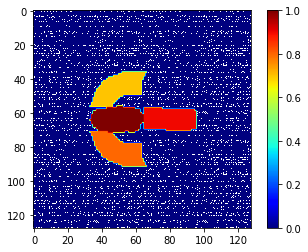

slice_nr  46


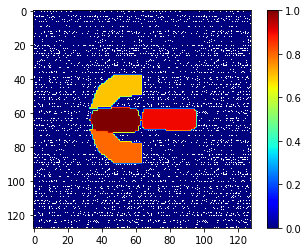

slice_nr  47


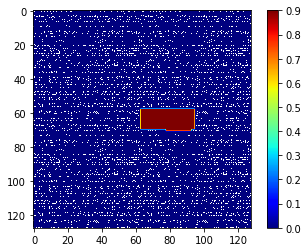

slice_nr  48


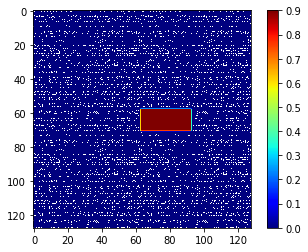

slice_nr  49


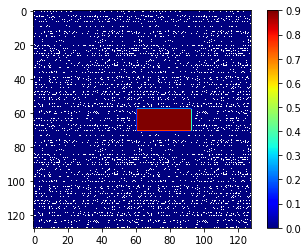

slice_nr  50


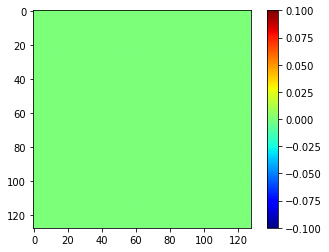

slice_nr  51


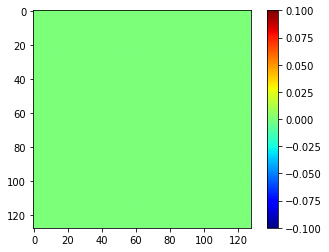

slice_nr  52


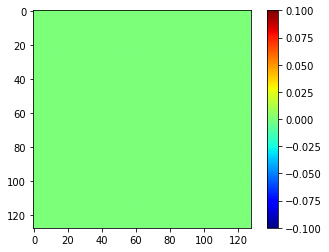

slice_nr  53


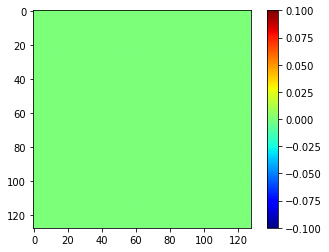

slice_nr  54


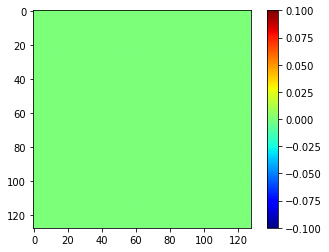

slice_nr  55


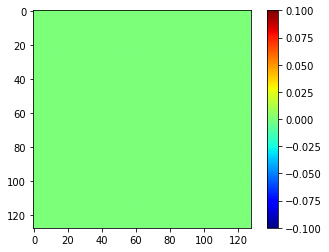

slice_nr  56


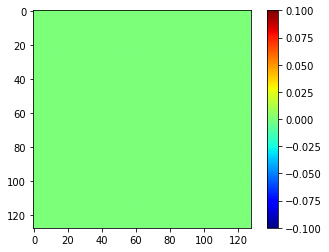

slice_nr  57


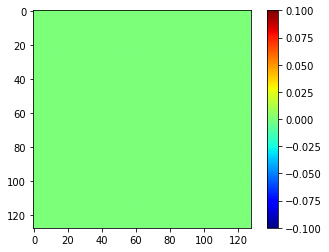

slice_nr  58


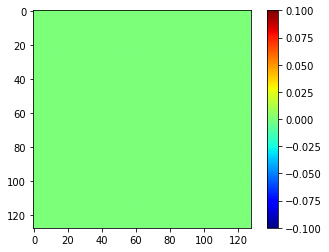

slice_nr  59


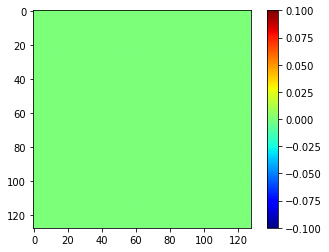

slice_nr  60


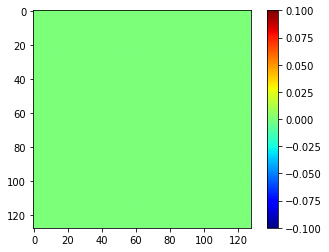

slice_nr  61


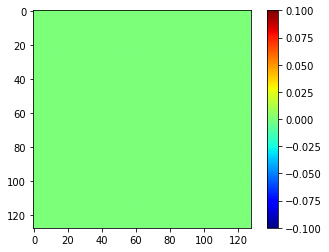

slice_nr  62


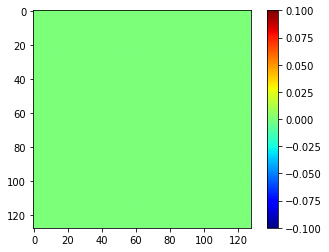

slice_nr  63


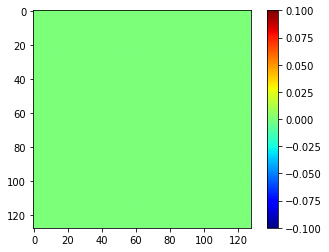

In [ ]:
x = np.zeros((128,128,64))
temp = np.load(root_path + '/ROI/ROIs_DrDurval_Modified_professora.npy', allow_pickle='TRUE')
print(temp.shape)

x[:,:,0:60] = np.transpose(temp, (1, 2, 0))
x = x / np.amax(x)

for i in range(64):
  print("slice_nr ", i)
  show_scan_plot(x, i)
  plt.show()

np.save(root_path + '/ROI/ROIs_normalized_with_64axial_slices.npy', x)

Create ROI with just 0 and 1

slice_nr  0


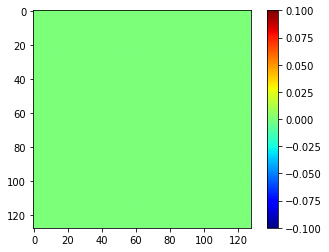

slice_nr  1


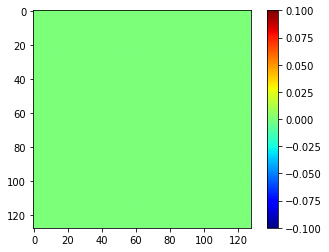

slice_nr  2


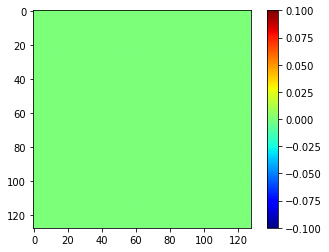

slice_nr  3


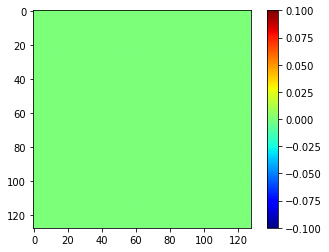

slice_nr  4


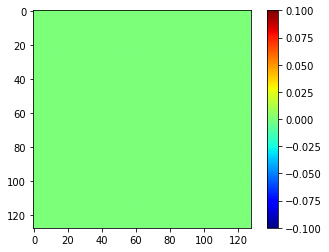

slice_nr  5


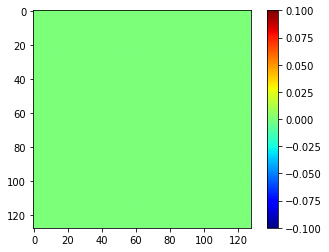

slice_nr  6


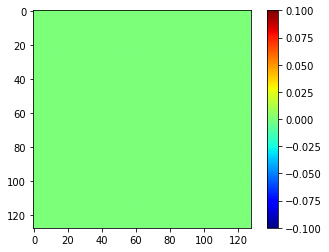

slice_nr  7


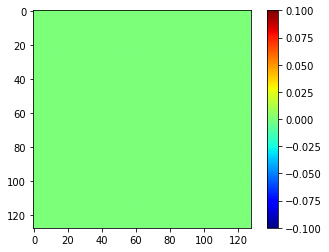

slice_nr  8


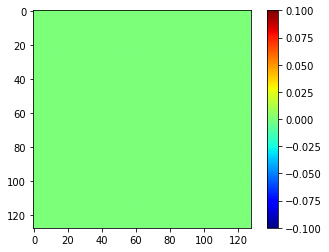

slice_nr  9


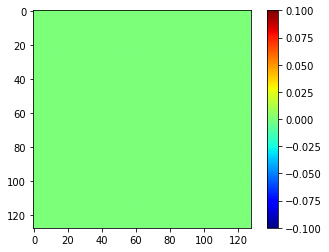

slice_nr  10


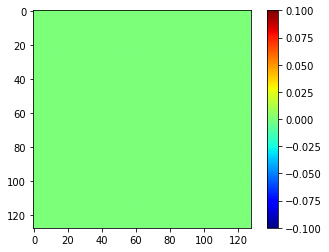

slice_nr  11


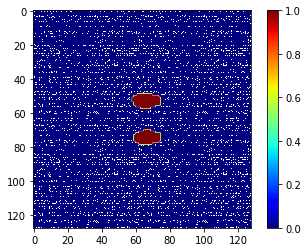

slice_nr  12


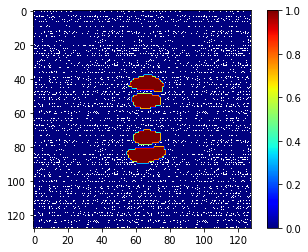

slice_nr  13


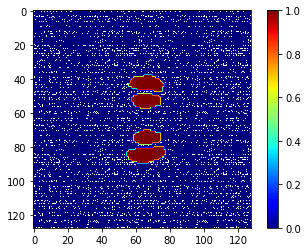

slice_nr  14


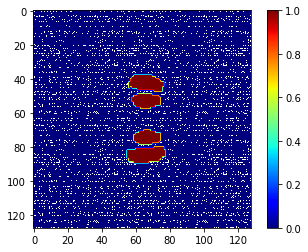

slice_nr  15


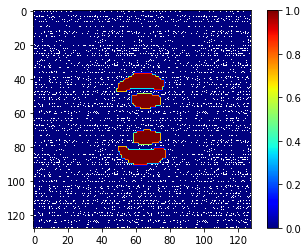

slice_nr  16


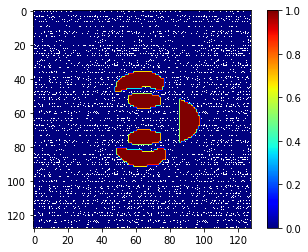

slice_nr  17


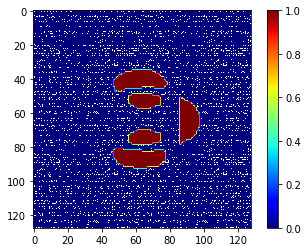

slice_nr  18


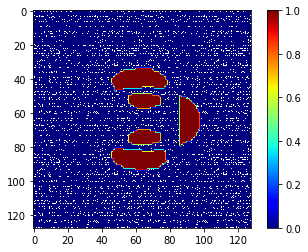

slice_nr  19


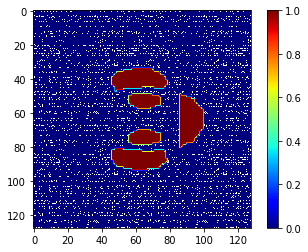

slice_nr  20


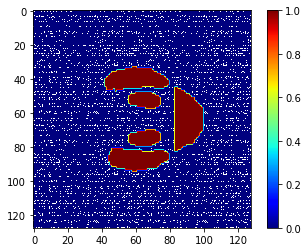

slice_nr  21


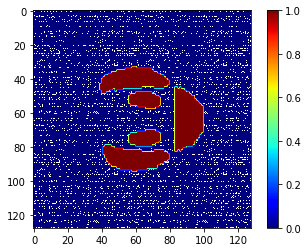

slice_nr  22


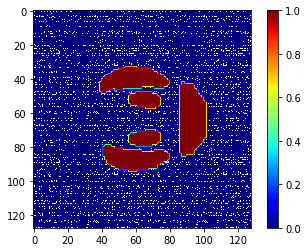

slice_nr  23


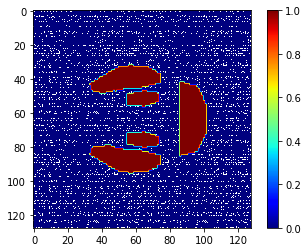

slice_nr  24


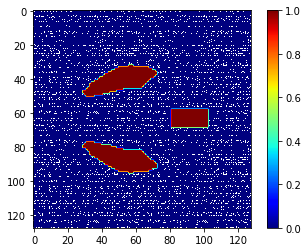

slice_nr  25


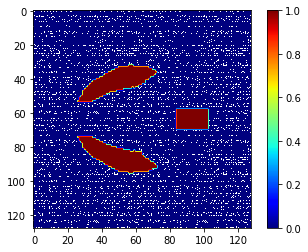

slice_nr  26


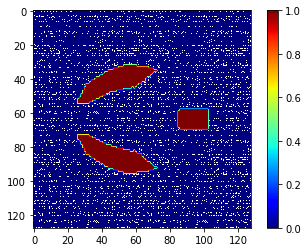

slice_nr  27


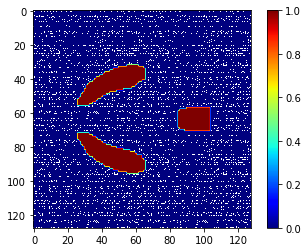

slice_nr  28


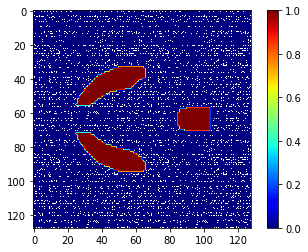

slice_nr  29


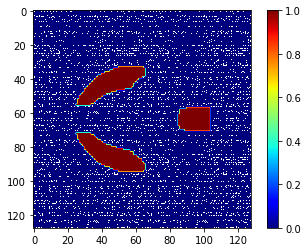

slice_nr  30


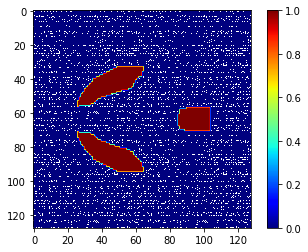

slice_nr  31


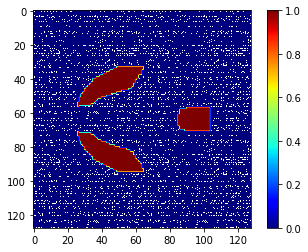

slice_nr  32


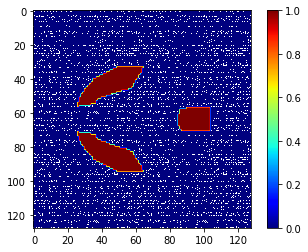

slice_nr  33


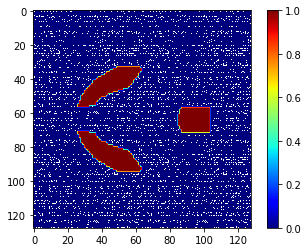

slice_nr  34


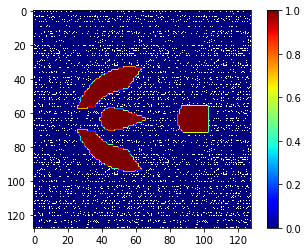

slice_nr  35


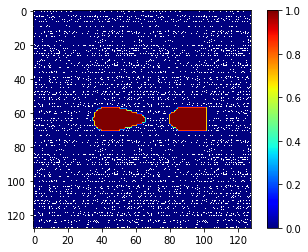

slice_nr  36


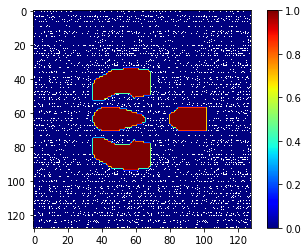

slice_nr  37


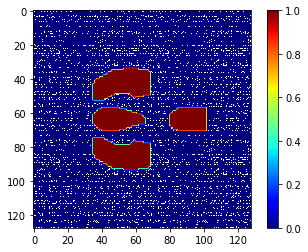

slice_nr  38


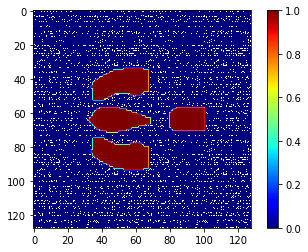

slice_nr  39


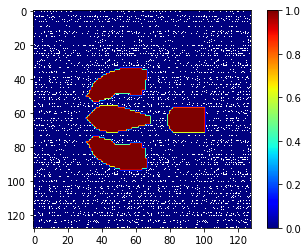

slice_nr  40


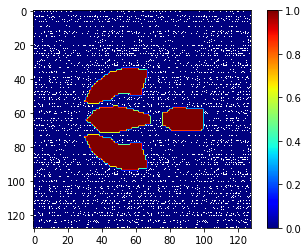

slice_nr  41


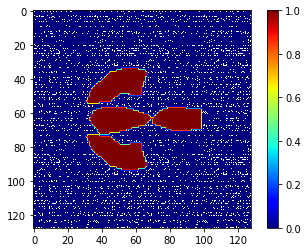

slice_nr  42


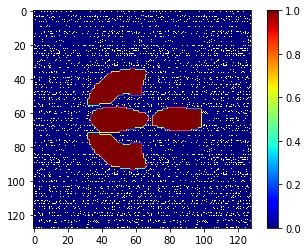

slice_nr  43


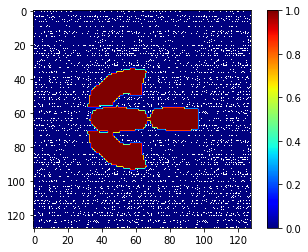

slice_nr  44


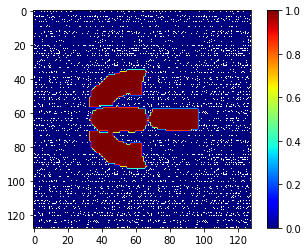

slice_nr  45


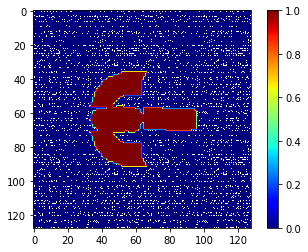

slice_nr  46


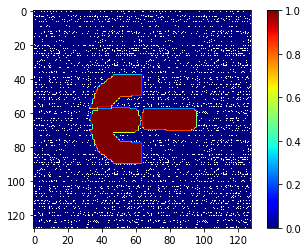

slice_nr  47


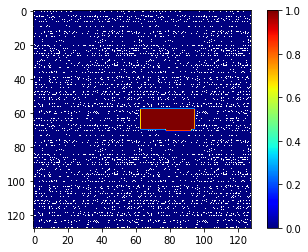

slice_nr  48


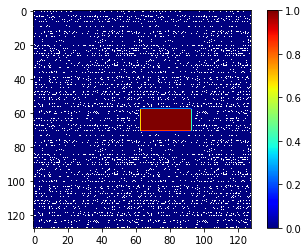

slice_nr  49


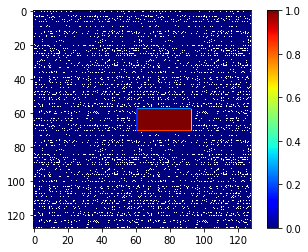

slice_nr  50


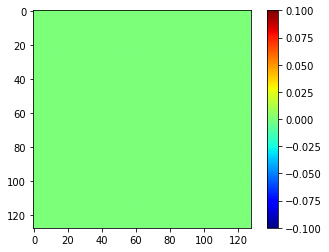

slice_nr  51


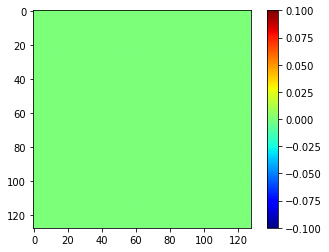

slice_nr  52


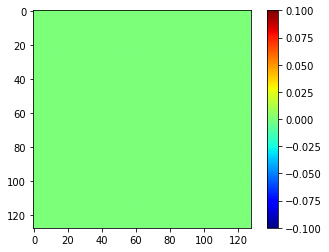

slice_nr  53


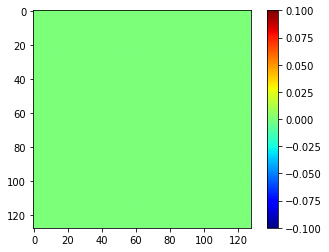

slice_nr  54


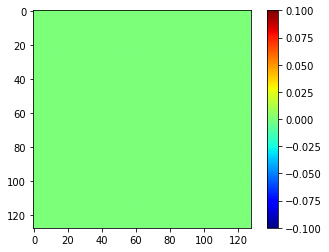

slice_nr  55


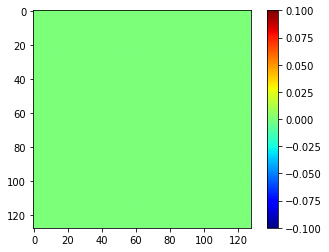

slice_nr  56


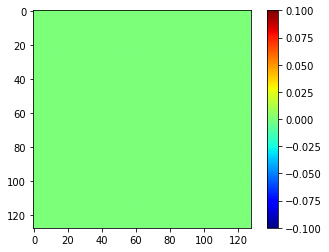

slice_nr  57


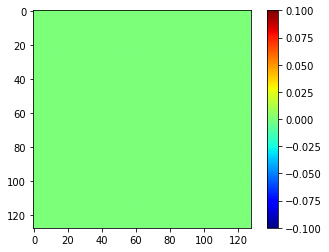

slice_nr  58


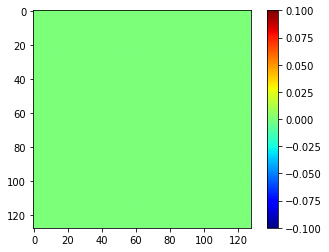

slice_nr  59


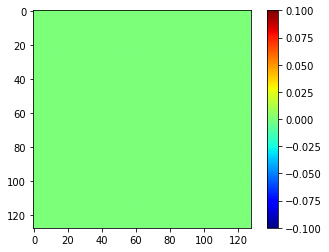

slice_nr  60


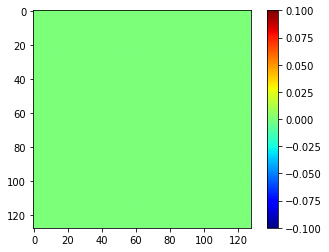

slice_nr  61


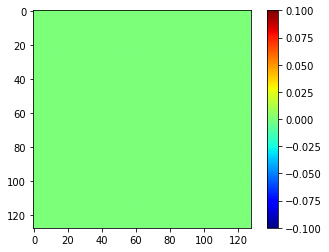

slice_nr  62


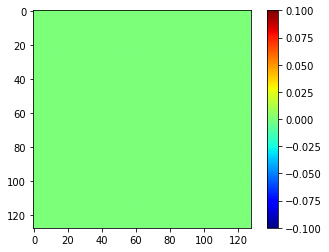

slice_nr  63


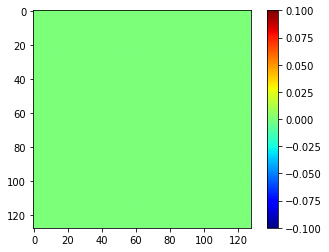

In [ ]:
ROI_original = np.load(root_path + '/ROI/ROIs_normalized_with_64axial_slices.npy')
ROI_original[ROI_original >= 0.1] = 1
np.save(root_path + '/ROI/ROIs_with_64axial_slices_binary.npy', ROI_original)

map = np.load(root_path + '/ROI/ROIs_with_64axial_slices_binary.npy')

for i in range(64):
  print("slice_nr ", i)
  show_scan_plot(map, i)
  plt.show()

# ROI

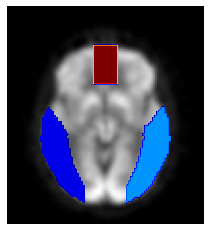

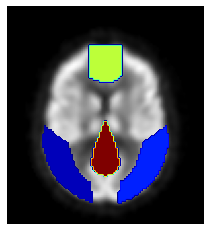

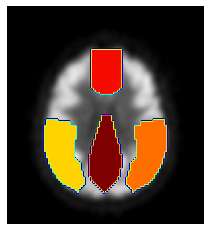

In [ ]:
roi = np.load(root_path+"/ROI/ROIs_normalized_with_64axial_slices.npy")
scan = np.load(root_path+"/PETs_numpy/normalized/200.npy")

cmap = plt.get_cmap('jet')
cmap.set_under("#FF000000")

plt.imshow(np.rot90(scan[16:112,16:122,25]), cmap='gray', zorder=1)
plt.imshow(np.rot90(roi[16:112,16:122,25]), cmap=cmap, vmin=0.05, zorder=10)
plt.axis('off')
plt.savefig(f"/content/drive/My Drive/plots/original_ROI_slice_nr_25.pdf", 
                bbox_inches ="tight")
plt.show()

plt.imshow(np.rot90(scan[16:112,16:122,34]), cmap='gray', zorder=1)
plt.imshow(np.rot90(roi[16:112,16:122,34]), cmap=cmap, vmin=0.05, zorder=10)
plt.axis('off')
plt.savefig(f"/content/drive/My Drive/plots/original_ROI_slice_nr_34.pdf", 
                bbox_inches ="tight")
plt.show()

plt.imshow(np.rot90(scan[16:112,16:122,39]), cmap='gray', zorder=1)
plt.imshow(np.rot90(roi[16:112,16:122,39]), cmap=cmap, vmin=0.05, zorder=10)
plt.axis('off')
plt.savefig(f"/content/drive/My Drive/plots/original_ROI_slice_nr_39.pdf", 
                bbox_inches ="tight")
plt.show()

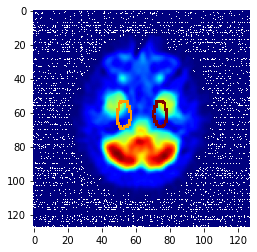

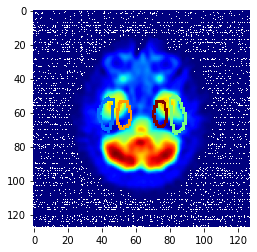

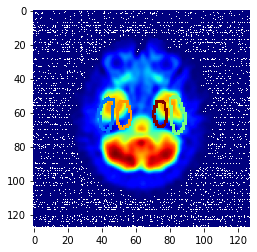

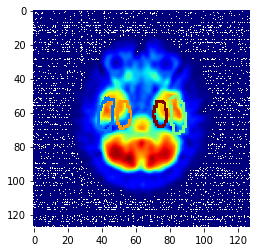

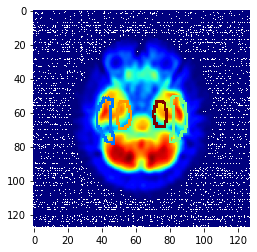

...

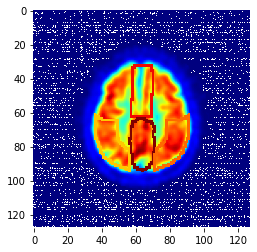

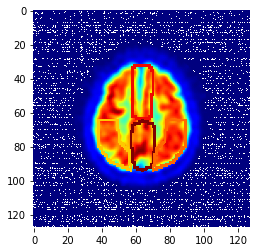

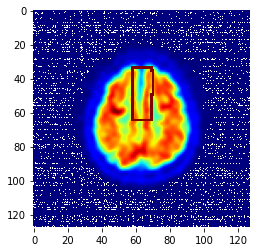

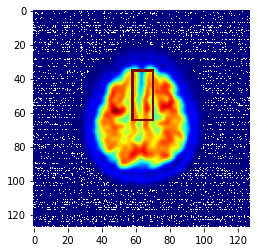

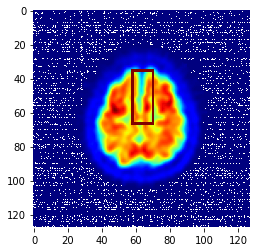

In [ ]:
import seaborn as sns
roi = np.load(root_path+"/ROI/ROIs_normalized_with_64axial_slices.npy")
scan = np.load(root_path+"/PETs_numpy/normalized/200.npy")

cmap = plt.get_cmap('jet')
cmap.set_under("#FF000000")

for slice_nr in range(64):
  if len(np.unique(roi[:,:,slice_nr])) == 1:
    continue

  roi2 = np.zeros((128,128))
  for i in range(0,128):
    for j in range(0,128):
      if i+1 == 128 or i-1 == -1 or j+1 == 128 or j-1 == -1:
        continue
      if roi[i+1,j,slice_nr] == roi[i,j,slice_nr] and roi[i-1,j,slice_nr] == roi[i,j,slice_nr] and roi[i,j+1,slice_nr] == roi[i,j,slice_nr] and roi[i,j-1,slice_nr] == roi[i,j,slice_nr] and roi[i+1,j+1,slice_nr] == roi[i,j,slice_nr] and roi[i+1,j-1,slice_nr] == roi[i,j,slice_nr] and roi[i-1,j-1,slice_nr] == roi[i,j,slice_nr] and roi[i-1,j+1,slice_nr] == roi[i,j,slice_nr]:
        roi2[i,j] = 0
      else:
        roi2[i,j] = roi[i,j,slice_nr]

  # roi3 = np.zeros((128,128))
  # for i in range(0,128):
  #   for j in range(0,128):
  #     if i+1 == 128 or i-1 == -1 or j+1 == 128 or j-1 == -1:
  #       continue
  #     if roi2[i,j] != 0:
  #       roi3[i,j] = roi2[i,j]
  #       if roi3[i+1,j] == 0:
  #          roi3[i+1,j] = 11 
  #       if roi3[i,j+1] == 0:
  #         roi3[i,j+1] = 11
  #       if roi3[i+1,j+1] == 0:
  #          roi3[i+1,j+1] = 11

  roi3=roi2
  roi3 = roi3*10
  plt.imshow(np.rot90(scan[:,:,slice_nr]), cmap='jet')

  ax = sns.heatmap(np.rot90(roi3), vmin=0.05, cmap=cmap, xticklabels=20, yticklabels=20, cbar=False)
  plt.yticks(rotation=0)

  plt.savefig(f"/content/drive/My Drive/plots/ROI_slice_nr_{slice_nr}.pdf", 
                bbox_inches ="tight")
  plt.show()


### Print scans with fixations and ROI

In [ ]:
nc_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/nc_allData.pkl")
mci_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/mci_allData.pkl")
ad_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/ad_allData.pkl")

allData = pd.concat([nc_allData, mci_allData, ad_allData], ignore_index = True)

In [ ]:
def show_scan_fixations_roi(allData, slice_nr, scan_index):
  print("Subject ", allData.at[scan_index, 'Subject ID'])
  one_slice_2d = copy.deepcopy(allData.at[scan_index, 'Scan'][16:112,16:112,slice_nr]) # array with one slice of a single patient
  roi = np.load(root_path+"/ROI/ROIs_with_64axial_slices_binary.npy")
  plt.imshow(np.rot90(one_slice_2d), cmap='gray')
  plt.axis('off')
  ax = sns.heatmap(np.rot90(roi[16:112,16:112,slice_nr]), vmin=0.05, cmap='jet', xticklabels=20, yticklabels=20, cbar=False)
  plt.yticks(rotation=0)


  locations = []
  for scan in range(0, len(allData)):
    if allData.at[scan, 'Has Fix'] == 1 and len(allData.at[scan, 'Fixations'][slice_nr]):
      locations.extend(allData.at[scan, 'Fixations'][slice_nr])

  x = [[], []]
  coord = coordinates_transform(locations)
  x[1] = -(coord[0]-64)+64
  x[0] = (coord[1]-64)+64

  # Calculate the point density
  xy = np.vstack(x)
  z = gaussian_kde(xy)(xy)

  plt.scatter(x[0]-16, x[1]-16, s=3, c=z)

  plt.savefig(f"/content/drive/My Drive/plots/original_scan_all_fixations_roi_{slice_nr}.pdf", 
               bbox_inches ="tight")
  
  plt.show() 

Subject  011_S_0005


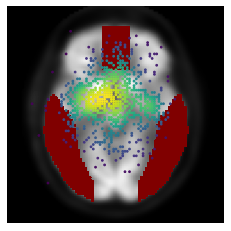

Subject  011_S_0005


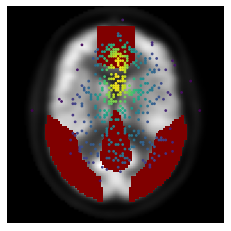

Subject  011_S_0005


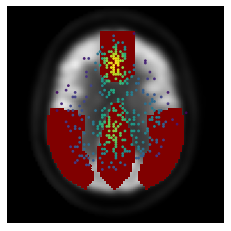

In [ ]:
show_scan_fixations_roi(allData, 25, 12)
show_scan_fixations_roi(allData, 34, 12)
show_scan_fixations_roi(allData, 39, 12)

## ROI with fixations on top

In [ ]:
def show_all_scans_fixations_roi(allData, slice_nr, scan_index):
  print("Subject ", allData.at[scan_index, 'Subject ID'])
  one_slice_2d = copy.deepcopy(allData.at[scan_index, 'Scan'][:,:,slice_nr]) # array with one slice of a single patient
  roi = np.load(root_path+"/ROI/ROIs_normalized_with_64axial_slices.npy")
  plt.imshow(np.rot90(one_slice_2d), cmap='jet')
  ax = sns.heatmap(np.rot90(roi[:,:,slice_nr]), vmin=0.05, cmap=cmap, xticklabels=20, yticklabels=20, cbar=False)
  plt.yticks(rotation=0)

  locations = []
  for scan in range(0, len(allData)):
    if allData.at[scan, 'Has Fix'] == 1 and len(allData.at[scan, 'Fixations'][slice_nr]):
      locations.extend(allData.at[scan, 'Fixations'][slice_nr])

  x = [[], []]
  coord = coordinates_transform(locations)
  x[1] = -(coord[0]-64)+64
  x[0] = (coord[1]-64)+64
  plt.scatter(x[0], x[1], s=10)

  plt.savefig(f"/content/drive/My Drive/plots/scan_all_fixations_{allData.at[scan_index, 'Class']}_{allData.at[scan_index, 'Subject ID']}_roi.pdf", 
               bbox_inches ="tight")
  
  plt.show() 

Subject  010_S_0904


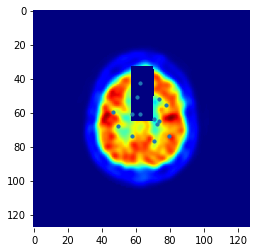

Subject  010_S_0904


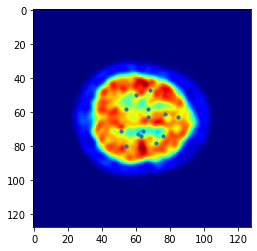

In [ ]:
show_all_scans_fixations_roi(mci_allData, 47, 12)
show_one_scan_with_all_scans_fixations_ontop(mci_allData, 47, 12)

## Percentage of fixations that fall on ROI

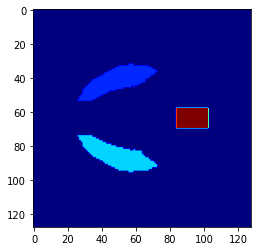

Total number of fixation points:  4261
36.21 % of fixations were on the ROI


In [ ]:
slice_nr = 0
count = 0
total_points = 0
roi = np.load(root_path+"/ROI/ROIs_normalized_with_64axial_slices.npy")
plt.imshow(roi[:,:,25], cmap='jet')
plt.show()

for scan in range(0,1025):
  if allData.at[scan, 'Has Fix'] == 0:
    continue

  for slice_nr in range(0,60):
      if len(allData.at[scan, 'Fixations'][slice_nr]) == 0:
        continue

      for point in allData.at[scan, 'Fixations'][slice_nr]:
        i, j = coordinates_transform(point)
        total_points += 1
        if roi[j,i,slice_nr] != 0:
          count += 1

print("Total number of fixation points: ", total_points)
print(str(round(count/total_points*100, 2)) + " % of fixations were on the ROI")

## Percentage of time spent inside ROI

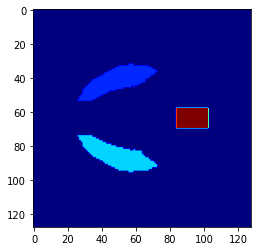

Total number of fixation points:  4261
36.21 % of fixations were on the ROI
Total duration:  1417999
37.36 % of time looking at the ROI


In [ ]:
slice_nr = 0
count = 0
count_dur = 0
total_points = 0
total_dur = 0

roi = np.load(root_path+"/ROI/ROIs_normalized_with_64axial_slices.npy")
plt.imshow(roi[:,:,25], cmap='jet')
plt.show()

for scan in range(0,1025):
  if allData.at[scan, 'Has Fix'] == 0:
    continue

  for slice_nr in range(0,60):
      if len(allData.at[scan, 'Fixations'][slice_nr]) == 0:
        continue

      for point in allData.at[scan, 'Durations'][slice_nr]:
        i, j, dur = point[0], point[1], point[2]
        total_points += 1
        total_dur += dur
        if roi[j,i,slice_nr] != 0:
          count += 1
          count_dur += dur


print("Total number of fixation points: ", total_points)
print(str(round(count/total_points*100, 2)) + " % of fixations were on the ROI")

print("Total duration: ", total_dur)
print(str(round(count_dur/total_dur*100, 2)) + " % of time looking at the ROI")

# Print saliency maps

In [ ]:
def show_scan_saliency_map(ID, slice_nr, type):
  scan = np.load(root_path + '/PETs_numpy/normalized_with_64axial_slices/' + str(ID) + '.npy')
  one_slice_2d = scan[:,:,slice_nr] # array with one slice of a single patient
  plt.imshow(np.rot90(one_slice_2d), cmap='gray', zorder=0)

  sal_map = np.load(root_path + '/attention_maps/'+type+'/'+ str(ID) + '.npy')
  one_slice_2d = sal_map[:,:,slice_nr] # array with one slice of a single patient
  cmap = plt.get_cmap('jet')
  #cmap.set_under("#FF000000")
  one_slice_2d_normalized = one_slice_2d/np.max(one_slice_2d)

  plt.imshow(np.rot90(one_slice_2d), cmap=cmap, alpha=np.rot90(one_slice_2d_normalized), zorder=10)
  # plt.colorbar()
  plt.clim(0,1)

  plt.savefig(f"/content/drive/My Drive/plots/saliency_maps/saliency_map_{type}_scan_ID_{ID}_slice_nr_{slice_nr}.pdf",
              bbox_inches ="tight")
  plt.show()

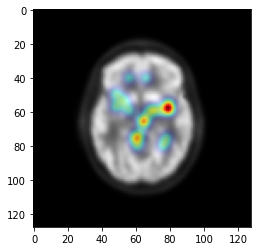

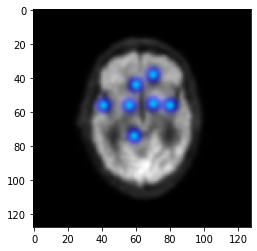

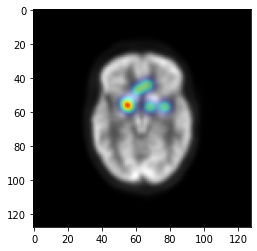

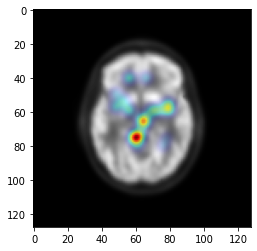

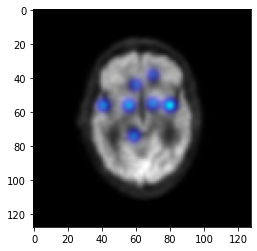

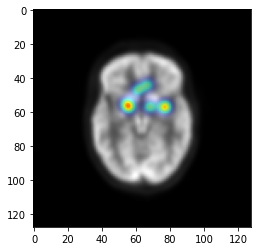

In [ ]:
ID = 188
slice_nr = 25
show_scan_saliency_map(ID, slice_nr, "Location_based")

ID = 441
slice_nr = 25
show_scan_saliency_map(ID, slice_nr, "Location_based")

ID = 884
slice_nr = 25
show_scan_saliency_map(ID, slice_nr, "Location_based")

ID = 188
slice_nr = 25
show_scan_saliency_map(ID, slice_nr, "Duration_based")

ID = 441
slice_nr = 25
show_scan_saliency_map(ID, slice_nr, "Duration_based")

ID = 884
slice_nr = 25
show_scan_saliency_map(ID, slice_nr, "Duration_based")

# Number of fixations per axial cut

In [ ]:
nc_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/nc_allData.pkl")
mci_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/mci_allData.pkl")
ad_allData = pd.read_pickle("/content/drive/My Drive/dataset/pandas_dataframes/ad_allData.pkl")

allData = pd.concat([nc_allData, mci_allData, ad_allData], ignore_index = True)

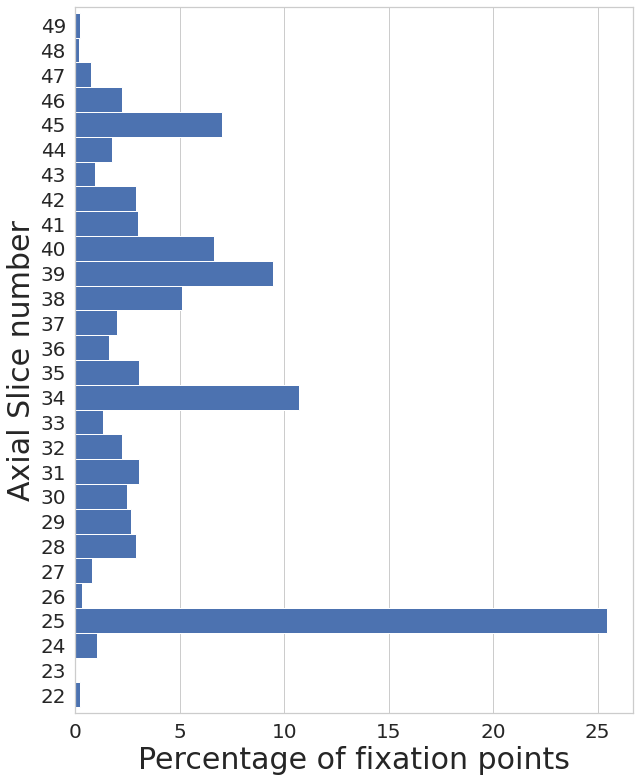

Total number of fixations  4261
Slice 25 has  1084.0  fixation points
Slice 25 has  25.44003754987092  % of fixations


In [ ]:
import seaborn as sns
import matplotlib as mpl

def fixations_per_slice(alldata):
  nr_fix = np.zeros((60))
  total_nr_fixations = 0

  # get scans with fixation points
  for scan_idx in range(0, len(alldata)):
    if allData.at[scan_idx, 'Has Fix'] == 0:
      continue

    for slice_nr in range(0,60):
        if len(allData.at[scan_idx, 'Fixations'][slice_nr]) != 0:
          nr_fix[slice_nr] += len(allData.at[scan_idx, 'Fixations'][slice_nr])
          total_nr_fixations += len(allData.at[scan_idx, 'Fixations'][slice_nr])


  percentage = nr_fix/total_nr_fixations*100
  df = pd.DataFrame({'val': list(percentage[22:50]), 'lab': list(range(22,50))})
  ax = df.plot.barh(x='lab', y='val', figsize=(10,13), width=1)
  ax.grid(axis='y')
  plt.ylabel("Axial Slice number", fontsize=30)
  plt.xlabel("Percentage of fixation points", fontsize=30)
  ax.get_legend().remove()
  ax.set_xticklabels(list(range(0,27, 5)), rotation=0, fontsize=20)
  ax.set_yticklabels(list(range(22,50)), rotation=0, fontsize=20)
  #ax.set_yticks([0, 5, 10, 15])
  #plt.yticks(np.arange(22, 50, 5))

  plt.savefig(f"/content/drive/My Drive/plots/fixations/fixations_per_axial_cut.pdf", bbox_inches ="tight")
  
  plt.show()

  # print the result
  print("Total number of fixations ", total_nr_fixations)
  print("Slice 25 has ", nr_fix[25], " fixation points")
  print("Slice 25 has ", nr_fix[25]/total_nr_fixations*100, " % of fixations")

fixations_per_slice(allData)

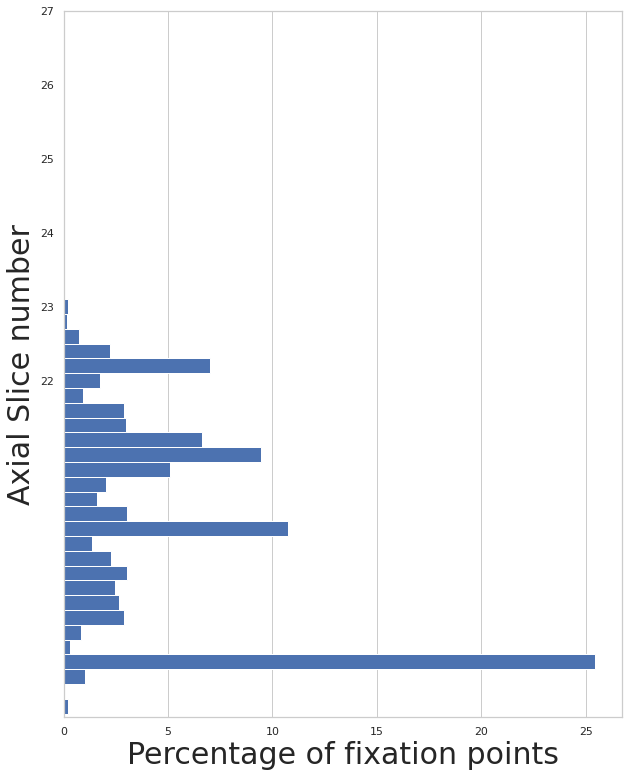

Total number of fixations  4261
Slice 25 has  1084.0  fixation points
Slice 25 has  25.44003754987092  % of fixations


In [ ]:
# fixations_per_slice(nc_allData)
# fixations_per_slice(mci_allData)
# fixations_per_slice(ad_allData)